In [42]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.model_selection import train_test_split
from tensorflow.keras.callbacks import EarlyStopping,ModelCheckpoint
import matplotlib.pyplot as plt
import shap
shap.initjs()
import ipywidgets as widgets

pd.set_option('display.max_columns', None)
np.set_printoptions(threshold=np.inf)

In [2]:
dir_final_save  = 'D:/rohan/thesis/Projects/Machine_Learning/Data/Combined_Data/'
dir_block_save  = 'D:/rohan/thesis/Projects/Machine_Learning/Data/Combined_Data/Blockwise/'
dir_blisk_save  = 'D:/rohan/thesis/Projects/Machine_Learning/Data/Combined_Data/Blisk/'

In [5]:
print('Enter 1 for single file training, 2 for blockwise training, 3 for full-blisk training')

def single():
    dir_final_save  = 'D:/rohan/thesis/Projects/Machine_Learning/Data/Combined_Data/'
    print('Input block number and angle')
    block = input()
    angle = input()
    df = pd.read_excel(str(dir_final_save)+'finaldf_forward_with_compensation'+str(block)+'__'+str(int(angle))+'.xlsx', engine='openpyxl')
    print(df.shape)
    return df

def block():
    dir_block_save  = 'D:/rohan/thesis/Projects/Machine_Learning/Data/Combined_Data/Blockwise/'
    print('Input block number')
    block = input()
    
    df = pd.DataFrame()
    with open(str(dir_block_save)+str(block)+'.csv') as fl:
        chunk_iter = pd.read_csv(fl, chunksize = 1000)
        for chunk in chunk_iter:
            df = pd.concat([df,chunk])
    
    print(df.shape)
    return df
    
def blisk():
    dir_blisk_save  = 'D:/rohan/thesis/Projects/Machine_Learning/Data/Combined_Data/Blisk/'
    
    df = pd.DataFrame()
    with open(str(dir_blisk_save)+'cleaned_full_blisk'+'.csv') as fl:
        chunk_iter = pd.read_csv(fl, chunksize = 1000)
        for chunk in chunk_iter:
            df = pd.concat([df,chunk])
    
    
    print(df.shape)
    return df
    
switch = { 
           1 : single,
           2 : block,
           3 : blisk,
          }

df = switch[int(input())]()

Enter 1 for single file training, 2 for blockwise training, 3 for full-blisk training
2
Input block number
4030
(501072, 74)


In [6]:
print(df.columns, len(df.columns))
df.iloc[0:5]

Index(['Leading angle', 'Side tilt angle', 'Surface Contact point X',
       'Surface contact point Y', 'Surface contact point z',
       'Surface Orietation X', 'Surface Orietation Y', 'Surface Orietation Z',
       'Tool Tip Point X', 'Tool Tip Point Y', 'Tool Tip Point Z',
       'Tool Orientation X', 'Tool Orientation Y', 'Tool Orientation Z',
       'time', 'MachineX', 'MachineY', 'MachineZ', 'MachineA', 'MachineC',
       'LoadSpindle', 'TransfX', 'TransfY', 'TransfZ', 'TransfI', 'TransfJ',
       'TransfK', 'executionDuration', 'previousExecutionDuration',
       'relativeTimetoPreviousCall program number', 'timeStamp', 'Tool Length',
       'Tool Radius', 'G54-X', 'G54-Y', 'G54-Z', 'G54-A', 'G54-C',
       'ProgNumber', 'Blade', 'Fx_mean', 'Fy_mean', 'Fz_mean', 'Mz_mean',
       'Fc_mean', 'Fa_mean', 'FcN_mean', 'Fres_mean', 'Fx_sigma', 'Fy_sigma',
       'Fz_sigma', 'Mz_sigma', 'Fc_sigma', 'Fa_sigma', 'FcN_sigma',
       'Fres_sigma', 'Fx_max', 'Fy_max', 'Fz_max', 'Mz_max', 'F

,Leading angle,Side tilt angle,Surface Contact point X,Surface contact point Y,Surface contact point z,Surface Orietation X,Surface Orietation Y,Surface Orietation Z,Tool Tip Point X,Tool Tip Point Y,Tool Tip Point Z,Tool Orientation X,Tool Orientation Y,Tool Orientation Z,time,MachineX,MachineY,MachineZ,MachineA,MachineC,LoadSpindle,TransfX,TransfY,TransfZ,TransfI,TransfJ,TransfK,executionDuration,previousExecutionDuration,relativeTimetoPreviousCall program number,timeStamp,Tool Length,Tool Radius,G54-X,G54-Y,G54-Z,G54-A,G54-C,ProgNumber,Blade,Fx_mean,Fy_mean,Fz_mean,Mz_mean,Fc_mean,Fa_mean,FcN_mean,Fres_mean,Fx_sigma,Fy_sigma,Fz_sigma,Mz_sigma,Fc_sigma,Fa_sigma,FcN_sigma,Fres_sigma,Fx_max,Fy_max,Fz_max,Mz_max,Fc_max,Fa_max,FcN_max,Fres_max,compensation_x,compensation_y,compensation_z,tcp_error,block,angle,Tool Tip Point Machine X,Tool Tip Point Machine Y,Tool Tip Point Machine Z,Tool Point Deviation
0,1.025327,1.497188,-20.446116,188.341074,12.450603,0.602097,0.139527,-0.786137,-16.844723,183.200439,7.219550,0.002015,0.996335,0.085508,28.071663,-18.434133,-80.257000,-182.519567,-84.909233,359.535700,10.127273,-16.945736,183.709789,7.166708,0.084593,-0.011102,-0.995779,0.004402,0.004030,0.011305,6.375082e+10,226.2667,6,0,0,-510.483,0,0,4030,0,5.623797,8.255307,0.285052,0.010980,1.830078,12.127666,12.009963,12.229764,9.366263,11.682167,0.723387,0.010866,1.810945,13.322762,13.298453,13.252629,40.664199,44.293546,3.364111,0.072226,12.037740,55.887366,55.804441,55.887366,0.020514,-0.009859,-0.006232,0.346064,4030,0,-16.927003,183.302846,7.158856,0.144710
1,1.037140,1.497428,-20.103538,188.384781,12.720408,0.601541,0.136221,-0.787142,-16.536156,183.224411,7.483672,0.007127,0.996317,0.085451,30.854996,-18.975000,-80.792000,-182.751600,-84.960700,359.229000,10.118182,-16.505609,183.613726,7.514275,0.121539,-0.063794,-0.990535,0.008266,0.002311,0.021011,6.375082e+10,226.2667,6,0,0,-510.483,0,0,4030,0,5.547367,8.067081,0.286644,0.010923,1.820429,11.915896,11.825573,12.035310,9.486492,11.574224,0.777082,0.011132,1.855299,13.334867,13.306037,13.253098,41.596371,45.068926,4.267612,0.078394,13.065656,55.352929,55.348989,55.352929,0.020496,-0.009842,-0.006232,0.197715,4030,0,-16.487789,183.207002,7.506631,0.056299
2,1.063867,1.496892,-19.075184,188.505262,13.524887,0.600095,0.127500,-0.789702,-15.609547,183.293884,8.273438,0.022639,0.996095,0.085342,28.116666,-20.986700,-81.374533,-182.732367,-84.922233,358.350567,10.115152,-15.702014,183.805812,8.219364,0.024203,-0.095096,-0.994580,0.003178,0.005853,0.013356,6.375082e+10,226.2667,6,0,0,-510.483,0,0,4030,0,6.622662,9.030463,0.307360,0.011609,1.934865,13.447439,13.349052,13.578434,10.266216,12.020397,0.746043,0.011489,1.914758,13.933091,13.892675,13.825420,43.871079,47.871194,2.929639,0.069914,11.652329,55.186611,55.134138,55.199364,0.020494,-0.009843,-0.006256,0.347182,4030,0,-15.687424,183.398492,8.211542,0.144357
3,1.091720,1.495321,-17.707767,188.653570,14.584854,0.599511,0.116571,-0.791832,-14.371705,183.380798,9.320589,0.043650,0.995395,0.085348,30.097499,-23.468100,-82.593360,-183.092360,-84.956640,357.168540,10.112727,-14.405321,183.806780,9.291735,-0.108347,-0.075632,-0.990729,0.003459,0.004215,0.007361,6.375082e+10,226.2667,6,0,0,-510.483,0,0,4030,0,6.402424,8.759599,0.311807,0.012446,2.074301,13.005755,12.902657,13.144293,9.956185,12.200021,0.769876,0.011708,1.951274,14.058376,14.014569,13.954273,40.637618,44.979734,3.074642,0.074139,12.356422,56.435649,56.333157,56.448736,0.020464,-0.009820,-0.006275,0.280317,4030,0,-14.394761,183.399263,9.284015,0.047013
4,1.099514,1.495131,-17.360660,188.689874,14.852277,0.598619,0.113723,-0.792920,-14.061735,183.401505,9.581305,0.048948,0.995146,0.085377,30.945000,-24.188100,-82.961600,-183.218300,-84.968600,356.821300,10.127273,-14.017587,183.793557,9.609298,-0.140555,-0.035970,-0.989419,0.006011,0.002095,0.007024,6.375082e+10,226.2667,6,0,0,-510.483,0,0,4030,0,6.002611,7.057673,0.415934,0.011634,1.938957,11.355235,11.237952,11.518300,9.3371

In [7]:
def data(df):
    X = df.drop(['Tool Point Deviation'], axis=1).copy(deep=True).to_numpy(dtype=np.float64)
    #X = df.drop(['Tool Point Deviation','Tool Tip Point Machine X', 'Tool Tip Point Machine Y',
       'Tool Tip Point Machine Z',], axis=1).copy(deep=True).to_numpy(dtype=np.float64)
    y = df['Tool Point Deviation'].copy(deep=True).to_numpy(dtype=np.float64)
    return X,y

In [8]:
X,y = data(df)

In [9]:
# Normalization

scaler1 = MinMaxScaler(feature_range=(0,1))
scaler1.fit(X)
X_scaled = scaler1.transform(X)
# scaler1.inverse_transform(X_scaled)

scaler2 = MinMaxScaler(feature_range=(0,1))
scaler2.fit(y[:,np.newaxis])
y_scaled = scaler2.transform(y[:,np.newaxis])
# scaler2.inverse_transform(y_scaled)

In [10]:
initializer1 = tf.keras.initializers.GlorotUniform()
initializer2 = tf.keras.initializers.HeNormal()

inputs = tf.keras.Input(shape=(X.shape[1]), dtype=tf.float64) 
x = layers.Dense(64, activation="relu",  kernel_initializer=initializer2)(inputs)
x = layers.Dense(128, activation="relu",  kernel_initializer=initializer2)(x)
#x = layers.Dense(128, activation="tanh", kernel_initializer=initializer1)(x)
x = layers.Dense(64, activation="relu", kernel_initializer=initializer2)(x)
outputs = layers.Dense(1, activation="linear",kernel_initializer=initializer2)(x)

In [11]:
model = tf.keras.Model(inputs=inputs, outputs=outputs, name="functional_model")
model.summary()

Model: "functional_model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 73)]              0         
_________________________________________________________________
dense (Dense)                (None, 64)                4736      
_________________________________________________________________
dense_1 (Dense)              (None, 128)               8320      
_________________________________________________________________
dense_2 (Dense)              (None, 64)                8256      
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 65        
Total params: 21,377
Trainable params: 21,377
Non-trainable params: 0
_________________________________________________________________


In [12]:
#tf.keras.utils.plot_model(model, "functional_model.png", show_shapes=True)

In [13]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_scaled, test_size=0.33, random_state=42, shuffle=True)

In [14]:
model.compile(
    loss = tf.keras.losses.MeanSquaredError(reduction="auto", name="mse"),
    #loss = tf.keras.losses.Huber(name='huber_loss'),
    optimizer = tf.keras.optimizers.Adam(learning_rate=0.01),
    metrics = [tf.keras.metrics.MeanSquaredError(),tf.keras.metrics.RootMeanSquaredError()],
             )


In [15]:
early_stopping = EarlyStopping(monitor='val_loss', patience=100, mode='min')
model_checkpoint = ModelCheckpoint('custom_model.h5', monitor='val_loss', mode='min', save_best_only=True, verbose=1)

In [16]:
history = model.fit(X_train, y_train, epochs=1000,validation_data=(X_test,y_test), verbose=1,callbacks=[early_stopping,model_checkpoint], batch_size = 100)

Epoch 1/1000
3358/3358 [==============================] - 5s 1ms/step - loss: 0.0137 - mean_squared_error: 0.0137 - root_mean_squared_error: 0.1171 - val_loss: 0.0090 - val_mean_squared_error: 0.0090 - val_root_mean_squared_error: 0.0950

Epoch 00001: val_loss improved from inf to 0.00903, saving model to custom_model.h5
Epoch 2/1000
3358/3358 [==============================] - 5s 1ms/step - loss: 0.0087 - mean_squared_error: 0.0087 - root_mean_squared_error: 0.0931 - val_loss: 0.0081 - val_mean_squared_error: 0.0081 - val_root_mean_squared_error: 0.0898

Epoch 00002: val_loss improved from 0.00903 to 0.00806, saving model to custom_model.h5
Epoch 3/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0083 - mean_squared_error: 0.0083 - root_mean_squared_error: 0.0914 - val_loss: 0.0079 - val_mean_squared_error: 0.0079 - val_root_mean_squared_error: 0.0892

Epoch 00003: val_loss improved from 0.00806 to 0.00795, saving model to custom_model.h5
Epoch 4/1000
3358/3358 


Epoch 00027: val_loss did not improve from 0.00588
Epoch 28/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0060 - mean_squared_error: 0.0060 - root_mean_squared_error: 0.0776 - val_loss: 0.0057 - val_mean_squared_error: 0.0057 - val_root_mean_squared_error: 0.0757

Epoch 00028: val_loss improved from 0.00588 to 0.00574, saving model to custom_model.h5
Epoch 29/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0060 - mean_squared_error: 0.0060 - root_mean_squared_error: 0.0774 - val_loss: 0.0053 - val_mean_squared_error: 0.0053 - val_root_mean_squared_error: 0.0731

Epoch 00029: val_loss improved from 0.00574 to 0.00535, saving model to custom_model.h5
Epoch 30/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0060 - mean_squared_error: 0.0060 - root_mean_squared_error: 0.0773 - val_loss: 0.0075 - val_mean_squared_error: 0.0075 - val_root_mean_squared_error: 0.0865

Epoch 00030: val_loss did not improve from 0.00535
E


Epoch 00082: val_loss did not improve from 0.00421
Epoch 83/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0047 - mean_squared_error: 0.0047 - root_mean_squared_error: 0.0685 - val_loss: 0.0041 - val_mean_squared_error: 0.0041 - val_root_mean_squared_error: 0.0644

Epoch 00083: val_loss improved from 0.00421 to 0.00415, saving model to custom_model.h5
Epoch 84/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0047 - mean_squared_error: 0.0047 - root_mean_squared_error: 0.0685 - val_loss: 0.0048 - val_mean_squared_error: 0.0048 - val_root_mean_squared_error: 0.0690

Epoch 00084: val_loss did not improve from 0.00415
Epoch 85/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0048 - mean_squared_error: 0.0048 - root_mean_squared_error: 0.0696 - val_loss: 0.0059 - val_mean_squared_error: 0.0059 - val_root_mean_squared_error: 0.0765

Epoch 00085: val_loss did not improve from 0.00415
Epoch 86/1000
3358/3358 [=============


Epoch 00137: val_loss did not improve from 0.00392
Epoch 138/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0045 - mean_squared_error: 0.0045 - root_mean_squared_error: 0.0668 - val_loss: 0.0041 - val_mean_squared_error: 0.0041 - val_root_mean_squared_error: 0.0640

Epoch 00138: val_loss did not improve from 0.00392
Epoch 139/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0044 - mean_squared_error: 0.0044 - root_mean_squared_error: 0.0663 - val_loss: 0.0040 - val_mean_squared_error: 0.0040 - val_root_mean_squared_error: 0.0634

Epoch 00139: val_loss did not improve from 0.00392
Epoch 140/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0044 - mean_squared_error: 0.0044 - root_mean_squared_error: 0.0663 - val_loss: 0.0040 - val_mean_squared_error: 0.0040 - val_root_mean_squared_error: 0.0635

Epoch 00140: val_loss did not improve from 0.00392
Epoch 141/1000
3358/3358 [==============================] - 4s 1ms/step 


Epoch 00165: val_loss did not improve from 0.00383
Epoch 166/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0043 - mean_squared_error: 0.0043 - root_mean_squared_error: 0.0657 - val_loss: 0.0064 - val_mean_squared_error: 0.0064 - val_root_mean_squared_error: 0.0802

Epoch 00166: val_loss did not improve from 0.00383
Epoch 167/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0044 - mean_squared_error: 0.0044 - root_mean_squared_error: 0.0664 - val_loss: 0.0041 - val_mean_squared_error: 0.0041 - val_root_mean_squared_error: 0.0644

Epoch 00167: val_loss did not improve from 0.00383
Epoch 168/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0043 - mean_squared_error: 0.0043 - root_mean_squared_error: 0.0654 - val_loss: 0.0043 - val_mean_squared_error: 0.0043 - val_root_mean_squared_error: 0.0659

Epoch 00168: val_loss did not improve from 0.00383
Epoch 169/1000
3358/3358 [==============================] - 4s 1ms/step 


Epoch 00193: val_loss did not improve from 0.00379
Epoch 194/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0045 - mean_squared_error: 0.0045 - root_mean_squared_error: 0.0672 - val_loss: 0.0040 - val_mean_squared_error: 0.0040 - val_root_mean_squared_error: 0.0635

Epoch 00194: val_loss did not improve from 0.00379
Epoch 195/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0043 - mean_squared_error: 0.0043 - root_mean_squared_error: 0.0655 - val_loss: 0.0042 - val_mean_squared_error: 0.0042 - val_root_mean_squared_error: 0.0650

Epoch 00195: val_loss did not improve from 0.00379
Epoch 196/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0042 - mean_squared_error: 0.0042 - root_mean_squared_error: 0.0652 - val_loss: 0.0042 - val_mean_squared_error: 0.0042 - val_root_mean_squared_error: 0.0646

Epoch 00196: val_loss did not improve from 0.00379
Epoch 197/1000
3358/3358 [==============================] - 4s 1ms/step 

3358/3358 [==============================] - 4s 1ms/step - loss: 0.0042 - mean_squared_error: 0.0042 - root_mean_squared_error: 0.0650 - val_loss: 0.0040 - val_mean_squared_error: 0.0040 - val_root_mean_squared_error: 0.0636

Epoch 00222: val_loss did not improve from 0.00379
Epoch 223/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0044 - mean_squared_error: 0.0044 - root_mean_squared_error: 0.0660 - val_loss: 0.0042 - val_mean_squared_error: 0.0042 - val_root_mean_squared_error: 0.0649

Epoch 00223: val_loss did not improve from 0.00379
Epoch 224/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0044 - mean_squared_error: 0.0044 - root_mean_squared_error: 0.0661 - val_loss: 0.0039 - val_mean_squared_error: 0.0039 - val_root_mean_squared_error: 0.0625

Epoch 00224: val_loss did not improve from 0.00379
Epoch 225/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0042 - mean_squared_error: 0.0042 - root_mean_squared_err

3358/3358 [==============================] - 4s 1ms/step - loss: 0.0042 - mean_squared_error: 0.0042 - root_mean_squared_error: 0.0647 - val_loss: 0.0039 - val_mean_squared_error: 0.0039 - val_root_mean_squared_error: 0.0628

Epoch 00250: val_loss did not improve from 0.00377
Epoch 251/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0043 - mean_squared_error: 0.0043 - root_mean_squared_error: 0.0655 - val_loss: 0.0038 - val_mean_squared_error: 0.0038 - val_root_mean_squared_error: 0.0619

Epoch 00251: val_loss did not improve from 0.00377
Epoch 252/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0042 - mean_squared_error: 0.0042 - root_mean_squared_error: 0.0645 - val_loss: 0.0042 - val_mean_squared_error: 0.0042 - val_root_mean_squared_error: 0.0645

Epoch 00252: val_loss did not improve from 0.00377
Epoch 253/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0042 - mean_squared_error: 0.0042 - root_mean_squared_err

3358/3358 [==============================] - 4s 1ms/step - loss: 0.0042 - mean_squared_error: 0.0042 - root_mean_squared_error: 0.0647 - val_loss: 0.0050 - val_mean_squared_error: 0.0050 - val_root_mean_squared_error: 0.0707

Epoch 00305: val_loss did not improve from 0.00349
Epoch 306/1000
3358/3358 [==============================] - 5s 1ms/step - loss: 0.0042 - mean_squared_error: 0.0042 - root_mean_squared_error: 0.0645 - val_loss: 0.0040 - val_mean_squared_error: 0.0040 - val_root_mean_squared_error: 0.0632

Epoch 00306: val_loss did not improve from 0.00349
Epoch 307/1000
3358/3358 [==============================] - 5s 1ms/step - loss: 0.0043 - mean_squared_error: 0.0043 - root_mean_squared_error: 0.0653 - val_loss: 0.0044 - val_mean_squared_error: 0.0044 - val_root_mean_squared_error: 0.0664

Epoch 00307: val_loss did not improve from 0.00349
Epoch 308/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0041 - mean_squared_error: 0.0041 - root_mean_squared_err

3358/3358 [==============================] - 4s 1ms/step - loss: 0.0039 - mean_squared_error: 0.0039 - root_mean_squared_error: 0.0628 - val_loss: 0.0038 - val_mean_squared_error: 0.0038 - val_root_mean_squared_error: 0.0619

Epoch 00333: val_loss did not improve from 0.00344
Epoch 334/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0039 - mean_squared_error: 0.0039 - root_mean_squared_error: 0.0623 - val_loss: 0.0042 - val_mean_squared_error: 0.0042 - val_root_mean_squared_error: 0.0649

Epoch 00334: val_loss did not improve from 0.00344
Epoch 335/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0038 - mean_squared_error: 0.0038 - root_mean_squared_error: 0.0613 - val_loss: 0.0035 - val_mean_squared_error: 0.0035 - val_root_mean_squared_error: 0.0593

Epoch 00335: val_loss did not improve from 0.00344
Epoch 336/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0037 - mean_squared_error: 0.0037 - root_mean_squared_err

3358/3358 [==============================] - 4s 1ms/step - loss: 0.0037 - mean_squared_error: 0.0037 - root_mean_squared_error: 0.0607 - val_loss: 0.0036 - val_mean_squared_error: 0.0036 - val_root_mean_squared_error: 0.0598

Epoch 00361: val_loss did not improve from 0.00343
Epoch 362/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0040 - mean_squared_error: 0.0040 - root_mean_squared_error: 0.0633 - val_loss: 0.0041 - val_mean_squared_error: 0.0041 - val_root_mean_squared_error: 0.0639

Epoch 00362: val_loss did not improve from 0.00343
Epoch 363/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0039 - mean_squared_error: 0.0039 - root_mean_squared_error: 0.0622 - val_loss: 0.0037 - val_mean_squared_error: 0.0037 - val_root_mean_squared_error: 0.0612

Epoch 00363: val_loss did not improve from 0.00343
Epoch 364/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0038 - mean_squared_error: 0.0038 - root_mean_squared_err

3358/3358 [==============================] - 4s 1ms/step - loss: 0.0037 - mean_squared_error: 0.0037 - root_mean_squared_error: 0.0611 - val_loss: 0.0090 - val_mean_squared_error: 0.0090 - val_root_mean_squared_error: 0.0951

Epoch 00389: val_loss did not improve from 0.00336
Epoch 390/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0037 - mean_squared_error: 0.0037 - root_mean_squared_error: 0.0605 - val_loss: 0.0035 - val_mean_squared_error: 0.0035 - val_root_mean_squared_error: 0.0595

Epoch 00390: val_loss did not improve from 0.00336
Epoch 391/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0037 - mean_squared_error: 0.0037 - root_mean_squared_error: 0.0609 - val_loss: 0.0035 - val_mean_squared_error: 0.0035 - val_root_mean_squared_error: 0.0593

Epoch 00391: val_loss did not improve from 0.00336
Epoch 392/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0037 - mean_squared_error: 0.0037 - root_mean_squared_err

3358/3358 [==============================] - 4s 1ms/step - loss: 0.0039 - mean_squared_error: 0.0039 - root_mean_squared_error: 0.0622 - val_loss: 0.0037 - val_mean_squared_error: 0.0037 - val_root_mean_squared_error: 0.0610

Epoch 00417: val_loss did not improve from 0.00330
Epoch 418/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0038 - mean_squared_error: 0.0038 - root_mean_squared_error: 0.0615 - val_loss: 0.0033 - val_mean_squared_error: 0.0033 - val_root_mean_squared_error: 0.0573

Epoch 00418: val_loss improved from 0.00330 to 0.00328, saving model to custom_model.h5
Epoch 419/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0037 - mean_squared_error: 0.0037 - root_mean_squared_error: 0.0609 - val_loss: 0.0039 - val_mean_squared_error: 0.0039 - val_root_mean_squared_error: 0.0621

Epoch 00419: val_loss did not improve from 0.00328
Epoch 420/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0038 - mean_squared_

3358/3358 [==============================] - 4s 1ms/step - loss: 0.0039 - mean_squared_error: 0.0039 - root_mean_squared_error: 0.0625 - val_loss: 0.0039 - val_mean_squared_error: 0.0039 - val_root_mean_squared_error: 0.0623

Epoch 00445: val_loss did not improve from 0.00328
Epoch 446/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0039 - mean_squared_error: 0.0039 - root_mean_squared_error: 0.0623 - val_loss: 0.0037 - val_mean_squared_error: 0.0037 - val_root_mean_squared_error: 0.0605

Epoch 00446: val_loss did not improve from 0.00328
Epoch 447/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0038 - mean_squared_error: 0.0038 - root_mean_squared_error: 0.0620 - val_loss: 0.0068 - val_mean_squared_error: 0.0068 - val_root_mean_squared_error: 0.0822

Epoch 00447: val_loss did not improve from 0.00328
Epoch 448/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0039 - mean_squared_error: 0.0039 - root_mean_squared_err

3358/3358 [==============================] - 4s 1ms/step - loss: 0.0035 - mean_squared_error: 0.0035 - root_mean_squared_error: 0.0591 - val_loss: 0.0057 - val_mean_squared_error: 0.0057 - val_root_mean_squared_error: 0.0753

Epoch 00501: val_loss did not improve from 0.00328
Epoch 502/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0035 - mean_squared_error: 0.0035 - root_mean_squared_error: 0.0594 - val_loss: 0.0033 - val_mean_squared_error: 0.0033 - val_root_mean_squared_error: 0.0572

Epoch 00502: val_loss improved from 0.00328 to 0.00327, saving model to custom_model.h5
Epoch 503/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0035 - mean_squared_error: 0.0035 - root_mean_squared_error: 0.0592 - val_loss: 0.0032 - val_mean_squared_error: 0.0032 - val_root_mean_squared_error: 0.0566

Epoch 00503: val_loss improved from 0.00327 to 0.00320, saving model to custom_model.h5
Epoch 504/1000
3358/3358 [==============================] - 4s 1m


Epoch 00528: val_loss did not improve from 0.00317
Epoch 529/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0038 - mean_squared_error: 0.0038 - root_mean_squared_error: 0.0617 - val_loss: 0.0035 - val_mean_squared_error: 0.0035 - val_root_mean_squared_error: 0.0594

Epoch 00529: val_loss did not improve from 0.00317
Epoch 530/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0036 - mean_squared_error: 0.0036 - root_mean_squared_error: 0.0598 - val_loss: 0.0036 - val_mean_squared_error: 0.0036 - val_root_mean_squared_error: 0.0597

Epoch 00530: val_loss did not improve from 0.00317
Epoch 531/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0034 - mean_squared_error: 0.0034 - root_mean_squared_error: 0.0586 - val_loss: 0.0045 - val_mean_squared_error: 0.0045 - val_root_mean_squared_error: 0.0668

Epoch 00531: val_loss did not improve from 0.00317
Epoch 532/1000
3358/3358 [==============================] - 4s 1ms/step 

3358/3358 [==============================] - 4s 1ms/step - loss: 0.0050 - mean_squared_error: 0.0050 - root_mean_squared_error: 0.0705 - val_loss: 0.0049 - val_mean_squared_error: 0.0049 - val_root_mean_squared_error: 0.0697

Epoch 00557: val_loss did not improve from 0.00317
Epoch 558/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0049 - mean_squared_error: 0.0049 - root_mean_squared_error: 0.0702 - val_loss: 0.0056 - val_mean_squared_error: 0.0056 - val_root_mean_squared_error: 0.0746

Epoch 00558: val_loss did not improve from 0.00317
Epoch 559/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0049 - mean_squared_error: 0.0049 - root_mean_squared_error: 0.0703 - val_loss: 0.0045 - val_mean_squared_error: 0.0045 - val_root_mean_squared_error: 0.0669

Epoch 00559: val_loss did not improve from 0.00317
Epoch 560/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0049 - mean_squared_error: 0.0049 - root_mean_squared_err

3358/3358 [==============================] - 4s 1ms/step - loss: 0.0044 - mean_squared_error: 0.0044 - root_mean_squared_error: 0.0667 - val_loss: 0.0052 - val_mean_squared_error: 0.0052 - val_root_mean_squared_error: 0.0721

Epoch 00613: val_loss did not improve from 0.00317
Epoch 614/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0044 - mean_squared_error: 0.0044 - root_mean_squared_error: 0.0667 - val_loss: 0.0047 - val_mean_squared_error: 0.0047 - val_root_mean_squared_error: 0.0683

Epoch 00614: val_loss did not improve from 0.00317
Epoch 615/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0044 - mean_squared_error: 0.0044 - root_mean_squared_error: 0.0662 - val_loss: 0.0049 - val_mean_squared_error: 0.0049 - val_root_mean_squared_error: 0.0700

Epoch 00615: val_loss did not improve from 0.00317
Epoch 616/1000
3358/3358 [==============================] - 4s 1ms/step - loss: 0.0044 - mean_squared_error: 0.0044 - root_mean_squared_err

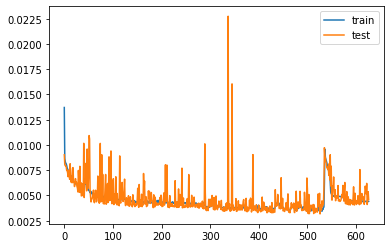

In [17]:
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')

plt.legend()
plt.show()


In [18]:
y_pred = model.predict(X_test)

In [19]:
for i in np.arange(X_test.shape[0]):
    print(i,y_test[i], y_pred[i])

0 [0.13183288] [0.15518087]
1 [0.08416655] [0.25907183]
2 [0.62639721] [0.67221355]
3 [0.23475632] [0.1963525]
4 [0.23616163] [0.25776714]
5 [0.41346003] [0.4949601]
6 [0.08062552] [0.25876248]
7 [0.24031008] [0.25381252]
8 [0.20131351] [0.24453032]
9 [0.43645972] [0.432251]
10 [0.24715098] [0.25665617]
11 [0.16494837] [0.18412977]
12 [0.16915402] [0.25218993]
13 [0.42637465] [0.3959826]
14 [0.20631757] [0.27290988]
15 [0.27403163] [0.369652]
16 [0.20482579] [0.2900505]
17 [0.31032524] [0.27705967]
18 [0.13520412] [0.26562995]
19 [0.12337056] [0.17863965]
20 [0.25940362] [0.2660475]
21 [0.32537341] [0.34930402]
22 [0.37963726] [0.39223632]
23 [0.33891025] [0.2666362]
24 [0.3708836] [0.3087089]
25 [0.08840235] [0.31730783]
26 [0.07623948] [0.15392959]
27 [0.55842436] [0.5475427]
28 [0.23527886] [0.24518606]
29 [0.0703473] [0.15285325]
30 [0.61243625] [0.6069188]
31 [0.52518841] [0.6493181]
32 [0.31495729] [0.3809767]
33 [0.27793486] [0.25687617]
34 [0.28385555] [0.24891017]
35 [0.084739

537 [0.45293814] [0.42135516]
538 [0.31443934] [0.30864602]
539 [0.7630824] [0.78112113]
540 [0.38268572] [0.3198312]
541 [0.41640648] [0.45857987]
542 [0.37439009] [0.35644832]
543 [0.13800031] [0.13793312]
544 [0.57422815] [0.5991899]
545 [0.23878746] [0.25675777]
546 [0.2927573] [0.35914248]
547 [0.31465572] [0.29665166]
548 [0.55022276] [0.5665531]
549 [0.19012213] [0.24217851]
550 [0.18573214] [0.1930627]
551 [0.21475519] [0.2512247]
552 [0.23430952] [0.2449257]
553 [0.22267097] [0.22413312]
554 [0.42743225] [0.43752253]
555 [0.26791433] [0.2966113]
556 [0.33335744] [0.26137233]
557 [0.19761728] [0.18332927]
558 [0.50939997] [0.51831275]
559 [0.16344628] [0.22902624]
560 [0.23622074] [0.32800198]
561 [0.26266571] [0.40522945]
562 [0.50753846] [0.51421094]
563 [0.53005152] [0.53215826]
564 [0.26688041] [0.28176174]
565 [0.16186413] [0.15691262]
566 [0.22823098] [0.25555083]
567 [0.28371336] [0.3896715]
568 [0.20442946] [0.23787701]
569 [0.36667266] [0.3553011]
570 [0.15729083] [0.3

1181 [0.72222081] [0.7133367]
1182 [0.49683558] [0.52368414]
1183 [0.43641897] [0.39929155]
1184 [0.08957591] [0.1408986]
1185 [0.16339958] [0.19848701]
1186 [0.22862102] [0.32314903]
1187 [0.25353343] [0.24751838]
1188 [0.25231178] [0.2570582]
1189 [0.15312805] [0.16733286]
1190 [0.12756091] [0.15214859]
1191 [0.60563578] [0.5770911]
1192 [0.34379159] [0.35767558]
1193 [0.57129968] [0.5804888]
1194 [0.18087519] [0.24463758]
1195 [0.18742715] [0.20116207]
1196 [0.59851622] [0.60539675]
1197 [0.23091143] [0.2454408]
1198 [0.12414851] [0.12322306]
1199 [0.17379728] [0.2452865]
1200 [0.36196559] [0.26155883]
1201 [0.4280006] [0.37404588]
1202 [0.182332] [0.36208436]
1203 [0.11700355] [0.10456322]
1204 [0.4202497] [0.33121836]
1205 [0.29132798] [0.2966617]
1206 [0.62220446] [0.60412633]
1207 [0.46174876] [0.43668842]
1208 [0.79546725] [0.679481]
1209 [0.36692233] [0.29822254]
1210 [0.08466056] [0.09910366]
1211 [0.54431378] [0.482956]
1212 [0.38331624] [0.3455876]
1213 [0.30910759] [0.3867

1818 [0.46200841] [0.45233953]
1819 [0.16389168] [0.36693752]
1820 [0.23602559] [0.2538281]
1821 [0.23763193] [0.2617457]
1822 [0.74300078] [0.70884144]
1823 [0.08367824] [0.12350681]
1824 [0.3338916] [0.31678116]
1825 [0.41948234] [0.4036941]
1826 [0.34133811] [0.35387772]
1827 [0.25229433] [0.37348893]
1828 [0.22056554] [0.2892754]
1829 [0.18448163] [0.33390912]
1830 [0.22635135] [0.23068509]
1831 [0.39372687] [0.39461356]
1832 [0.21993085] [0.20207685]
1833 [0.16954083] [0.11909399]
1834 [0.5404166] [0.4105508]
1835 [0.19646179] [0.20318806]
1836 [0.22464475] [0.24773456]
1837 [0.13526311] [0.27650806]
1838 [0.07712155] [0.15940344]
1839 [0.26296529] [0.26091552]
1840 [0.04936671] [0.09910366]
1841 [0.44673216] [0.45562342]
1842 [0.32891456] [0.26316312]
1843 [0.66085454] [0.68261635]
1844 [0.23464848] [0.27135885]
1845 [0.38013306] [0.497814]
1846 [0.29410055] [0.4391569]
1847 [0.45397452] [0.39609656]
1848 [0.31739364] [0.31078455]
1849 [0.03956429] [0.15865272]
1850 [0.43443176] 

2455 [0.61130301] [0.5912694]
2456 [0.36591317] [0.63347936]
2457 [0.1924519] [0.28070185]
2458 [0.13004071] [0.12285573]
2459 [0.34358536] [0.4122935]
2460 [0.20008328] [0.24409762]
2461 [0.39257855] [0.36482704]
2462 [0.24799466] [0.2867319]
2463 [0.21970255] [0.18325973]
2464 [0.15689974] [0.19376113]
2465 [0.31298071] [0.24743515]
2466 [0.16580139] [0.30151346]
2467 [0.73394443] [0.70757174]
2468 [0.41382086] [0.4109863]
2469 [0.3226287] [0.37195313]
2470 [0.40975873] [0.4143146]
2471 [0.22696131] [0.2581873]
2472 [0.74333935] [0.7083856]
2473 [0.0463861] [0.18009055]
2474 [0.28187614] [0.272613]
2475 [0.37597971] [0.3689798]
2476 [0.13495681] [0.28605872]
2477 [0.12684166] [0.1742807]
2478 [0.22188467] [0.22918366]
2479 [0.29078997] [0.28880414]
2480 [0.25468588] [0.39049944]
2481 [0.20495616] [0.24759488]
2482 [0.33078582] [0.32378387]
2483 [0.76527108] [0.7983177]
2484 [0.20073498] [0.21216832]
2485 [0.46261779] [0.44322768]
2486 [0.13156206] [0.263928]
2487 [0.44948942] [0.4756

3099 [0.12228651] [0.1360755]
3100 [0.27300573] [0.29970348]
3101 [0.4753267] [0.5062723]
3102 [0.46871423] [0.4825829]
3103 [0.42244862] [0.3674054]
3104 [0.04302882] [0.09910366]
3105 [0.1842292] [0.18759632]
3106 [0.105772] [0.13063863]
3107 [0.43346086] [0.44990918]
3108 [0.28741555] [0.27632618]
3109 [0.40155079] [0.42593345]
3110 [0.46617181] [0.4304903]
3111 [0.12631645] [0.31182438]
3112 [0.54094838] [0.55543137]
3113 [0.76583475] [0.6861981]
3114 [0.27553393] [0.30870107]
3115 [0.25393428] [0.33227667]
3116 [0.24579997] [0.19948077]
3117 [0.05240016] [0.10666275]
3118 [0.34407019] [0.29773676]
3119 [0.20432342] [0.21040651]
3120 [0.28138602] [0.39704666]
3121 [0.07727033] [0.16638228]
3122 [0.28762048] [0.3268007]
3123 [0.34515026] [0.33853465]
3124 [0.30947462] [0.44544262]
3125 [0.22204614] [0.25394642]
3126 [0.32061596] [0.44122964]
3127 [0.31201567] [0.3315596]
3128 [0.04512737] [0.18650755]
3129 [0.10769702] [0.15572762]
3130 [0.19134544] [0.18768394]
3131 [0.16192984] [0

3758 [0.55406902] [0.5377544]
3759 [0.27582108] [0.24552548]
3760 [0.20441734] [0.21864952]
3761 [0.21355588] [0.2505336]
3762 [0.06574348] [0.17243488]
3763 [0.26239836] [0.26466304]
3764 [0.30450957] [0.45863894]
3765 [0.28342363] [0.3329804]
3766 [0.50884056] [0.4759355]
3767 [0.4992522] [0.52028215]
3768 [0.40934176] [0.49328458]
3769 [0.42702827] [0.3005949]
3770 [0.33675084] [0.2741412]
3771 [0.26025472] [0.30365378]
3772 [0.22030968] [0.25826165]
3773 [0.13110861] [0.26130772]
3774 [0.34182439] [0.31715778]
3775 [0.2173872] [0.17030531]
3776 [0.44232329] [0.47390273]
3777 [0.44271612] [0.47044903]
3778 [0.29550443] [0.26163638]
3779 [0.2420628] [0.25094116]
3780 [0.15284644] [0.19790742]
3781 [0.30048914] [0.24728735]
3782 [0.35618658] [0.29331014]
3783 [0.33498287] [0.47152835]
3784 [0.34309603] [0.37572524]
3785 [0.1841715] [0.20201519]
3786 [0.05599096] [0.2767854]
3787 [0.24589493] [0.38482982]
3788 [0.27096272] [0.30328763]
3789 [0.5585372] [0.5754647]
3790 [0.37427402] [0.

4389 [0.73999426] [0.7169422]
4390 [0.47026307] [0.49294898]
4391 [0.38658127] [0.29062232]
4392 [0.25320669] [0.294038]
4393 [0.09634953] [0.26743263]
4394 [0.18869844] [0.23967311]
4395 [0.31012025] [0.31685787]
4396 [0.37322276] [0.36628163]
4397 [0.31389706] [0.32866213]
4398 [0.31777192] [0.34223038]
4399 [0.07482739] [0.1076812]
4400 [0.21897593] [0.22274229]
4401 [0.55937588] [0.6167853]
4402 [0.28612051] [0.2682762]
4403 [0.47184283] [0.49558175]
4404 [0.47276133] [0.46547458]
4405 [0.54249865] [0.5642971]
4406 [0.14204243] [0.18672077]
4407 [0.24218357] [0.2616081]
4408 [0.34699753] [0.34423655]
4409 [0.53013458] [0.55161977]
4410 [0.17309047] [0.21675351]
4411 [0.11443778] [0.11406875]
4412 [0.55393727] [0.5651182]
4413 [0.30356398] [0.42307618]
4414 [0.39579843] [0.37465155]
4415 [0.2909662] [0.3213833]
4416 [0.48846372] [0.54513896]
4417 [0.67067924] [0.68251085]
4418 [0.72340598] [0.7288921]
4419 [0.12936236] [0.26377982]
4420 [0.04743478] [0.09910366]
4421 [0.53142162] [0

5035 [0.14093944] [0.12811108]
5036 [0.16069074] [0.15907982]
5037 [0.36284532] [0.25671983]
5038 [0.29688848] [0.25249612]
5039 [0.3363219] [0.2958611]
5040 [0.28304691] [0.28924692]
5041 [0.38544318] [0.25369054]
5042 [0.4358758] [0.47073573]
5043 [0.44843772] [0.34220332]
5044 [0.225163] [0.25540638]
5045 [0.54749247] [0.56568813]
5046 [0.42637833] [0.4495445]
5047 [0.50195026] [0.51856804]
5048 [0.36624154] [0.45167622]
5049 [0.22679872] [0.26976258]
5050 [0.40767782] [0.44273978]
5051 [0.37258827] [0.34832197]
5052 [0.5760143] [0.6130316]
5053 [0.29476993] [0.28892273]
5054 [0.28197669] [0.2581202]
5055 [0.11435608] [0.14556813]
5056 [0.57191624] [0.49108103]
5057 [0.34370138] [0.24776478]
5058 [0.16140295] [0.19180329]
5059 [0.21201137] [0.25838006]
5060 [0.23179737] [0.21003464]
5061 [0.18032753] [0.22358112]
5062 [0.40455821] [0.38514432]
5063 [0.30770501] [0.33127356]
5064 [0.28894614] [0.32356358]
5065 [0.45374333] [0.39354864]
5066 [0.37400776] [0.37726146]
5067 [0.25319426]

5680 [0.34585303] [0.35167485]
5681 [0.63649514] [0.6228806]
5682 [0.5597916] [0.5559053]
5683 [0.23976133] [0.2519261]
5684 [0.24396382] [0.3864269]
5685 [0.13445023] [0.14434642]
5686 [0.3019939] [0.3599512]
5687 [0.33196659] [0.3335827]
5688 [0.3772589] [0.33962846]
5689 [0.05721973] [0.17521665]
5690 [0.24298242] [0.2572437]
5691 [0.23675741] [0.24683896]
5692 [0.23871136] [0.24966206]
5693 [0.18595197] [0.36000732]
5694 [0.26829849] [0.22493342]
5695 [0.32590468] [0.3049783]
5696 [0.52045904] [0.59976697]
5697 [0.35819917] [0.41725484]
5698 [0.47826038] [0.35882214]
5699 [0.13308187] [0.14992434]
5700 [0.12578071] [0.16236705]
5701 [0.06599802] [0.09954783]
5702 [0.09169259] [0.1937006]
5703 [0.39653928] [0.40222412]
5704 [0.16580497] [0.09910366]
5705 [0.50850038] [0.50531787]
5706 [0.13044394] [0.26129395]
5707 [0.40097779] [0.3875855]
5708 [0.3165774] [0.4006805]
5709 [0.23916754] [0.35624853]
5710 [0.39060024] [0.3880092]
5711 [0.2726888] [0.26056215]
5712 [0.25588304] [0.2619

6327 [0.45997878] [0.41227856]
6328 [0.1332504] [0.16290788]
6329 [0.12592726] [0.15242022]
6330 [0.35904998] [0.31305093]
6331 [0.19914471] [0.17616212]
6332 [0.19496359] [0.30595556]
6333 [0.30591622] [0.33812588]
6334 [0.48598108] [0.4619078]
6335 [0.37846131] [0.49219972]
6336 [0.54117434] [0.54863566]
6337 [0.19460988] [0.19347265]
6338 [0.51287822] [0.45462728]
6339 [0.08863622] [0.1799153]
6340 [0.3075787] [0.25881547]
6341 [0.18125252] [0.1896252]
6342 [0.10508216] [0.28138632]
6343 [0.41136813] [0.39920306]
6344 [0.45161926] [0.43018556]
6345 [0.34321622] [0.4582086]
6346 [0.17840976] [0.3346181]
6347 [0.58791357] [0.53344107]
6348 [0.22932379] [0.2687999]
6349 [0.35555475] [0.49380872]
6350 [0.38579047] [0.51287687]
6351 [0.43380527] [0.5299506]
6352 [0.30040408] [0.24604227]
6353 [0.16464364] [0.16569412]
6354 [0.18692056] [0.2236293]
6355 [0.34776533] [0.35909]
6356 [0.3861331] [0.33175987]
6357 [0.54655491] [0.4969756]
6358 [0.25681455] [0.21173728]
6359 [0.34236857] [0.34

6990 [0.20414786] [0.3498972]
6991 [0.64707881] [0.6530007]
6992 [0.73369897] [0.7005763]
6993 [0.47739219] [0.47687975]
6994 [0.12175479] [0.22880134]
6995 [0.1700354] [0.22763482]
6996 [0.57263967] [0.5873538]
6997 [0.40130311] [0.41550875]
6998 [0.44093855] [0.411727]
6999 [0.12117162] [0.19831523]
7000 [0.24333757] [0.25800163]
7001 [0.45406752] [0.35211816]
7002 [0.08626179] [0.11619681]
7003 [0.07027874] [0.12094923]
7004 [0.18087362] [0.24058798]
7005 [0.27918819] [0.33824524]
7006 [0.15932511] [0.14077654]
7007 [0.27385463] [0.36077356]
7008 [0.12265402] [0.13832387]
7009 [0.10383831] [0.13576254]
7010 [0.37207871] [0.38133243]
7011 [0.24479439] [0.33005857]
7012 [0.22749694] [0.21765885]
7013 [0.36997895] [0.3037405]
7014 [0.33934642] [0.30092168]
7015 [0.04749603] [0.1759387]
7016 [0.4968722] [0.52318203]
7017 [0.39649296] [0.5310054]
7018 [0.15907471] [0.16833864]
7019 [0.15207538] [0.2120842]
7020 [0.41288045] [0.50887924]
7021 [0.33282174] [0.4787001]
7022 [0.1629874] [0.1

7623 [0.36461933] [0.36112756]
7624 [0.644088] [0.64540017]
7625 [0.24212644] [0.308656]
7626 [0.28932943] [0.38625616]
7627 [0.19423586] [0.2035854]
7628 [0.42721027] [0.45980796]
7629 [0.17902841] [0.2367149]
7630 [0.32041304] [0.25749856]
7631 [0.68739994] [0.7129611]
7632 [0.31899092] [0.32253712]
7633 [0.05391293] [0.15382391]
7634 [0.27138302] [0.40527517]
7635 [0.18648085] [0.29108998]
7636 [0.19680755] [0.3267197]
7637 [0.13629945] [0.14280924]
7638 [0.1180887] [0.16252413]
7639 [0.34603926] [0.35447025]
7640 [0.15395658] [0.17622834]
7641 [0.37091486] [0.33374643]
7642 [0.31492468] [0.24934891]
7643 [0.29974565] [0.25729877]
7644 [0.35318087] [0.3536294]
7645 [0.71095449] [0.72857845]
7646 [0.17512884] [0.15077578]
7647 [0.32187083] [0.2579714]
7648 [0.26255873] [0.2616429]
7649 [0.17807461] [0.25441402]
7650 [0.38290754] [0.3996928]
7651 [0.28973698] [0.28196156]
7652 [0.22762826] [0.21955864]
7653 [0.16170315] [0.16474274]
7654 [0.13773805] [0.28581777]
7655 [0.24404567] [0.

8275 [0.40219275] [0.39182007]
8276 [0.33701765] [0.36086386]
8277 [0.16001062] [0.20254734]
8278 [0.17488556] [0.1833362]
8279 [0.2168168] [0.25248903]
8280 [0.31053025] [0.29528204]
8281 [0.72251086] [0.7267059]
8282 [0.10639455] [0.09913199]
8283 [0.20815808] [0.25086915]
8284 [0.15379917] [0.20693745]
8285 [0.20778474] [0.24581458]
8286 [0.2194939] [0.25078946]
8287 [0.51856848] [0.5184251]
8288 [0.04221494] [0.09910366]
8289 [0.23736659] [0.25948572]
8290 [0.18988203] [0.25580603]
8291 [0.69602697] [0.7264056]
8292 [0.24808194] [0.26271936]
8293 [0.39204328] [0.33754262]
8294 [0.04489627] [0.31975824]
8295 [0.31016616] [0.45029953]
8296 [0.25855387] [0.2573266]
8297 [0.06254223] [0.11064338]
8298 [0.39860045] [0.39428747]
8299 [0.19890137] [0.24691452]
8300 [0.26867158] [0.23449437]
8301 [0.3435986] [0.4037972]
8302 [0.4750121] [0.48389652]
8303 [0.37960609] [0.49456733]
8304 [0.11772486] [0.26731724]
8305 [0.37395357] [0.36778498]
8306 [0.30365948] [0.24942806]
8307 [0.33145333] 

8922 [0.21668049] [0.20622078]
8923 [0.2741114] [0.30826324]
8924 [0.16130062] [0.33142984]
8925 [0.28852373] [0.25213844]
8926 [0.23095433] [0.33341223]
8927 [0.36512213] [0.33343822]
8928 [0.46880083] [0.4857098]
8929 [0.28091298] [0.28543726]
8930 [0.21686033] [0.20989421]
8931 [0.45481037] [0.45148453]
8932 [0.64935805] [0.6547427]
8933 [0.28711367] [0.33283028]
8934 [0.37185092] [0.44178593]
8935 [0.48084885] [0.43420804]
8936 [0.29625233] [0.320486]
8937 [0.32802667] [0.31548023]
8938 [0.5928394] [0.59267867]
8939 [0.22481861] [0.20587382]
8940 [0.32166724] [0.25582296]
8941 [0.40283938] [0.53275836]
8942 [0.26101389] [0.21501039]
8943 [0.06680866] [0.12826616]
8944 [0.48984428] [0.6364678]
8945 [0.39928191] [0.3673624]
8946 [0.36774441] [0.46134594]
8947 [0.30584251] [0.2453326]
8948 [0.37931749] [0.3597116]
8949 [0.38489311] [0.3683386]
8950 [0.12684977] [0.16458742]
8951 [0.19538707] [0.24797401]
8952 [0.39040677] [0.36245346]
8953 [0.34967581] [0.46332306]
8954 [0.4691787] [0

9588 [0.65518198] [0.6596041]
9589 [0.37736588] [0.3796388]
9590 [0.28358743] [0.2676682]
9591 [0.57680399] [0.5542886]
9592 [0.17640061] [0.20585355]
9593 [0.3610808] [0.33662796]
9594 [0.15023542] [0.16586772]
9595 [0.14038114] [0.10023881]
9596 [0.54357444] [0.53700596]
9597 [0.49261227] [0.58147323]
9598 [0.31241405] [0.27910757]
9599 [0.72445829] [0.7199987]
9600 [0.22074847] [0.26722965]
9601 [0.09788014] [0.13265182]
9602 [0.08393022] [0.12277116]
9603 [0.0787981] [0.09910366]
9604 [0.32952802] [0.24956986]
9605 [0.17931707] [0.16232842]
9606 [0.40294477] [0.36174786]
9607 [0.6924965] [0.6996641]
9608 [0.49198566] [0.47580788]
9609 [0.23865089] [0.25151762]
9610 [0.25967796] [0.31595805]
9611 [0.14917623] [0.2981422]
9612 [0.23640984] [0.25139835]
9613 [0.230233] [0.2496995]
9614 [0.26848903] [0.32082936]
9615 [0.38890317] [0.47910547]
9616 [0.39227152] [0.39505315]
9617 [0.2532219] [0.2516944]
9618 [0.19747976] [0.21692437]
9619 [0.24398695] [0.26187497]
9620 [0.30254422] [0.24

10228 [0.32990199] [0.27707776]
10229 [0.74439387] [0.7153262]
10230 [0.4787851] [0.6158067]
10231 [0.51160793] [0.5110819]
10232 [0.17212185] [0.18384925]
10233 [0.33258742] [0.29887882]
10234 [0.37864536] [0.3640618]
10235 [0.46704175] [0.3574045]
10236 [0.60701044] [0.60161304]
10237 [0.15394779] [0.20112899]
10238 [0.28597713] [0.25599992]
10239 [0.22943322] [0.19703695]
10240 [0.12241909] [0.17862856]
10241 [0.28477922] [0.27879834]
10242 [0.40629119] [0.37987742]
10243 [0.09524298] [0.12185945]
10244 [0.35729493] [0.35451943]
10245 [0.40459021] [0.44598213]
10246 [0.78478823] [0.7134278]
10247 [0.29409235] [0.2924899]
10248 [0.26239602] [0.25926402]
10249 [0.26297389] [0.37900195]
10250 [0.27314884] [0.34422502]
10251 [0.25562089] [0.21668747]
10252 [0.05418587] [0.12047938]
10253 [0.30405481] [0.35013634]
10254 [0.5387995] [0.52011645]
10255 [0.62370392] [0.6064441]
10256 [0.60516571] [0.5811038]
10257 [0.16307446] [0.17006193]
10258 [0.26682528] [0.2856707]
10259 [0.21744845] [

10871 [0.42039934] [0.40205052]
10872 [0.41724932] [0.4736061]
10873 [0.1509654] [0.19356817]
10874 [0.18414797] [0.21074867]
10875 [0.25655251] [0.46494827]
10876 [0.17396454] [0.20913623]
10877 [0.46135608] [0.44629958]
10878 [0.26231235] [0.3192667]
10879 [0.08327034] [0.12063397]
10880 [0.45686139] [0.32487655]
10881 [0.10841584] [0.16464037]
10882 [0.10689301] [0.19618362]
10883 [0.30072665] [0.36946037]
10884 [0.39607053] [0.39724475]
10885 [0.10863144] [0.15188247]
10886 [0.39563172] [0.42120662]
10887 [0.44429804] [0.32757008]
10888 [0.16691209] [0.22491446]
10889 [0.30400356] [0.2783984]
10890 [0.0352049] [0.09910366]
10891 [0.50156725] [0.500813]
10892 [0.69807714] [0.69472253]
10893 [0.61906733] [0.60306656]
10894 [0.26610717] [0.22477138]
10895 [0.22761322] [0.23578948]
10896 [0.11426304] [0.26437265]
10897 [0.36640225] [0.33548456]
10898 [0.24281956] [0.25011846]
10899 [0.2646605] [0.22071128]
10900 [0.711915] [0.72294354]
10901 [0.19072632] [0.1948168]
10902 [0.07017558] 

11540 [0.38628604] [0.39100066]
11541 [0.33940036] [0.39224303]
11542 [0.12532714] [0.16333538]
11543 [0.07853994] [0.11625651]
11544 [0.26536444] [0.29046017]
11545 [0.50312507] [0.5040419]
11546 [0.45677884] [0.38916752]
11547 [0.32835206] [0.47968668]
11548 [0.30378226] [0.25782537]
11549 [0.41861658] [0.3920124]
11550 [0.31065037] [0.31497088]
11551 [0.37731118] [0.3821243]
11552 [0.24564338] [0.24746624]
11553 [0.2557368] [0.3003419]
11554 [0.08547571] [0.11058186]
11555 [0.10791494] [0.1162129]
11556 [0.25338822] [0.21215963]
11557 [0.71694352] [0.6998285]
11558 [0.29860443] [0.29589534]
11559 [0.25453493] [0.2770713]
11560 [0.26300952] [0.24195226]
11561 [0.31054542] [0.31108636]
11562 [0.13978192] [0.20855898]
11563 [0.3923615] [0.37891543]
11564 [0.16226759] [0.200528]
11565 [0.42075857] [0.41718265]
11566 [0.23072695] [0.25136226]
11567 [0.32283926] [0.3347472]
11568 [0.41155264] [0.47649816]
11569 [0.25143663] [0.2510337]
11570 [0.2927025] [0.26025432]
11571 [0.41194852] [0.

12168 [0.05600398] [0.10311053]
12169 [0.26637885] [0.30679554]
12170 [0.3258833] [0.39853293]
12171 [0.43978606] [0.4584138]
12172 [0.42553431] [0.3772299]
12173 [0.35470124] [0.25541785]
12174 [0.3382444] [0.35674918]
12175 [0.06823325] [0.1377331]
12176 [0.30731729] [0.2971485]
12177 [0.54009509] [0.549777]
12178 [0.0787312] [0.10052092]
12179 [0.32290363] [0.24521175]
12180 [0.19590668] [0.20395672]
12181 [0.362256] [0.33670056]
12182 [0.23841755] [0.28143483]
12183 [0.65313247] [0.6653663]
12184 [0.53756402] [0.5876517]
12185 [0.44592337] [0.51897585]
12186 [0.12043091] [0.14475073]
12187 [0.10834943] [0.14806975]
12188 [0.22900548] [0.3686838]
12189 [0.3918755] [0.38095483]
12190 [0.63529965] [0.62722516]
12191 [0.63196809] [0.6415924]
12192 [0.63728324] [0.6793237]
12193 [0.10954896] [0.13886894]
12194 [0.08709044] [0.25506607]
12195 [0.32281214] [0.45449308]
12196 [0.24445499] [0.28836352]
12197 [0.59237122] [0.6066487]
12198 [0.22900825] [0.2570951]
12199 [0.3420961] [0.360498

12812 [0.14586383] [0.15386587]
12813 [0.1093704] [0.1091591]
12814 [0.36427554] [0.2490904]
12815 [0.13014842] [0.15198448]
12816 [0.31020783] [0.26224008]
12817 [0.23497232] [0.25324148]
12818 [0.40449117] [0.41467422]
12819 [0.62515115] [0.66071033]
12820 [0.33777703] [0.36624]
12821 [0.18189558] [0.22131526]
12822 [0.12101587] [0.28533387]
12823 [0.10121141] [0.27679908]
12824 [0.38075346] [0.28920484]
12825 [0.3654572] [0.35753328]
12826 [0.15276355] [0.18533778]
12827 [0.23756131] [0.32653683]
12828 [0.44187887] [0.46494526]
12829 [0.33806625] [0.2978456]
12830 [0.41965794] [0.43984267]
12831 [0.23433157] [0.24798508]
12832 [0.37525325] [0.35419288]
12833 [0.24678987] [0.25191012]
12834 [0.23333305] [0.27159375]
12835 [0.23976744] [0.34483975]
12836 [0.61153357] [0.60007536]
12837 [0.70819195] [0.7257165]
12838 [0.15971791] [0.14347593]
12839 [0.42076181] [0.41705155]
12840 [0.30301416] [0.21341953]
12841 [0.40661348] [0.26724133]
12842 [0.75016366] [0.709803]
12843 [0.24551854] 

13465 [0.28648974] [0.29411402]
13466 [0.31951505] [0.33936]
13467 [0.72990626] [0.7186061]
13468 [0.50272462] [0.4947634]
13469 [0.37262397] [0.45451367]
13470 [0.1573219] [0.3079722]
13471 [0.40018825] [0.44262737]
13472 [0.28105344] [0.3721792]
13473 [0.14361784] [0.17633171]
13474 [0.70650092] [0.7241155]
13475 [0.20093086] [0.18718117]
13476 [0.13467559] [0.18873386]
13477 [0.22330119] [0.1769378]
13478 [0.27568453] [0.23303007]
13479 [0.40979232] [0.46478844]
13480 [0.13627114] [0.12966853]
13481 [0.13966795] [0.39110857]
13482 [0.32087841] [0.27179262]
13483 [0.11338206] [0.15136875]
13484 [0.17535417] [0.17884114]
13485 [0.53294462] [0.53160334]
13486 [0.08215308] [0.13614497]
13487 [0.29253447] [0.26782835]
13488 [0.09821224] [0.11376414]
13489 [0.33979322] [0.31648457]
13490 [0.16338858] [0.21701607]
13491 [0.18581111] [0.20174463]
13492 [0.19732285] [0.25136003]
13493 [0.36587108] [0.34582773]
13494 [0.15582443] [0.19321543]
13495 [0.40007487] [0.48045424]
13496 [0.25982807]

14136 [0.37629923] [0.34814507]
14137 [0.29185976] [0.29237765]
14138 [0.27946731] [0.31083545]
14139 [0.16575449] [0.17607567]
14140 [0.10849102] [0.12601805]
14141 [0.36329845] [0.36496353]
14142 [0.27407751] [0.35106966]
14143 [0.4224127] [0.34375662]
14144 [0.24153919] [0.2501107]
14145 [0.36130656] [0.35578716]
14146 [0.22233709] [0.19208544]
14147 [0.16294592] [0.18620098]
14148 [0.14036584] [0.1720599]
14149 [0.35402891] [0.34803325]
14150 [0.12432837] [0.14867328]
14151 [0.08950197] [0.1670053]
14152 [0.24336087] [0.2583055]
14153 [0.43981036] [0.48949468]
14154 [0.19472903] [0.24241391]
14155 [0.37947169] [0.3094287]
14156 [0.30623303] [0.2506007]
14157 [0.13025334] [0.11516696]
14158 [0.24552197] [0.39604482]
14159 [0.5229498] [0.553584]
14160 [0.40344206] [0.40758356]
14161 [0.6000589] [0.6283052]
14162 [0.62080162] [0.6619084]
14163 [0.29642712] [0.25011596]
14164 [0.17622319] [0.20127892]
14165 [0.29620923] [0.2932356]
14166 [0.53450182] [0.5432327]
14167 [0.56268362] [0.5

14769 [0.25864242] [0.23585254]
14770 [0.10105378] [0.1009571]
14771 [0.16543237] [0.19437502]
14772 [0.0828635] [0.11290643]
14773 [0.16893232] [0.21457674]
14774 [0.30395557] [0.37107548]
14775 [0.29619265] [0.28230184]
14776 [0.21931583] [0.30287993]
14777 [0.30635949] [0.24820203]
14778 [0.30732861] [0.7225319]
14779 [0.39624574] [0.40554905]
14780 [0.47088113] [0.47979727]
14781 [0.28351345] [0.26044896]
14782 [0.45734087] [0.3916635]
14783 [0.46139232] [0.4275677]
14784 [0.49988835] [0.5188494]
14785 [0.17062808] [0.17339188]
14786 [0.19732402] [0.247319]
14787 [0.22408414] [0.20497847]
14788 [0.24295572] [0.30353293]
14789 [0.34187228] [0.35352618]
14790 [0.30371727] [0.30217853]
14791 [0.34173726] [0.30709267]
14792 [0.28296408] [0.2175118]
14793 [0.42206155] [0.39088747]
14794 [0.2007574] [0.26380548]
14795 [0.06304998] [0.18095034]
14796 [0.32777293] [0.38646203]
14797 [0.59738449] [0.6219512]
14798 [0.29430575] [0.29272878]
14799 [0.12694697] [0.21241239]
14800 [0.37787076] 

15339 [0.42552545] [0.3839622]
15340 [0.35151105] [0.34223145]
15341 [0.39079562] [0.3789562]
15342 [0.15837504] [0.17536554]
15343 [0.2710294] [0.29322836]
15344 [0.40497718] [0.4048129]
15345 [0.36120313] [0.3196954]
15346 [0.07195238] [0.13681783]
15347 [0.13103718] [0.20660922]
15348 [0.3166201] [0.32683212]
15349 [0.48225437] [0.4895412]
15350 [0.44288148] [0.45595685]
15351 [0.27467071] [0.3561944]
15352 [0.18938696] [0.20434743]
15353 [0.3812998] [0.36616576]
15354 [0.1059217] [0.13703462]
15355 [0.36934775] [0.50779843]
15356 [0.19246073] [0.2275273]
15357 [0.1095661] [0.20050046]
15358 [0.28761565] [0.23169771]
15359 [0.30372061] [0.31458464]
15360 [0.6302709] [0.62430155]
15361 [0.42335544] [0.4482794]
15362 [0.38665314] [0.38960743]
15363 [0.34403351] [0.4584578]
15364 [0.11181422] [0.28365433]
15365 [0.15287499] [0.18905154]
15366 [0.44917942] [0.4289512]
15367 [0.35688721] [0.38829046]
15368 [0.30991557] [0.32128465]
15369 [0.36415485] [0.375581]
15370 [0.47979133] [0.5118

16003 [0.41115077] [0.3933192]
16004 [0.19786033] [0.22271246]
16005 [0.10661812] [0.15633914]
16006 [0.23044439] [0.25607604]
16007 [0.71240016] [0.72573185]
16008 [0.53837614] [0.55177915]
16009 [0.24341112] [0.33241326]
16010 [0.28313714] [0.26954645]
16011 [0.5518592] [0.5566633]
16012 [0.39643035] [0.38736814]
16013 [0.23512535] [0.2557731]
16014 [0.25502918] [0.26272833]
16015 [0.25935495] [0.40325618]
16016 [0.43053335] [0.42388007]
16017 [0.10156265] [0.1988833]
16018 [0.36541384] [0.35266113]
16019 [0.26966582] [0.25787765]
16020 [0.31261244] [0.2480105]
16021 [0.06332411] [0.09910366]
16022 [0.2908174] [0.29305628]
16023 [0.58541064] [0.5754812]
16024 [0.4734821] [0.47155496]
16025 [0.21542786] [0.18415326]
16026 [0.23517886] [0.37756035]
16027 [0.05139253] [0.09910366]
16028 [0.22334497] [0.33011678]
16029 [0.41363362] [0.468442]
16030 [0.32278558] [0.3342016]
16031 [0.65126402] [0.70525753]
16032 [0.32509617] [0.32517663]
16033 [0.24418784] [0.2538807]
16034 [0.28341515] [0

16584 [0.31745717] [0.24680151]
16585 [0.26967089] [0.2299433]
16586 [0.33276496] [0.2722475]
16587 [0.48090882] [0.4746451]
16588 [0.16059533] [0.19969025]
16589 [0.18822951] [0.21180011]
16590 [0.16741837] [0.3344146]
16591 [0.45941953] [0.34422368]
16592 [0.08982923] [0.11259242]
16593 [0.214228] [0.3138494]
16594 [0.27564394] [0.24527007]
16595 [0.14164779] [0.12123507]
16596 [0.26656057] [0.26119733]
16597 [0.30212246] [0.30792117]
16598 [0.36387095] [0.38458666]
16599 [0.5899898] [0.5678679]
16600 [0.40057809] [0.406164]
16601 [0.34839859] [0.32813987]
16602 [0.1548533] [0.32098955]
16603 [0.2212391] [0.30294955]
16604 [0.13280958] [0.15597595]
16605 [0.34089606] [0.4286146]
16606 [0.12859618] [0.25924784]
16607 [0.2707922] [0.3761172]
16608 [0.34991166] [0.3591164]
16609 [0.18123777] [0.20176867]
16610 [0.27722188] [0.4928905]
16611 [0.06807296] [0.13598543]
16612 [0.4696461] [0.55031884]
16613 [0.09305869] [0.13088712]
16614 [0.41231346] [0.39441457]
16615 [0.3757394] [0.294996

17273 [0.33568188] [0.3466789]
17274 [0.41554723] [0.48856956]
17275 [0.41158618] [0.360674]
17276 [0.25835785] [0.29841486]
17277 [0.16452649] [0.30510154]
17278 [0.22706813] [0.23043302]
17279 [0.60554188] [0.588803]
17280 [0.10115674] [0.13696215]
17281 [0.22208123] [0.24852818]
17282 [0.2878177] [0.2816419]
17283 [0.31909695] [0.2886921]
17284 [0.21421817] [0.2987635]
17285 [0.28790717] [0.24767374]
17286 [0.36746518] [0.36612153]
17287 [0.13385526] [0.192052]
17288 [0.59683163] [0.6110846]
17289 [0.42009285] [0.40275925]
17290 [0.23520534] [0.31229448]
17291 [0.62368197] [0.673638]
17292 [0.0901179] [0.14811465]
17293 [0.38742045] [0.38356507]
17294 [0.20963072] [0.21192265]
17295 [0.1500643] [0.16937128]
17296 [0.2487661] [0.19930032]
17297 [0.23471795] [0.28676552]
17298 [0.08241159] [0.14369988]
17299 [0.37591993] [0.29668945]
17300 [0.37031854] [0.35617104]
17301 [0.22034294] [0.20935568]
17302 [0.47097872] [0.41640285]
17303 [0.32686051] [0.3927438]
17304 [0.09531302] [0.2703

17899 [0.14263598] [0.21834438]
17900 [0.33384022] [0.24895076]
17901 [0.23948711] [0.25468686]
17902 [0.52355086] [0.535362]
17903 [0.4881543] [0.466979]
17904 [0.21934763] [0.1689288]
17905 [0.57241489] [0.5658694]
17906 [0.24852698] [0.25352103]
17907 [0.3213655] [0.25975293]
17908 [0.23459961] [0.3550171]
17909 [0.17378904] [0.21317542]
17910 [0.49866527] [0.48869497]
17911 [0.29678917] [0.24472101]
17912 [0.35795794] [0.34184152]
17913 [0.06536431] [0.17442542]
17914 [0.57495417] [0.60598516]
17915 [0.39002942] [0.44124737]
17916 [0.03460356] [0.15538214]
17917 [0.2878266] [0.30918026]
17918 [0.26024753] [0.25454164]
17919 [0.53901757] [0.5327599]
17920 [0.157857] [0.30082077]
17921 [0.59490106] [0.58544236]
17922 [0.26929391] [0.25911158]
17923 [0.24057668] [0.25637525]
17924 [0.40207184] [0.4185723]
17925 [0.15926339] [0.20336926]
17926 [0.63357474] [0.6383455]
17927 [0.33437863] [0.28961802]
17928 [0.76175366] [0.6971208]
17929 [0.41342797] [0.35069436]
17930 [0.31900631] [0.32

18464 [0.46204889] [0.47365013]
18465 [0.24283022] [0.23804066]
18466 [0.13065072] [0.2954316]
18467 [0.36146912] [0.42469874]
18468 [0.67513838] [0.68216705]
18469 [0.24168297] [0.29111284]
18470 [0.40737535] [0.4952876]
18471 [0.13601418] [0.2094689]
18472 [0.14168728] [0.16269273]
18473 [0.33615526] [0.47405508]
18474 [0.37987239] [0.3917784]
18475 [0.16012482] [0.30660713]
18476 [0.3436931] [0.38994005]
18477 [0.37578363] [0.46514472]
18478 [0.32892096] [0.3591257]
18479 [0.10284131] [0.12366404]
18480 [0.3283841] [0.36859155]
18481 [0.28544255] [0.2521869]
18482 [0.578994] [0.57384276]
18483 [0.36936224] [0.3758708]
18484 [0.53054462] [0.5466218]
18485 [0.50594171] [0.5065559]
18486 [0.19495453] [0.33116388]
18487 [0.41801799] [0.44718078]
18488 [0.39767876] [0.37059513]
18489 [0.15839922] [0.13584276]
18490 [0.20378957] [0.3202009]
18491 [0.10505153] [0.14718065]
18492 [0.35535291] [0.3707968]
18493 [0.34248249] [0.36971965]
18494 [0.2001355] [0.21842816]
18495 [0.49825414] [0.50

19121 [0.37244704] [0.36999077]
19122 [0.34753142] [0.33295774]
19123 [0.13561483] [0.10616054]
19124 [0.25102825] [0.26264]
19125 [0.426475] [0.3951856]
19126 [0.27971779] [0.24714771]
19127 [0.11383115] [0.16120195]
19128 [0.57320354] [0.58131146]
19129 [0.09413085] [0.12864286]
19130 [0.27918669] [0.2753174]
19131 [0.12157239] [0.1419886]
19132 [0.20276187] [0.22080553]
19133 [0.30279688] [0.258395]
19134 [0.7102556] [0.7197424]
19135 [0.26357025] [0.24915273]
19136 [0.36694447] [0.27874506]
19137 [0.20876539] [0.24005698]
19138 [0.17340389] [0.18988027]
19139 [0.16761355] [0.31621218]
19140 [0.25988125] [0.25472206]
19141 [0.58672204] [0.61202013]
19142 [0.07049045] [0.18478748]
19143 [0.13310749] [0.26050577]
19144 [0.39187293] [0.32774383]
19145 [0.32903693] [0.34393728]
19146 [0.34654677] [0.39725918]
19147 [0.46470098] [0.48769683]
19148 [0.24982123] [0.25678533]
19149 [0.16569444] [0.30583864]
19150 [0.29151349] [0.25068045]
19151 [0.24659959] [0.23073879]
19152 [0.28282241] [

19725 [0.12342628] [0.2496823]
19726 [0.32551224] [0.343406]
19727 [0.24887323] [0.20164475]
19728 [0.24961135] [0.37718502]
19729 [0.4626301] [0.4410698]
19730 [0.04350442] [0.09910366]
19731 [0.38873764] [0.38261774]
19732 [0.55404671] [0.53813344]
19733 [0.12451971] [0.15925172]
19734 [0.4087611] [0.40174899]
19735 [0.35481008] [0.29182887]
19736 [0.22868693] [0.19683546]
19737 [0.44579805] [0.4839635]
19738 [0.42401607] [0.39848822]
19739 [0.49823275] [0.37403125]
19740 [0.10795806] [0.26320428]
19741 [0.21199029] [0.25457045]
19742 [0.32361273] [0.23166916]
19743 [0.30925736] [0.25612396]
19744 [0.29493729] [0.39088818]
19745 [0.28776697] [0.29777202]
19746 [0.45867881] [0.5017674]
19747 [0.30047758] [0.22487156]
19748 [0.12543901] [0.26486182]
19749 [0.14853044] [0.1655452]
19750 [0.40998462] [0.41318315]
19751 [0.26994924] [0.3576476]
19752 [0.36483413] [0.24995884]
19753 [0.38023315] [0.45337355]
19754 [0.28907447] [0.3313449]
19755 [0.29008047] [0.27951694]
19756 [0.71235986] 

20359 [0.24813937] [0.25182235]
20360 [0.34672522] [0.33302146]
20361 [0.6597209] [0.7137916]
20362 [0.30052839] [0.26324594]
20363 [0.23271144] [0.18214662]
20364 [0.38527211] [0.37499532]
20365 [0.43406681] [0.49854413]
20366 [0.25381143] [0.3967699]
20367 [0.30463136] [0.25280935]
20368 [0.33513736] [0.3391959]
20369 [0.10867002] [0.20797151]
20370 [0.34184344] [0.434621]
20371 [0.23434653] [0.24688466]
20372 [0.27887525] [0.3359316]
20373 [0.28476758] [0.39335117]
20374 [0.57216139] [0.6020812]
20375 [0.283878] [0.297362]
20376 [0.06483524] [0.10375454]
20377 [0.47925424] [0.45054185]
20378 [0.7640509] [0.71493495]
20379 [0.50239138] [0.52379805]
20380 [0.59840444] [0.6446525]
20381 [0.3153078] [0.4141353]
20382 [0.08313961] [0.3687148]
20383 [0.45535127] [0.3376553]
20384 [0.38567772] [0.38053858]
20385 [0.33036003] [0.25137666]
20386 [0.67294668] [0.6860963]
20387 [0.14560901] [0.37991533]
20388 [0.11941273] [0.16786267]
20389 [0.21514437] [0.25450188]
20390 [0.17197739] [0.21602

20933 [0.38922582] [0.3139418]
20934 [0.46915264] [0.47213793]
20935 [0.24153725] [0.24937995]
20936 [0.61831054] [0.62449896]
20937 [0.3671916] [0.37947357]
20938 [0.60856948] [0.67947245]
20939 [0.07558754] [0.19176482]
20940 [0.1010678] [0.19001728]
20941 [0.17115174] [0.34425777]
20942 [0.20365408] [0.24768725]
20943 [0.3553165] [0.36763343]
20944 [0.13771241] [0.18336983]
20945 [0.54807144] [0.5596255]
20946 [0.07712525] [0.13750888]
20947 [0.36031831] [0.38662484]
20948 [0.0232761] [0.09910366]
20949 [0.37987959] [0.40652964]
20950 [0.56672545] [0.6600282]
20951 [0.56817947] [0.5861446]
20952 [0.13467961] [0.3245262]
20953 [0.13003295] [0.18349889]
20954 [0.37042675] [0.36193308]
20955 [0.39130912] [0.28660142]
20956 [0.35679475] [0.29150516]
20957 [0.39236602] [0.384282]
20958 [0.21959841] [0.24444078]
20959 [0.18435732] [0.31290627]
20960 [0.31616386] [0.24616691]
20961 [0.31888961] [0.3211094]
20962 [0.44047432] [0.4155375]
20963 [0.30765527] [0.3314279]
20964 [0.19794596] [0.

21618 [0.40265729] [0.42499867]
21619 [0.25710612] [0.29888642]
21620 [0.28942296] [0.27439606]
21621 [0.33406653] [0.31621495]
21622 [0.76276545] [0.71403813]
21623 [0.2132397] [0.30581176]
21624 [0.32930027] [0.2527373]
21625 [0.30562763] [0.2574801]
21626 [0.27996236] [0.30931038]
21627 [0.12658877] [0.16411068]
21628 [0.36114986] [0.40289637]
21629 [0.06241265] [0.12644726]
21630 [0.55406916] [0.5475341]
21631 [0.351252] [0.34321174]
21632 [0.42635256] [0.40680894]
21633 [0.29343236] [0.35881332]
21634 [0.25144166] [0.25654107]
21635 [0.59948403] [0.6029501]
21636 [0.73531078] [0.7105732]
21637 [0.12657847] [0.18184176]
21638 [0.31680464] [0.26044065]
21639 [0.62046115] [0.6512433]
21640 [0.32846599] [0.28793108]
21641 [0.12819171] [0.20481241]
21642 [0.40369248] [0.39647174]
21643 [0.2441114] [0.2588678]
21644 [0.05505809] [0.09910366]
21645 [0.72218491] [0.72123253]
21646 [0.11128346] [0.11594036]
21647 [0.54932951] [0.52120936]
21648 [0.10566309] [0.1131855]
21649 [0.29659945] [

22262 [0.24970302] [0.25505084]
22263 [0.14541318] [0.18978031]
22264 [0.28279676] [0.32351717]
22265 [0.344284] [0.36977217]
22266 [0.60053151] [0.6064662]
22267 [0.18735053] [0.24306528]
22268 [0.08746969] [0.14481583]
22269 [0.31738355] [0.42317447]
22270 [0.3138844] [0.3295122]
22271 [0.18051203] [0.31068668]
22272 [0.36772897] [0.32636353]
22273 [0.16611652] [0.18136191]
22274 [0.29387513] [0.3106634]
22275 [0.24200848] [0.25745797]
22276 [0.1320859] [0.26914406]
22277 [0.23333932] [0.21614006]
22278 [0.39609738] [0.34014684]
22279 [0.37013668] [0.46303308]
22280 [0.46206883] [0.46991304]
22281 [0.17796166] [0.32743502]
22282 [0.13907299] [0.18159865]
22283 [0.173711] [0.31217152]
22284 [0.7770916] [0.6909951]
22285 [0.39709145] [0.37571993]
22286 [0.33910502] [0.46825647]
22287 [0.25377344] [0.34574327]
22288 [0.43686527] [0.41498628]
22289 [0.22755613] [0.34522235]
22290 [0.23506945] [0.20541564]
22291 [0.39552841] [0.43159932]
22292 [0.5081024] [0.5053443]
22293 [0.24445953] [0

22913 [0.35387096] [0.35565385]
22914 [0.12099568] [0.1726578]
22915 [0.15376005] [0.32098308]
22916 [0.27828105] [0.2734176]
22917 [0.39151665] [0.37477458]
22918 [0.38505211] [0.2919414]
22919 [0.15857457] [0.16169801]
22920 [0.11746875] [0.12068878]
22921 [0.28701059] [0.27714592]
22922 [0.39142897] [0.43599868]
22923 [0.33634396] [0.3416143]
22924 [0.48737899] [0.37768093]
22925 [0.48402047] [0.40313253]
22926 [0.29108195] [0.32306758]
22927 [0.36116768] [0.35034195]
22928 [0.32019012] [0.3332652]
22929 [0.07108569] [0.12971964]
22930 [0.42871277] [0.4082596]
22931 [0.67670812] [0.69222295]
22932 [0.24686157] [0.2534336]
22933 [0.29542792] [0.25199556]
22934 [0.22486286] [0.30722177]
22935 [0.38982778] [0.3656943]
22936 [0.31932726] [0.40463123]
22937 [0.15407361] [0.16993435]
22938 [0.51539273] [0.45175037]
22939 [0.26517589] [0.2600418]
22940 [0.15609232] [0.18704322]
22941 [0.11361333] [0.32877505]
22942 [0.18929254] [0.3077378]
22943 [0.63310408] [0.60937846]
22944 [0.11994306]

23488 [0.71523283] [0.72439265]
23489 [0.26570629] [0.27253258]
23490 [0.28904044] [0.24694955]
23491 [0.69125682] [0.65510964]
23492 [0.04180418] [0.1071673]
23493 [0.32754645] [0.38332218]
23494 [0.77348359] [0.6913903]
23495 [0.48176551] [0.36085412]
23496 [0.2405057] [0.25540346]
23497 [0.73792628] [0.71210194]
23498 [0.71245342] [0.72388446]
23499 [0.27212724] [0.2827161]
23500 [0.02278843] [0.24997896]
23501 [0.37220589] [0.37783396]
23502 [0.63856561] [0.63744223]
23503 [0.61946672] [0.5961518]
23504 [0.33501536] [0.35730982]
23505 [0.22399136] [0.16653481]
23506 [0.34072414] [0.35747242]
23507 [0.24778286] [0.251973]
23508 [0.16683194] [0.20798898]
23509 [0.15552218] [0.3944492]
23510 [0.378808] [0.3640284]
23511 [0.71009509] [0.71934104]
23512 [0.3307595] [0.4579108]
23513 [0.42228612] [0.44702473]
23514 [0.18848006] [0.3536001]
23515 [0.2076453] [0.29773855]
23516 [0.21290653] [0.2803641]
23517 [0.68908407] [0.7018266]
23518 [0.08252184] [0.12781458]
23519 [0.25185054] [0.348

24119 [0.20204605] [0.20245083]
24120 [0.14844706] [0.39908117]
24121 [0.10845702] [0.19579345]
24122 [0.22890751] [0.21952453]
24123 [0.17261428] [0.31877404]
24124 [0.31499353] [0.33807784]
24125 [0.27222913] [0.25807893]
24126 [0.14273368] [0.19140045]
24127 [0.11898822] [0.2781292]
24128 [0.23965522] [0.5675324]
24129 [0.28741709] [0.29231274]
24130 [0.306312] [0.36479118]
24131 [0.44361559] [0.41158712]
24132 [0.45302774] [0.39935344]
24133 [0.18840264] [0.19766581]
24134 [0.5914531] [0.64736724]
24135 [0.23683207] [0.24067299]
24136 [0.28076577] [0.36271864]
24137 [0.18393203] [0.2168483]
24138 [0.23728705] [0.25192583]
24139 [0.38038079] [0.39506245]
24140 [0.72286922] [0.7183039]
24141 [0.40334602] [0.38951406]
24142 [0.57109944] [0.57374513]
24143 [0.22525618] [0.22818191]
24144 [0.21666751] [0.28141654]
24145 [0.48742699] [0.38796282]
24146 [0.06199924] [0.1774882]
24147 [0.06013957] [0.12493649]
24148 [0.41027791] [0.5137553]
24149 [0.3264213] [0.290664]
24150 [0.37685874] [

24783 [0.09569785] [0.12557149]
24784 [0.22220553] [0.2145594]
24785 [0.18605668] [0.19263627]
24786 [0.2440031] [0.24980906]
24787 [0.32422235] [0.2641918]
24788 [0.32125218] [0.34648508]
24789 [0.06753607] [0.13976315]
24790 [0.08954742] [0.16594583]
24791 [0.34329482] [0.3384223]
24792 [0.19882219] [0.227505]
24793 [0.66339473] [0.6809894]
24794 [0.42039112] [0.42354497]
24795 [0.38705109] [0.35998297]
24796 [0.37340366] [0.41132906]
24797 [0.23213116] [0.24793433]
24798 [0.11953311] [0.15063038]
24799 [0.22065922] [0.25843465]
24800 [0.27882856] [0.27232552]
24801 [0.5032778] [0.51504153]
24802 [0.11031953] [0.16258606]
24803 [0.53104154] [0.55651486]
24804 [0.2751909] [0.32301575]
24805 [0.55132958] [0.55438405]
24806 [0.08435299] [0.19050805]
24807 [0.32709159] [0.25183773]
24808 [0.45516887] [0.46222654]
24809 [0.3107307] [0.38930282]
24810 [0.22742082] [0.2530604]
24811 [0.06622263] [0.10035973]
24812 [0.39232483] [0.30451044]
24813 [0.3981491] [0.38893303]
24814 [0.43199165] [

25363 [0.34555492] [0.28798747]
25364 [0.21604931] [0.25513855]
25365 [0.35776488] [0.3487017]
25366 [0.60035088] [0.6240685]
25367 [0.38616643] [0.3922257]
25368 [0.38396648] [0.47433078]
25369 [0.14501927] [0.23682177]
25370 [0.17179461] [0.18731499]
25371 [0.34306042] [0.36608928]
25372 [0.33843561] [0.30383128]
25373 [0.27150724] [0.24465586]
25374 [0.14104112] [0.1705651]
25375 [0.66573137] [0.67213225]
25376 [0.38013005] [0.51573646]
25377 [0.15326976] [0.16040336]
25378 [0.21009307] [0.24795231]
25379 [0.20608562] [0.2479074]
25380 [0.06900577] [0.09910366]
25381 [0.19867588] [0.15343395]
25382 [0.23381504] [0.25384828]
25383 [0.03566954] [0.15581228]
25384 [0.29063944] [0.28530824]
25385 [0.27270419] [0.24473882]
25386 [0.24939032] [0.2635037]
25387 [0.66860786] [0.6908995]
25388 [0.52934065] [0.5374894]
25389 [0.29290039] [0.2633579]
25390 [0.35187372] [0.3392624]
25391 [0.14592201] [0.2568589]
25392 [0.52009774] [0.5406258]
25393 [0.07181341] [0.2666288]
25394 [0.30152697] [0

26033 [0.3017954] [0.24863774]
26034 [0.24369816] [0.3421126]
26035 [0.35358659] [0.34670746]
26036 [0.10106709] [0.11711568]
26037 [0.29921676] [0.29137796]
26038 [0.23681212] [0.24011028]
26039 [0.18776604] [0.2610107]
26040 [0.15445339] [0.29255742]
26041 [0.54262893] [0.54478925]
26042 [0.19216666] [0.22121418]
26043 [0.0905249] [0.13862176]
26044 [0.29608839] [0.48250994]
26045 [0.39692306] [0.42636818]
26046 [0.31408427] [0.25330368]
26047 [0.23302651] [0.18633378]
26048 [0.33967953] [0.32412243]
26049 [0.28775999] [0.3250375]
26050 [0.20547432] [0.23395728]
26051 [0.34138026] [0.2503915]
26052 [0.37098349] [0.37644634]
26053 [0.19867883] [0.24599862]
26054 [0.72262175] [0.7237493]
26055 [0.37617424] [0.32594255]
26056 [0.52798359] [0.5258579]
26057 [0.11665294] [0.14577425]
26058 [0.22208322] [0.26033372]
26059 [0.17412432] [0.19990921]
26060 [0.1249031] [0.11608059]
26061 [0.39645036] [0.37642404]
26062 [0.37745047] [0.4192744]
26063 [0.07555489] [0.0997842]
26064 [0.36896279] 

26592 [0.31628256] [0.3688644]
26593 [0.19635325] [0.25569046]
26594 [0.39673465] [0.49783605]
26595 [0.14106535] [0.3186913]
26596 [0.23035233] [0.34035707]
26597 [0.1869588] [0.25056565]
26598 [0.10680478] [0.105438]
26599 [0.34854676] [0.2550425]
26600 [0.17263791] [0.1400721]
26601 [0.46506819] [0.44281366]
26602 [0.25309612] [0.24950211]
26603 [0.40525461] [0.41821653]
26604 [0.09305095] [0.13641411]
26605 [0.37620452] [0.38164312]
26606 [0.26591733] [0.32096663]
26607 [0.15673352] [0.1738628]
26608 [0.3532433] [0.34754083]
26609 [0.368726] [0.3385217]
26610 [0.18793384] [0.19347447]
26611 [0.34689476] [0.2515056]
26612 [0.18686892] [0.2457385]
26613 [0.36896651] [0.36498728]
26614 [0.32018406] [0.33066815]
26615 [0.31380726] [0.3930205]
26616 [0.10444893] [0.15726265]
26617 [0.10377874] [0.20531316]
26618 [0.14302349] [0.2572692]
26619 [0.74702923] [0.69844925]
26620 [0.41771966] [0.4197691]
26621 [0.0927334] [0.1406542]
26622 [0.23829526] [0.3552498]
26623 [0.75962773] [0.704101

27219 [0.09251007] [0.13996705]
27220 [0.15321333] [0.21172181]
27221 [0.37091741] [0.34558994]
27222 [0.12685014] [0.11498827]
27223 [0.29598871] [0.28471127]
27224 [0.1205045] [0.26201952]
27225 [0.19934241] [0.27830034]
27226 [0.34638875] [0.2523138]
27227 [0.1859488] [0.22345203]
27228 [0.30331616] [0.31224555]
27229 [0.37358181] [0.35875517]
27230 [0.45186695] [0.46318746]
27231 [0.32518358] [0.21608162]
27232 [0.3919963] [0.3596916]
27233 [0.12322534] [0.18708012]
27234 [0.3309401] [0.3449083]
27235 [0.44032301] [0.51412016]
27236 [0.1606856] [0.29959327]
27237 [0.17860528] [0.20324823]
27238 [0.41690161] [0.41784278]
27239 [0.29060812] [0.23906659]
27240 [0.14344611] [0.13543002]
27241 [0.14324739] [0.17134054]
27242 [0.30710354] [0.31255475]
27243 [0.08897211] [0.26901144]
27244 [0.32686013] [0.36350796]
27245 [0.41475573] [0.4264168]
27246 [0.20370398] [0.22038504]
27247 [0.68978618] [0.6995908]
27248 [0.09248611] [0.13504843]
27249 [0.50425186] [0.5191104]
27250 [0.1265579] [

27911 [0.3826396] [0.4207532]
27912 [0.12913446] [0.1573735]
27913 [0.14784201] [0.30172855]
27914 [0.24384123] [0.36770824]
27915 [0.4156509] [0.37766033]
27916 [0.28532746] [0.24327439]
27917 [0.42779355] [0.3229766]
27918 [0.39108479] [0.34126884]
27919 [0.23835381] [0.26243913]
27920 [0.26810167] [0.37712735]
27921 [0.14143106] [0.26769432]
27922 [0.26437054] [0.23330386]
27923 [0.52561408] [0.5246219]
27924 [0.36540668] [0.47040835]
27925 [0.19085859] [0.1711906]
27926 [0.53460313] [0.38818133]
27927 [0.38890169] [0.39455956]
27928 [0.21290911] [0.20484217]
27929 [0.24702378] [0.25463253]
27930 [0.19144106] [0.24005562]
27931 [0.54123878] [0.5425439]
27932 [0.0991014] [0.21428779]
27933 [0.28061786] [0.26250154]
27934 [0.09990201] [0.1362915]
27935 [0.30750161] [0.33309454]
27936 [0.43585862] [0.48144218]
27937 [0.36364346] [0.35910347]
27938 [0.19472963] [0.2414369]
27939 [0.11443833] [0.10829945]
27940 [0.1352977] [0.18298319]
27941 [0.30052583] [0.35122535]
27942 [0.42120835] [

28519 [0.48911344] [0.45201424]
28520 [0.10736965] [0.14897957]
28521 [0.54237344] [0.5495036]
28522 [0.12868797] [0.30536053]
28523 [0.17192958] [0.35957932]
28524 [0.10585627] [0.11033988]
28525 [0.17938868] [0.20421967]
28526 [0.46237131] [0.46031767]
28527 [0.30039831] [0.27636483]
28528 [0.40847555] [0.39022744]
28529 [0.15170365] [0.16722119]
28530 [0.14571962] [0.13888803]
28531 [0.30340133] [0.4641675]
28532 [0.52863406] [0.52449524]
28533 [0.16963504] [0.25028157]
28534 [0.48328087] [0.4231889]
28535 [0.33209059] [0.3386029]
28536 [0.11579358] [0.28013477]
28537 [0.14430254] [0.17442167]
28538 [0.16467675] [0.2820534]
28539 [0.40545139] [0.48070744]
28540 [0.37744858] [0.34481502]
28541 [0.25345339] [0.24290453]
28542 [0.32455446] [0.34807882]
28543 [0.19901682] [0.2428872]
28544 [0.21141556] [0.22320539]
28545 [0.20774038] [0.2516495]
28546 [0.24029909] [0.19217294]
28547 [0.20723324] [0.2516033]
28548 [0.31624112] [0.34047574]
28549 [0.23929964] [0.2544064]
28550 [0.31096587

29088 [0.32567815] [0.31658882]
29089 [0.0974845] [0.19404118]
29090 [0.11140633] [0.14558303]
29091 [0.27600136] [0.37557602]
29092 [0.08323766] [0.13010776]
29093 [0.22914763] [0.261538]
29094 [0.19049027] [0.243919]
29095 [0.22918734] [0.28345025]
29096 [0.28994363] [0.25206468]
29097 [0.14227512] [0.1570305]
29098 [0.27629463] [0.3070742]
29099 [0.17611438] [0.09910366]
29100 [0.07149508] [0.09910366]
29101 [0.30692764] [0.27075744]
29102 [0.50088893] [0.5080656]
29103 [0.55971834] [0.55103123]
29104 [0.09696767] [0.1325319]
29105 [0.31816306] [0.25384018]
29106 [0.3522796] [0.3524189]
29107 [0.1750323] [0.21275811]
29108 [0.50983852] [0.52560663]
29109 [0.40155608] [0.4135013]
29110 [0.4037147] [0.3677059]
29111 [0.39079631] [0.37178493]
29112 [0.23806252] [0.25392693]
29113 [0.24705972] [0.26978084]
29114 [0.46941796] [0.5371647]
29115 [0.2349936] [0.2622167]
29116 [0.37963034] [0.30727446]
29117 [0.09132165] [0.29861933]
29118 [0.43700473] [0.458485]
29119 [0.11181572] [0.115555

29698 [0.35994032] [0.35664865]
29699 [0.53319039] [0.5841819]
29700 [0.31793294] [0.35855785]
29701 [0.3632342] [0.3870492]
29702 [0.29616546] [0.2704313]
29703 [0.43269288] [0.31706715]
29704 [0.10596276] [0.15359876]
29705 [0.25614] [0.25382763]
29706 [0.22178156] [0.3579155]
29707 [0.31398304] [0.30661625]
29708 [0.17002956] [0.1956788]
29709 [0.77206686] [0.69819164]
29710 [0.12571626] [0.29569036]
29711 [0.31654132] [0.33261034]
29712 [0.36391743] [0.43900704]
29713 [0.08593581] [0.1365544]
29714 [0.31489507] [0.31323487]
29715 [0.36508186] [0.2516008]
29716 [0.32053866] [0.24875788]
29717 [0.38344676] [0.3700996]
29718 [0.30091657] [0.33263928]
29719 [0.33596151] [0.3118853]
29720 [0.22256612] [0.18289718]
29721 [0.4042289] [0.40581965]
29722 [0.71066666] [0.72729313]
29723 [0.73435785] [0.72499967]
29724 [0.40011815] [0.39553255]
29725 [0.60501985] [0.5791217]
29726 [0.25889591] [0.20455167]
29727 [0.50292386] [0.54065084]
29728 [0.36439658] [0.42836836]
29729 [0.03156635] [0.2

30326 [0.11541698] [0.15155122]
30327 [0.35419997] [0.3663235]
30328 [0.32474732] [0.33053952]
30329 [0.25235584] [0.2592587]
30330 [0.16536942] [0.1874178]
30331 [0.16382503] [0.19280076]
30332 [0.55293955] [0.55790275]
30333 [0.39062938] [0.34672725]
30334 [0.36268424] [0.24982485]
30335 [0.14426576] [0.18590155]
30336 [0.48309375] [0.5150256]
30337 [0.31287676] [0.25442111]
30338 [0.29929199] [0.31241024]
30339 [0.40636422] [0.42184228]
30340 [0.49033932] [0.4456617]
30341 [0.67923926] [0.6795651]
30342 [0.2942979] [0.2550038]
30343 [0.69488993] [0.7153934]
30344 [0.20283346] [0.2500617]
30345 [0.1711794] [0.20142317]
30346 [0.11740475] [0.11521599]
30347 [0.26757659] [0.31107903]
30348 [0.14753562] [0.13978276]
30349 [0.18089601] [0.19533423]
30350 [0.61484447] [0.5946288]
30351 [0.51315844] [0.5036483]
30352 [0.19218933] [0.17429811]
30353 [0.19026255] [0.25238577]
30354 [0.33468734] [0.33912277]
30355 [0.49518184] [0.47560385]
30356 [0.4323341] [0.46709508]
30357 [0.20156092] [0.

31004 [0.23930528] [0.3499669]
31005 [0.10964891] [0.13015309]
31006 [0.76347358] [0.6973293]
31007 [0.19383632] [0.22848113]
31008 [0.51185644] [0.518669]
31009 [0.3983401] [0.385232]
31010 [0.29512933] [0.310728]
31011 [0.35063987] [0.26560476]
31012 [0.46834857] [0.5076884]
31013 [0.65944485] [0.7247]
31014 [0.14088721] [0.18050674]
31015 [0.30525575] [0.24344482]
31016 [0.20447379] [0.37255037]
31017 [0.12887004] [0.14740813]
31018 [0.27450993] [0.261189]
31019 [0.33975621] [0.25146687]
31020 [0.13236773] [0.13978048]
31021 [0.4194037] [0.4185608]
31022 [0.04334869] [0.16688865]
31023 [0.72510777] [0.71840405]
31024 [0.31938596] [0.393061]
31025 [0.30762391] [0.33174264]
31026 [0.12478681] [0.16214472]
31027 [0.38877903] [0.37482864]
31028 [0.72758701] [0.7254311]
31029 [0.4207029] [0.48752558]
31030 [0.38832166] [0.3572876]
31031 [0.15872525] [0.18859515]
31032 [0.46736969] [0.42295104]
31033 [0.2029183] [0.23700231]
31034 [0.08051198] [0.14452663]
31035 [0.10461363] [0.1592622]
3

31606 [0.29797134] [0.24416739]
31607 [0.13402922] [0.13325548]
31608 [0.2015787] [0.3174642]
31609 [0.40657274] [0.43638578]
31610 [0.38297066] [0.36573178]
31611 [0.325794] [0.33329397]
31612 [0.21422268] [0.3474636]
31613 [0.24149207] [0.25872952]
31614 [0.4552193] [0.4867994]
31615 [0.58466763] [0.60913146]
31616 [0.41369663] [0.36093593]
31617 [0.4165225] [0.49115446]
31618 [0.64235071] [0.6614244]
31619 [0.2936206] [0.34578294]
31620 [0.31803804] [0.25396764]
31621 [0.14007716] [0.21108802]
31622 [0.5392905] [0.58008164]
31623 [0.05567297] [0.09910366]
31624 [0.1297593] [0.16826826]
31625 [0.54031651] [0.5901389]
31626 [0.19518187] [0.24774325]
31627 [0.22044767] [0.25219935]
31628 [0.48655277] [0.5028409]
31629 [0.1600314] [0.19210035]
31630 [0.28217476] [0.28787994]
31631 [0.14639316] [0.14079124]
31632 [0.59172141] [0.5732852]
31633 [0.1755225] [0.36082035]
31634 [0.45304677] [0.40348324]
31635 [0.31102485] [0.44060972]
31636 [0.67140007] [0.67260087]
31637 [0.3888577] [0.3963

32233 [0.29454606] [0.247505]
32234 [0.41199493] [0.3892658]
32235 [0.10805525] [0.2369711]
32236 [0.25325035] [0.28834534]
32237 [0.50707641] [0.536875]
32238 [0.33230461] [0.38850328]
32239 [0.59845395] [0.63680565]
32240 [0.70378642] [0.720081]
32241 [0.27167601] [0.2474185]
32242 [0.42841438] [0.3603799]
32243 [0.36964202] [0.3382939]
32244 [0.30135612] [0.2707933]
32245 [0.4507913] [0.4055466]
32246 [0.06376837] [0.10576906]
32247 [0.27308534] [0.26799205]
32248 [0.34167803] [0.30469376]
32249 [0.11923958] [0.19958344]
32250 [0.34019946] [0.29659572]
32251 [0.30590068] [0.39049092]
32252 [0.25174443] [0.25547963]
32253 [0.109193] [0.13895102]
32254 [0.66462984] [0.72656226]
32255 [0.19293873] [0.21976915]
32256 [0.24586173] [0.37977737]
32257 [0.17647789] [0.31264204]
32258 [0.38983455] [0.35950756]
32259 [0.3707075] [0.27514789]
32260 [0.64064681] [0.6298696]
32261 [0.18567193] [0.22870548]
32262 [0.26375611] [0.2818189]
32263 [0.21180364] [0.20965758]
32264 [0.27011646] [0.26019

32864 [0.59453832] [0.61446404]
32865 [0.3203231] [0.3615735]
32866 [0.03383627] [0.15968807]
32867 [0.59331404] [0.6794704]
32868 [0.48202237] [0.5826256]
32869 [0.14851369] [0.280212]
32870 [0.34097547] [0.27978903]
32871 [0.14492234] [0.16646779]
32872 [0.15753329] [0.30097046]
32873 [0.22478101] [0.3228733]
32874 [0.70405465] [0.7241888]
32875 [0.46889122] [0.4287772]
32876 [0.24760958] [0.26263523]
32877 [0.12251427] [0.21291761]
32878 [0.28121938] [0.2891312]
32879 [0.37918491] [0.4960276]
32880 [0.43697563] [0.41644406]
32881 [0.32830213] [0.445069]
32882 [0.35107779] [0.28334314]
32883 [0.43188572] [0.37802747]
32884 [0.14994015] [0.2619683]
32885 [0.21420108] [0.24383794]
32886 [0.23899341] [0.26115113]
32887 [0.33082271] [0.25057688]
32888 [0.3367233] [0.41661]
32889 [0.07670776] [0.12673622]
32890 [0.36909167] [0.4237857]
32891 [0.24331182] [0.23116468]
32892 [0.24026492] [0.25346556]
32893 [0.53307582] [0.55817115]
32894 [0.38446019] [0.41355076]
32895 [0.37708998] [0.40302

33514 [0.16396538] [0.17434636]
33515 [0.22936284] [0.24846266]
33516 [0.31359034] [0.25401837]
33517 [0.69222324] [0.71312773]
33518 [0.24168165] [0.24218515]
33519 [0.49565597] [0.41947362]
33520 [0.24169799] [0.27860743]
33521 [0.04249001] [0.2556953]
33522 [0.18151528] [0.19529648]
33523 [0.44692322] [0.40680048]
33524 [0.50008797] [0.5237709]
33525 [0.30944086] [0.36077213]
33526 [0.49061851] [0.4789979]
33527 [0.26819765] [0.2677127]
33528 [0.25016913] [0.25580972]
33529 [0.13101643] [0.17703527]
33530 [0.13800482] [0.2819423]
33531 [0.41944574] [0.40221006]
33532 [0.23283066] [0.38093823]
33533 [0.44679653] [0.37928557]
33534 [0.24684831] [0.24988136]
33535 [0.30547011] [0.24969085]
33536 [0.22551301] [0.22741444]
33537 [0.19980413] [0.20125121]
33538 [0.47484612] [0.5020914]
33539 [0.34419644] [0.37221465]
33540 [0.56141506] [0.57841843]
33541 [0.68452851] [0.7212261]
33542 [0.17348576] [0.32021707]
33543 [0.13087896] [0.18572569]
33544 [0.46764551] [0.49671295]
33545 [0.416867

34158 [0.10428999] [0.10847998]
34159 [0.261528] [0.27956384]
34160 [0.47896474] [0.37496996]
34161 [0.24698513] [0.26092744]
34162 [0.40402241] [0.3812806]
34163 [0.1550372] [0.16812313]
34164 [0.39044639] [0.37190703]
34165 [0.34152366] [0.3477424]
34166 [0.46805113] [0.48901305]
34167 [0.19520585] [0.2632294]
34168 [0.31455847] [0.25494778]
34169 [0.46013231] [0.41588098]
34170 [0.2192707] [0.27339798]
34171 [0.08176594] [0.10792106]
34172 [0.06309175] [0.1073965]
34173 [0.35872872] [0.371851]
34174 [0.05851733] [0.15727101]
34175 [0.63746388] [0.63404155]
34176 [0.15561031] [0.18076839]
34177 [0.08359355] [0.14589874]
34178 [0.34602171] [0.34684908]
34179 [0.70741165] [0.7206892]
34180 [0.1206579] [0.11157334]
34181 [0.24569744] [0.25707036]
34182 [0.3147583] [0.24948287]
34183 [0.26301062] [0.2532605]
34184 [0.41830012] [0.54324514]
34185 [0.16066631] [0.29482466]
34186 [0.27073584] [0.36866054]
34187 [0.03935531] [0.10584289]
34188 [0.71613457] [0.71734786]
34189 [0.29441408] [0.

34799 [0.37306137] [0.33271924]
34800 [0.61315955] [0.6439123]
34801 [0.28713948] [0.26379597]
34802 [0.09024174] [0.1985403]
34803 [0.19373081] [0.30236268]
34804 [0.37251305] [0.35726818]
34805 [0.22445877] [0.2531786]
34806 [0.35607649] [0.3579071]
34807 [0.27431119] [0.36773446]
34808 [0.22001654] [0.40109372]
34809 [0.60683315] [0.63938284]
34810 [0.23973064] [0.24911052]
34811 [0.36378069] [0.3737637]
34812 [0.07425791] [0.27217448]
34813 [0.0688057] [0.16903047]
34814 [0.36461927] [0.4921557]
34815 [0.32716845] [0.3232446]
34816 [0.53885767] [0.53800404]
34817 [0.23084605] [0.2492424]
34818 [0.39439049] [0.4325513]
34819 [0.40596995] [0.40834513]
34820 [0.64847179] [0.6643281]
34821 [0.2391588] [0.30486217]
34822 [0.28657815] [0.500681]
34823 [0.23043758] [0.3704356]
34824 [0.33481309] [0.3315703]
34825 [0.3376428] [0.24883406]
34826 [0.35680185] [0.33365852]
34827 [0.32467176] [0.27235955]
34828 [0.42862148] [0.5239974]
34829 [0.70705834] [0.779215]
34830 [0.31102827] [0.259453

35443 [0.54692499] [0.5608378]
35444 [0.29536235] [0.3592715]
35445 [0.24283604] [0.32770354]
35446 [0.45580643] [0.4907756]
35447 [0.43895677] [0.5254439]
35448 [0.41512844] [0.37010223]
35449 [0.08944817] [0.14811307]
35450 [0.34354329] [0.35857823]
35451 [0.61120298] [0.6281754]
35452 [0.21969224] [0.2493764]
35453 [0.04884152] [0.09910366]
35454 [0.27627571] [0.35285607]
35455 [0.28817003] [0.27103722]
35456 [0.08872594] [0.12983811]
35457 [0.65140268] [0.67029226]
35458 [0.58239449] [0.6287674]
35459 [0.44906736] [0.5631571]
35460 [0.55397815] [0.5503447]
35461 [0.44652671] [0.4636376]
35462 [0.35536117] [0.4196778]
35463 [0.44573771] [0.41520798]
35464 [0.16712774] [0.18415534]
35465 [0.22659279] [0.24590944]
35466 [0.31619863] [0.2957496]
35467 [0.28065949] [0.27706036]
35468 [0.42006743] [0.3857149]
35469 [0.17230024] [0.19234669]
35470 [0.13272634] [0.12122675]
35471 [0.22576946] [0.25215027]
35472 [0.42596292] [0.42642498]
35473 [0.42427582] [0.3830104]
35474 [0.31429321] [0.

36089 [0.05809149] [0.1671406]
36090 [0.21429593] [0.25271598]
36091 [0.29047574] [0.32412547]
36092 [0.34571513] [0.2787968]
36093 [0.39801564] [0.38352284]
36094 [0.26258786] [0.27532023]
36095 [0.24785285] [0.2664135]
36096 [0.24872655] [0.2635926]
36097 [0.19373238] [0.3658001]
36098 [0.38457244] [0.4505159]
36099 [0.15014907] [0.15602693]
36100 [0.38949409] [0.4010748]
36101 [0.33195558] [0.35218462]
36102 [0.08336537] [0.28756785]
36103 [0.11309756] [0.11031675]
36104 [0.66796021] [0.67091954]
36105 [0.12820813] [0.25948828]
36106 [0.28632496] [0.30453748]
36107 [0.12265675] [0.27417445]
36108 [0.16449859] [0.27823263]
36109 [0.2853863] [0.25018835]
36110 [0.35099356] [0.35295936]
36111 [0.26320458] [0.26430503]
36112 [0.20669238] [0.29736972]
36113 [0.06296836] [0.18390226]
36114 [0.45024232] [0.48953235]
36115 [0.36887362] [0.35829687]
36116 [0.19632451] [0.24883212]
36117 [0.43571162] [0.399291]
36118 [0.32597927] [0.3980248]
36119 [0.31186006] [0.3399549]
36120 [0.40048722] [

36745 [0.33444389] [0.28113124]
36746 [0.33001997] [0.32724506]
36747 [0.11408684] [0.15621173]
36748 [0.41497751] [0.48435354]
36749 [0.03205662] [0.15517548]
36750 [0.09601678] [0.14540687]
36751 [0.05686721] [0.26667875]
36752 [0.41509977] [0.32508278]
36753 [0.47078219] [0.43907195]
36754 [0.45630571] [0.37905163]
36755 [0.25717564] [0.24388957]
36756 [0.48629701] [0.4702384]
36757 [0.30324605] [0.30952275]
36758 [0.13359839] [0.16584364]
36759 [0.19997681] [0.24139355]
36760 [0.39337094] [0.37393978]
36761 [0.36504738] [0.35434577]
36762 [0.27432506] [0.36011782]
36763 [0.12746718] [0.19330645]
36764 [0.15727654] [0.10360727]
36765 [0.27475338] [0.36188653]
36766 [0.05537166] [0.30000156]
36767 [0.55445485] [0.55435085]
36768 [0.29241802] [0.25061426]
36769 [0.38749794] [0.37321982]
36770 [0.43572389] [0.39864567]
36771 [0.30243957] [0.34920678]
36772 [0.23779313] [0.2536241]
36773 [0.12797747] [0.15081164]
36774 [0.53905914] [0.5435053]
36775 [0.41495404] [0.3045631]
36776 [0.322

37369 [0.20506743] [0.25777388]
37370 [0.2628645] [0.26244128]
37371 [0.25458138] [0.25786132]
37372 [0.55370431] [0.5593463]
37373 [0.39197491] [0.41018018]
37374 [0.38353075] [0.44253486]
37375 [0.2469469] [0.29273927]
37376 [0.30679122] [0.10339131]
37377 [0.20783306] [0.20622736]
37378 [0.22507627] [0.36757514]
37379 [0.28995727] [0.32202142]
37380 [0.26642086] [0.26925123]
37381 [0.29505474] [0.438687]
37382 [0.12645369] [0.12278721]
37383 [0.23274258] [0.20011291]
37384 [0.15113072] [0.29648358]
37385 [0.15729767] [0.20641321]
37386 [0.46121069] [0.40068957]
37387 [0.04315513] [0.24773738]
37388 [0.14423208] [0.16338521]
37389 [0.30534134] [0.2585602]
37390 [0.37264721] [0.31755364]
37391 [0.41123017] [0.7215363]
37392 [0.17297388] [0.19086453]
37393 [0.31619288] [0.2972356]
37394 [0.19633111] [0.30243972]
37395 [0.30043855] [0.29897732]
37396 [0.60171056] [0.6132932]
37397 [0.24068307] [0.23431337]
37398 [0.19145095] [0.36526784]
37399 [0.73841127] [0.7118565]
37400 [0.12758678]

38011 [0.08788171] [0.16964766]
38012 [0.24307864] [0.257296]
38013 [0.10071897] [0.2623825]
38014 [0.11667801] [0.15293244]
38015 [0.13342336] [0.1693007]
38016 [0.213412] [0.2426845]
38017 [0.4564243] [0.5188204]
38018 [0.30679157] [0.29797566]
38019 [0.34773654] [0.25032]
38020 [0.33798485] [0.35664523]
38021 [0.34193662] [0.3966262]
38022 [0.39760897] [0.51896846]
38023 [0.23188288] [0.22937235]
38024 [0.30987146] [0.32195306]
38025 [0.26077367] [0.30914447]
38026 [0.05788116] [0.09910366]
38027 [0.48058044] [0.3820024]
38028 [0.24180892] [0.4365634]
38029 [0.0987801] [0.13259393]
38030 [0.22238983] [0.23969942]
38031 [0.42717228] [0.35584822]
38032 [0.08551013] [0.16716084]
38033 [0.24240836] [0.25887]
38034 [0.45580711] [0.4507476]
38035 [0.02114532] [0.09910366]
38036 [0.31236972] [0.3334832]
38037 [0.03772646] [0.09910366]
38038 [0.25260533] [0.1980631]
38039 [0.46955243] [0.50298536]
38040 [0.66386054] [0.65704787]
38041 [0.38423647] [0.37519848]
38042 [0.37220495] [0.35772905

38659 [0.1108804] [0.1525287]
38660 [0.10342699] [0.17600915]
38661 [0.37804357] [0.3758842]
38662 [0.08121146] [0.2417385]
38663 [0.40229495] [0.39521337]
38664 [0.09812844] [0.26291037]
38665 [0.31941281] [0.3379846]
38666 [0.27613002] [0.3166942]
38667 [0.20884692] [0.24358992]
38668 [0.55516579] [0.55963504]
38669 [0.23550244] [0.26410782]
38670 [0.35120141] [0.3549053]
38671 [0.35841232] [0.36958662]
38672 [0.65692569] [0.6608261]
38673 [0.56838764] [0.57462287]
38674 [0.06316773] [0.10668041]
38675 [0.44778757] [0.44864407]
38676 [0.4203611] [0.41009036]
38677 [0.23418016] [0.26040608]
38678 [0.2581167] [0.21343231]
38679 [0.47691134] [0.4581717]
38680 [0.43735653] [0.47717738]
38681 [0.23932169] [0.09910366]
38682 [0.33069822] [0.25024164]
38683 [0.46523683] [0.34242323]
38684 [0.21796282] [0.23099719]
38685 [0.48447961] [0.50307536]
38686 [0.24448353] [0.38471577]
38687 [0.41246555] [0.3634433]
38688 [0.29588489] [0.70269895]
38689 [0.32306418] [0.32684416]
38690 [0.14466672] [

39302 [0.20648084] [0.3373043]
39303 [0.52394925] [0.5431888]
39304 [0.13610604] [0.14727409]
39305 [0.26440831] [0.26217192]
39306 [0.42686355] [0.42180917]
39307 [0.39343892] [0.36802486]
39308 [0.22101895] [0.2537734]
39309 [0.31965235] [0.385868]
39310 [0.57097729] [0.59302104]
39311 [0.32786807] [0.2984138]
39312 [0.1135785] [0.18385735]
39313 [0.34759205] [0.30569932]
39314 [0.23845072] [0.2478569]
39315 [0.57696767] [0.5839613]
39316 [0.7077587] [0.7191726]
39317 [0.57615935] [0.5853163]
39318 [0.61331884] [0.6206627]
39319 [0.14960307] [0.20028238]
39320 [0.23369776] [0.21213377]
39321 [0.69817917] [0.7254498]
39322 [0.05368172] [0.12808174]
39323 [0.30596686] [0.30767292]
39324 [0.41787064] [0.4279511]
39325 [0.37713253] [0.35713062]
39326 [0.33760386] [0.2604799]
39327 [0.3413203] [0.37316754]
39328 [0.29190417] [0.2431559]
39329 [0.12093096] [0.26651675]
39330 [0.38360768] [0.39667034]
39331 [0.21341024] [0.3628604]
39332 [0.4506359] [0.44132754]
39333 [0.25063357] [0.394518

39936 [0.50209847] [0.44126883]
39937 [0.13050395] [0.15230234]
39938 [0.2394953] [0.18020381]
39939 [0.28775394] [0.23681584]
39940 [0.29944453] [0.2958582]
39941 [0.27402082] [0.27416104]
39942 [0.31731132] [0.43962708]
39943 [0.33465316] [0.33480763]
39944 [0.25173368] [0.33305097]
39945 [0.25210948] [0.22813563]
39946 [0.22561289] [0.26887238]
39947 [0.32749405] [0.3434318]
39948 [0.15967278] [0.20197804]
39949 [0.24955633] [0.25899917]
39950 [0.27192103] [0.09910366]
39951 [0.14620128] [0.30834752]
39952 [0.48033276] [0.50277835]
39953 [0.38017025] [0.48697895]
39954 [0.59436815] [0.6325569]
39955 [0.07202887] [0.11034182]
39956 [0.44230195] [0.34659153]
39957 [0.52004327] [0.5114318]
39958 [0.29928355] [0.25274062]
39959 [0.41866159] [0.38103753]
39960 [0.33362972] [0.2540024]
39961 [0.0929409] [0.14466622]
39962 [0.1623699] [0.16266319]
39963 [0.26330198] [0.258459]
39964 [0.40318239] [0.4368576]
39965 [0.20093326] [0.24703401]
39966 [0.42311351] [0.35767114]
39967 [0.34012162] 

40580 [0.54368623] [0.58207726]
40581 [0.11776338] [0.17623141]
40582 [0.28110759] [0.28391558]
40583 [0.33374841] [0.34800547]
40584 [0.17879461] [0.19330567]
40585 [0.2313446] [0.25730604]
40586 [0.52166015] [0.5318823]
40587 [0.09466819] [0.12010255]
40588 [0.51126905] [0.37140587]
40589 [0.27266416] [0.38282916]
40590 [0.44023559] [0.44254056]
40591 [0.15249472] [0.11086931]
40592 [0.38959519] [0.3723858]
40593 [0.65879944] [0.6681875]
40594 [0.26528874] [0.24678177]
40595 [0.19848099] [0.677652]
40596 [0.3745426] [0.34035206]
40597 [0.11673794] [0.11804344]
40598 [0.08723978] [0.26228774]
40599 [0.20976079] [0.36125857]
40600 [0.24374026] [0.20198178]
40601 [0.25937068] [0.26652288]
40602 [0.37154049] [0.36138302]
40603 [0.28454604] [0.2970031]
40604 [0.28226193] [0.24403262]
40605 [0.27592392] [0.38293135]
40606 [0.11627327] [0.14580198]
40607 [0.09219798] [0.11960884]
40608 [0.33472387] [0.3015306]
40609 [0.29943015] [0.312536]
40610 [0.16602905] [0.19188851]
40611 [0.51153504] 

41225 [0.66164412] [0.67338336]
41226 [0.57345257] [0.5940888]
41227 [0.33647459] [0.30940813]
41228 [0.55846906] [0.568285]
41229 [0.10066939] [0.14883736]
41230 [0.29783398] [0.25314254]
41231 [0.37637188] [0.48989496]
41232 [0.14394983] [0.14699906]
41233 [0.21472599] [0.2015608]
41234 [0.6771266] [0.6846037]
41235 [0.65932044] [0.68032193]
41236 [0.36782758] [0.34784317]
41237 [0.27078912] [0.24401823]
41238 [0.38803066] [0.39303666]
41239 [0.14578777] [0.19815025]
41240 [0.37106782] [0.24838983]
41241 [0.34227544] [0.35041565]
41242 [0.06507596] [0.10456915]
41243 [0.32176966] [0.27799007]
41244 [0.299863] [0.29584116]
41245 [0.17226976] [0.2867274]
41246 [0.31566935] [0.2736414]
41247 [0.56301574] [0.58749276]
41248 [0.28314191] [0.38348168]
41249 [0.26818546] [0.24326517]
41250 [0.30732469] [0.23717397]
41251 [0.61215276] [0.6541276]
41252 [0.02988725] [0.09910366]
41253 [0.10068268] [0.12344119]
41254 [0.10274549] [0.11497471]
41255 [0.57429465] [0.5359396]
41256 [0.47938016] [

41875 [0.36039901] [0.2849049]
41876 [0.40036621] [0.41740352]
41877 [0.39739128] [0.43840194]
41878 [0.09170532] [0.18712999]
41879 [0.27126637] [0.2941153]
41880 [0.09498402] [0.11963607]
41881 [0.38323795] [0.34790638]
41882 [0.58494728] [0.6016481]
41883 [0.35913223] [0.35261226]
41884 [0.37114194] [0.38813016]
41885 [0.22353191] [0.19354413]
41886 [0.5250461] [0.53802305]
41887 [0.24099022] [0.29105026]
41888 [0.14057261] [0.12950644]
41889 [0.42107343] [0.38580367]
41890 [0.44041228] [0.4531229]
41891 [0.2434069] [0.2942807]
41892 [0.09955354] [0.133441]
41893 [0.36011815] [0.33563614]
41894 [0.26540293] [0.28164923]
41895 [0.30045276] [0.3874623]
41896 [0.44763274] [0.4370778]
41897 [0.37627101] [0.36218846]
41898 [0.16731916] [0.3375811]
41899 [0.40019636] [0.4149876]
41900 [0.23955252] [0.22897714]
41901 [0.23754059] [0.2556095]
41902 [0.75504922] [0.7159779]
41903 [0.30924591] [0.38555008]
41904 [0.46108619] [0.50713766]
41905 [0.28675223] [0.2548808]
41906 [0.15002823] [0.16

42516 [0.25838114] [0.25502574]
42517 [0.15577632] [0.26219586]
42518 [0.23121355] [0.19559723]
42519 [0.32778041] [0.3455462]
42520 [0.23042157] [0.24896707]
42521 [0.22413691] [0.23415563]
42522 [0.23678534] [0.2574964]
42523 [0.39289403] [0.3790198]
42524 [0.22724357] [0.25743717]
42525 [0.41344421] [0.41205072]
42526 [0.15131315] [0.17876717]
42527 [0.10441176] [0.13870645]
42528 [0.22461224] [0.2380873]
42529 [0.58335901] [0.56516576]
42530 [0.24558197] [0.39131528]
42531 [0.66013518] [0.6892885]
42532 [0.26983666] [0.2811876]
42533 [0.22040818] [0.2542382]
42534 [0.32640711] [0.4199459]
42535 [0.2938717] [0.2847494]
42536 [0.22218924] [0.2584812]
42537 [0.60666679] [0.6105542]
42538 [0.27947563] [0.2462671]
42539 [0.42273876] [0.3948649]
42540 [0.64554909] [0.6623604]
42541 [0.25382795] [0.2986778]
42542 [0.04731458] [0.16944954]
42543 [0.18622285] [0.1715295]
42544 [0.15710023] [0.29620725]
42545 [0.2410839] [0.26921612]
42546 [0.68209817] [0.66858923]
42547 [0.3779182] [0.36672

43162 [0.3452394] [0.27640095]
43163 [0.28106981] [0.3902105]
43164 [0.19688293] [0.24976318]
43165 [0.21842673] [0.3899543]
43166 [0.36623251] [0.3605199]
43167 [0.23814228] [0.38128614]
43168 [0.14147766] [0.14802703]
43169 [0.27737989] [0.3095395]
43170 [0.08894849] [0.12616758]
43171 [0.26095645] [0.25941277]
43172 [0.5418489] [0.5860764]
43173 [0.32896386] [0.26079172]
43174 [0.32473665] [0.33056778]
43175 [0.54296844] [0.56135404]
43176 [0.28168222] [0.23558944]
43177 [0.42855227] [0.409182]
43178 [0.29035663] [0.26240227]
43179 [0.11001604] [0.10909069]
43180 [0.36778008] [0.2520858]
43181 [0.07180433] [0.15324223]
43182 [0.53364623] [0.5435389]
43183 [0.27822089] [0.36464024]
43184 [0.22430327] [0.36025792]
43185 [0.20634045] [0.3605757]
43186 [0.34568824] [0.3058712]
43187 [0.24120277] [0.2878948]
43188 [0.25744848] [0.28724965]
43189 [0.304077] [0.30432385]
43190 [0.41579979] [0.4284614]
43191 [0.60551274] [0.6672145]
43192 [0.11097506] [0.15210953]
43193 [0.3649669] [0.37107

43826 [0.09852715] [0.13275826]
43827 [0.22941451] [0.3692046]
43828 [0.36703376] [0.3416546]
43829 [0.69500018] [0.72004235]
43830 [0.53228203] [0.52060753]
43831 [0.34029033] [0.27734745]
43832 [0.24220871] [0.19571288]
43833 [0.34122085] [0.30782324]
43834 [0.33613148] [0.28481075]
43835 [0.31225943] [0.27967763]
43836 [0.47873801] [0.43337983]
43837 [0.62145503] [0.6216072]
43838 [0.26029618] [0.38739344]
43839 [0.1378949] [0.29036456]
43840 [0.13787763] [0.16310337]
43841 [0.2830558] [0.36818784]
43842 [0.31398919] [0.3274219]
43843 [0.08712198] [0.23453182]
43844 [0.36714415] [0.4857603]
43845 [0.54125041] [0.5327531]
43846 [0.15319103] [0.2833581]
43847 [0.29287048] [0.32929045]
43848 [0.26110839] [0.2047266]
43849 [0.14044975] [0.2145538]
43850 [0.34716692] [0.2869351]
43851 [0.72174375] [0.7172669]
43852 [0.51991462] [0.51330006]
43853 [0.26000669] [0.25135943]
43854 [0.40691871] [0.4421706]
43855 [0.23525499] [0.26610905]
43856 [0.48364925] [0.5135864]
43857 [0.51163517] [0.5

44459 [0.302414] [0.09910366]
44460 [0.37216118] [0.4778623]
44461 [0.07221307] [0.10546677]
44462 [0.43217127] [0.3942136]
44463 [0.4068852] [0.39051545]
44464 [0.31570659] [0.3326959]
44465 [0.09641695] [0.12941849]
44466 [0.40459057] [0.398173]
44467 [0.25232358] [0.23462607]
44468 [0.36081975] [0.26493305]
44469 [0.33662858] [0.39780116]
44470 [0.2035986] [0.2503094]
44471 [0.2261761] [0.24664891]
44472 [0.04287367] [0.10050439]
44473 [0.17531286] [0.16488323]
44474 [0.38599929] [0.36580905]
44475 [0.50632273] [0.49622273]
44476 [0.14160131] [0.13981819]
44477 [0.57002023] [0.60137427]
44478 [0.34966507] [0.2797807]
44479 [0.52517187] [0.52012616]
44480 [0.46106634] [0.6757666]
44481 [0.59927273] [0.63284826]
44482 [0.58092418] [0.6003281]
44483 [0.34942375] [0.36418372]
44484 [0.34220932] [0.36110875]
44485 [0.46667999] [0.48872417]
44486 [0.44173562] [0.3795628]
44487 [0.22465866] [0.19248286]
44488 [0.37343301] [0.33517295]
44489 [0.36932842] [0.39827248]
44490 [0.43542967] [0.4

45090 [0.38693394] [0.37446395]
45091 [0.30133982] [0.34015214]
45092 [0.0914509] [0.16091162]
45093 [0.20441344] [0.23831832]
45094 [0.24699685] [0.25561398]
45095 [0.23098983] [0.23670466]
45096 [0.15172808] [0.20382972]
45097 [0.35542131] [0.72603333]
45098 [0.2534098] [0.24219963]
45099 [0.20239899] [0.21655527]
45100 [0.31693231] [0.24901488]
45101 [0.25508008] [0.2976129]
45102 [0.28919564] [0.25065356]
45103 [0.30939979] [0.27588117]
45104 [0.44306279] [0.40255117]
45105 [0.4790099] [0.5157604]
45106 [0.34280465] [0.30719018]
45107 [0.70308124] [0.71680176]
45108 [0.20631198] [0.3468321]
45109 [0.16331188] [0.1693494]
45110 [0.35964986] [0.33562255]
45111 [0.27419344] [0.37026063]
45112 [0.15932875] [0.37436402]
45113 [0.21430502] [0.17488381]
45114 [0.09603148] [0.1766734]
45115 [0.53917036] [0.5311651]
45116 [0.2850445] [0.36151412]
45117 [0.23279365] [0.25667864]
45118 [0.11806987] [0.27660054]
45119 [0.08481007] [0.14756382]
45120 [0.32502239] [0.3270989]
45121 [0.251303] [0

45730 [0.24397973] [0.28011686]
45731 [0.28490959] [0.28859118]
45732 [0.2385338] [0.22012468]
45733 [0.13098046] [0.26922494]
45734 [0.40016023] [0.38186845]
45735 [0.14467353] [0.28416693]
45736 [0.15768671] [0.30397648]
45737 [0.33493628] [0.33061087]
45738 [0.20502813] [0.21525192]
45739 [0.36412051] [0.34987238]
45740 [0.24968328] [0.25817472]
45741 [0.43560425] [0.40977326]
45742 [0.21375138] [0.24982357]
45743 [0.35336044] [0.36091495]
45744 [0.12479077] [0.14652736]
45745 [0.44728796] [0.31710565]
45746 [0.45738729] [0.45639214]
45747 [0.37767091] [0.36549512]
45748 [0.37228444] [0.25254273]
45749 [0.23248322] [0.2498852]
45750 [0.34326029] [0.32864988]
45751 [0.36510425] [0.347035]
45752 [0.26035575] [0.3625047]
45753 [0.15366768] [0.16467379]
45754 [0.222069] [0.2557283]
45755 [0.3859344] [0.3959473]
45756 [0.48085975] [0.4487224]
45757 [0.32000293] [0.2535013]
45758 [0.21333305] [0.23388414]
45759 [0.08180206] [0.11464622]
45760 [0.13908163] [0.15354416]
45761 [0.24045932] [

46366 [0.18354656] [0.21038315]
46367 [0.04239089] [0.15707172]
46368 [0.29150272] [0.7206534]
46369 [0.53964753] [0.55032754]
46370 [0.09762295] [0.12845823]
46371 [0.57823715] [0.5805664]
46372 [0.72737888] [0.7189603]
46373 [0.24256179] [0.19328454]
46374 [0.22491395] [0.24798867]
46375 [0.55324982] [0.4754331]
46376 [0.12198512] [0.27227625]
46377 [0.6794791] [0.6877798]
46378 [0.34754773] [0.26167807]
46379 [0.1606389] [0.30507547]
46380 [0.14759093] [0.2027792]
46381 [0.1033254] [0.14002568]
46382 [0.26902922] [0.3986867]
46383 [0.34911097] [0.34321558]
46384 [0.15282355] [0.2068325]
46385 [0.48597937] [0.49341086]
46386 [0.07346139] [0.26723534]
46387 [0.23895736] [0.2605319]
46388 [0.36114932] [0.35657]
46389 [0.31782888] [0.25887027]
46390 [0.17360136] [0.20576997]
46391 [0.28905077] [0.29613528]
46392 [0.40447826] [0.35348126]
46393 [0.22157705] [0.37008038]
46394 [0.31400007] [0.28153127]
46395 [0.19632356] [0.33622634]
46396 [0.33312471] [0.2523167]
46397 [0.13734263] [0.11

47012 [0.23122444] [0.20394093]
47013 [0.39849474] [0.47335398]
47014 [0.1318416] [0.15389779]
47015 [0.08046469] [0.09910366]
47016 [0.13032881] [0.1710469]
47017 [0.26791063] [0.24874575]
47018 [0.7110701] [0.723253]
47019 [0.36739117] [0.36999705]
47020 [0.37047257] [0.36361045]
47021 [0.3143465] [0.33839387]
47022 [0.41356785] [0.48743123]
47023 [0.09069191] [0.13843448]
47024 [0.21236068] [0.25783235]
47025 [0.28878808] [0.36676514]
47026 [0.31969898] [0.25659534]
47027 [0.27378354] [0.31626016]
47028 [0.09752759] [0.14036393]
47029 [0.33735678] [0.35474718]
47030 [0.16234391] [0.21660376]
47031 [0.33476787] [0.3281452]
47032 [0.3642408] [0.37317944]
47033 [0.47079165] [0.3720026]
47034 [0.09308728] [0.25948524]
47035 [0.12856247] [0.15878773]
47036 [0.50510259] [0.49652568]
47037 [0.11224376] [0.10819173]
47038 [0.2069945] [0.29699665]
47039 [0.22180222] [0.23261946]
47040 [0.29318966] [0.2993785]
47041 [0.34107816] [0.33383158]
47042 [0.17262635] [0.1922712]
47043 [0.36063552] [

47655 [0.19654593] [0.29245222]
47656 [0.50324] [0.44066027]
47657 [0.18429629] [0.34113505]
47658 [0.33406071] [0.4412448]
47659 [0.51188942] [0.5402857]
47660 [0.29121318] [0.3144784]
47661 [0.5398446] [0.54199725]
47662 [0.62287162] [0.61647797]
47663 [0.20559861] [0.24524109]
47664 [0.29483753] [0.2517975]
47665 [0.73134792] [0.7102983]
47666 [0.14485755] [0.15199172]
47667 [0.17434316] [0.3303201]
47668 [0.36727449] [0.3707053]
47669 [0.25952153] [0.2676389]
47670 [0.1873979] [0.19178541]
47671 [0.25073968] [0.235373]
47672 [0.263671] [0.3617409]
47673 [0.41717613] [0.37614045]
47674 [0.72304547] [0.7247714]
47675 [0.21103687] [0.17786542]
47676 [0.40957886] [0.38759392]
47677 [0.39408166] [0.35372922]
47678 [0.15310068] [0.19490853]
47679 [0.21116906] [0.2567127]
47680 [0.55574379] [0.5718086]
47681 [0.37494326] [0.25404868]
47682 [0.12639216] [0.14844391]
47683 [0.61745477] [0.6320094]
47684 [0.33585477] [0.35115167]
47685 [0.12903399] [0.1432549]
47686 [0.7022372] [0.7278966]
4

48294 [0.3957219] [0.40474722]
48295 [0.62396903] [0.6119143]
48296 [0.266522] [0.39460784]
48297 [0.61369154] [0.6398431]
48298 [0.45425615] [0.5724918]
48299 [0.04549069] [0.25674367]
48300 [0.28302976] [0.32592475]
48301 [0.30098347] [0.28854972]
48302 [0.11925689] [0.26155862]
48303 [0.20748348] [0.14408615]
48304 [0.59498376] [0.5985069]
48305 [0.13328976] [0.14920546]
48306 [0.39461613] [0.38056052]
48307 [0.40395739] [0.39523208]
48308 [0.39080955] [0.37608242]
48309 [0.20548413] [0.16547176]
48310 [0.12024186] [0.15586013]
48311 [0.27312339] [0.31319487]
48312 [0.16639477] [0.15320016]
48313 [0.29637422] [0.38924918]
48314 [0.18622829] [0.3360181]
48315 [0.63814772] [0.63808787]
48316 [0.37967979] [0.33809605]
48317 [0.1064348] [0.14119247]
48318 [0.43858868] [0.44481805]
48319 [0.26498221] [0.29447088]
48320 [0.30245315] [0.3003996]
48321 [0.44032908] [0.37620938]
48322 [0.28292138] [0.37059078]
48323 [0.06440569] [0.09956256]
48324 [0.13702705] [0.1706586]
48325 [0.3946076] [

48933 [0.1900419] [0.20739725]
48934 [0.20540905] [0.1918056]
48935 [0.24298222] [0.26431954]
48936 [0.46914342] [0.4997349]
48937 [0.34127265] [0.24749771]
48938 [0.03944191] [0.23662256]
48939 [0.10035477] [0.18787289]
48940 [0.37025742] [0.35721016]
48941 [0.13307216] [0.1399077]
48942 [0.1192341] [0.24508995]
48943 [0.40505831] [0.4947514]
48944 [0.21948245] [0.2681427]
48945 [0.29171586] [0.2962594]
48946 [0.27562695] [0.36948952]
48947 [0.41189224] [0.39522138]
48948 [0.35425736] [0.38006032]
48949 [0.28196766] [0.32845458]
48950 [0.48177316] [0.52083707]
48951 [0.26503329] [0.3290184]
48952 [0.39394159] [0.33395946]
48953 [0.7303514] [0.71854043]
48954 [0.68526228] [0.70641184]
48955 [0.60110222] [0.5965166]
48956 [0.49933317] [0.5136758]
48957 [0.34506813] [0.286603]
48958 [0.71267678] [0.72584736]
48959 [0.39431317] [0.4111293]
48960 [0.3399454] [0.3365424]
48961 [0.09954927] [0.1699732]
48962 [0.24958735] [0.28698897]
48963 [0.29622992] [0.39184913]
48964 [0.0447539] [0.15842

49580 [0.10890771] [0.14668882]
49581 [0.35781159] [0.323018]
49582 [0.12866874] [0.21674724]
49583 [0.3055931] [0.34917885]
49584 [0.39127903] [0.38466734]
49585 [0.2789692] [0.28532806]
49586 [0.40370322] [0.38255346]
49587 [0.38421268] [0.35297403]
49588 [0.2972101] [0.24567966]
49589 [0.31835891] [0.260773]
49590 [0.14283063] [0.16583793]
49591 [0.29630553] [0.26453125]
49592 [0.41157195] [0.48200935]
49593 [0.47198777] [0.46150658]
49594 [0.28059158] [0.24785507]
49595 [0.24485812] [0.39378163]
49596 [0.22430346] [0.18449858]
49597 [0.47509564] [0.48260027]
49598 [0.29182169] [0.25386617]
49599 [0.35779994] [0.2540384]
49600 [0.20423576] [0.31037992]
49601 [0.20593332] [0.22891855]
49602 [0.07205939] [0.26524866]
49603 [0.35097454] [0.36548963]
49604 [0.31501346] [0.2513586]
49605 [0.51003031] [0.5329015]
49606 [0.22614109] [0.2373444]
49607 [0.37218779] [0.35552552]
49608 [0.2070942] [0.30870754]
49609 [0.14416248] [0.15693259]
49610 [0.06405783] [0.1285698]
49611 [0.46257311] [0

50224 [0.14422496] [0.15497662]
50225 [0.13718785] [0.280541]
50226 [0.21047794] [0.27364028]
50227 [0.39484883] [0.4467604]
50228 [0.31401825] [0.2529843]
50229 [0.13685879] [0.15050936]
50230 [0.28196918] [0.33019525]
50231 [0.10369473] [0.12715192]
50232 [0.45879369] [0.46818605]
50233 [0.39261934] [0.33480778]
50234 [0.10856154] [0.15599695]
50235 [0.37621527] [0.36577526]
50236 [0.3486831] [0.46740243]
50237 [0.25823784] [0.3726973]
50238 [0.40659136] [0.41975978]
50239 [0.29914467] [0.25051647]
50240 [0.31315191] [0.40307036]
50241 [0.32073405] [0.28324753]
50242 [0.31861616] [0.33784193]
50243 [0.08635122] [0.13334712]
50244 [0.15077767] [0.17989305]
50245 [0.33306427] [0.28840998]
50246 [0.21381667] [0.25972843]
50247 [0.18162208] [0.19191545]
50248 [0.32564849] [0.29146975]
50249 [0.08793096] [0.1854234]
50250 [0.72602294] [0.71866214]
50251 [0.33884058] [0.33495098]
50252 [0.2437502] [0.26282215]
50253 [0.15690715] [0.17727831]
50254 [0.21378129] [0.35978594]
50255 [0.0739252

50854 [0.33750376] [0.3548363]
50855 [0.10766574] [0.12010999]
50856 [0.24548982] [0.25849378]
50857 [0.25137361] [0.26423246]
50858 [0.3732221] [0.35967582]
50859 [0.31206064] [0.25490016]
50860 [0.47588845] [0.4856835]
50861 [0.1420626] [0.28726387]
50862 [0.17742072] [0.1819787]
50863 [0.28375962] [0.2837169]
50864 [0.16549012] [0.2520409]
50865 [0.28498485] [0.26891142]
50866 [0.3101195] [0.24965766]
50867 [0.29245854] [0.3252042]
50868 [0.32002516] [0.33709002]
50869 [0.40710597] [0.38130337]
50870 [0.30132459] [0.2712135]
50871 [0.72829078] [0.72157276]
50872 [0.09983603] [0.13804421]
50873 [0.53603257] [0.62471366]
50874 [0.72736477] [0.714777]
50875 [0.56773994] [0.59888107]
50876 [0.22851896] [0.2510158]
50877 [0.15966313] [0.1813963]
50878 [0.27249552] [0.24639106]
50879 [0.27837436] [0.32790846]
50880 [0.11168742] [0.15872681]
50881 [0.15764022] [0.19440988]
50882 [0.28856947] [0.274963]
50883 [0.44746202] [0.4884375]
50884 [0.28950734] [0.24706145]
50885 [0.07426034] [0.101

51490 [0.32529058] [0.70538044]
51491 [0.58647272] [0.57779336]
51492 [0.73055229] [0.7155391]
51493 [0.41274049] [0.3415107]
51494 [0.14442789] [0.18461198]
51495 [0.37831011] [0.37256575]
51496 [0.29039163] [0.25672472]
51497 [0.23298167] [0.23978622]
51498 [0.1662307] [0.32270896]
51499 [0.37196823] [0.34073937]
51500 [0.50531557] [0.53076285]
51501 [0.37184109] [0.36136675]
51502 [0.31117788] [0.41276234]
51503 [0.49925725] [0.49268544]
51504 [0.17048481] [0.21683331]
51505 [0.36291235] [0.25282884]
51506 [0.26693786] [0.37336943]
51507 [0.45308345] [0.46015275]
51508 [0.29363508] [0.37334108]
51509 [0.28819584] [0.28841057]
51510 [0.38406492] [0.2606493]
51511 [0.24180512] [0.2545419]
51512 [0.30290711] [0.3221305]
51513 [0.38034535] [0.37344897]
51514 [0.05290807] [0.09910366]
51515 [0.39738285] [0.3840214]
51516 [0.3895966] [0.4947973]
51517 [0.27840046] [0.2511071]
51518 [0.20076052] [0.25142735]
51519 [0.25263202] [0.2584715]
51520 [0.36943251] [0.24767978]
51521 [0.27801789] 

52127 [0.34748764] [0.31352878]
52128 [0.17018954] [0.3169192]
52129 [0.41720427] [0.447638]
52130 [0.38674729] [0.30281705]
52131 [0.38197344] [0.37119463]
52132 [0.52947388] [0.5489178]
52133 [0.21439137] [0.43177876]
52134 [0.41754029] [0.39760625]
52135 [0.37824233] [0.38762715]
52136 [0.68189332] [0.6830405]
52137 [0.4125751] [0.41490963]
52138 [0.31927906] [0.2571844]
52139 [0.48679503] [0.5280568]
52140 [0.29715957] [0.25374317]
52141 [0.24546105] [0.3128955]
52142 [0.62192856] [0.5973401]
52143 [0.33367544] [0.35975993]
52144 [0.70578839] [0.7252542]
52145 [0.21510516] [0.32066095]
52146 [0.16897953] [0.3366263]
52147 [0.3631071] [0.35727102]
52148 [0.30511467] [0.2582087]
52149 [0.23611236] [0.23846303]
52150 [0.52461692] [0.5830231]
52151 [0.18192177] [0.20540377]
52152 [0.3552049] [0.35265347]
52153 [0.36535777] [0.2525181]
52154 [0.37403077] [0.4658426]
52155 [0.32975176] [0.43693104]
52156 [0.51303136] [0.51385087]
52157 [0.42147707] [0.4966395]
52158 [0.31818995] [0.34317

52769 [0.32883159] [0.261432]
52770 [0.47091344] [0.4344152]
52771 [0.1213644] [0.27100885]
52772 [0.09382429] [0.13052511]
52773 [0.03609347] [0.09910366]
52774 [0.30802667] [0.25020355]
52775 [0.11017845] [0.29122108]
52776 [0.30497773] [0.32675803]
52777 [0.33666754] [0.27275464]
52778 [0.341652] [0.3159907]
52779 [0.18291599] [0.22617966]
52780 [0.16854462] [0.24502766]
52781 [0.35735575] [0.3502064]
52782 [0.39610135] [0.48039225]
52783 [0.23054583] [0.3845076]
52784 [0.28509743] [0.23360366]
52785 [0.11116094] [0.1525728]
52786 [0.24281181] [0.25001103]
52787 [0.1899911] [0.23292212]
52788 [0.30442532] [0.27553296]
52789 [0.27573039] [0.3774038]
52790 [0.30096094] [0.44774842]
52791 [0.22795432] [0.2504809]
52792 [0.07304568] [0.14622706]
52793 [0.1405977] [0.16061617]
52794 [0.23465004] [0.23966989]
52795 [0.19612384] [0.21955864]
52796 [0.3963308] [0.40392563]
52797 [0.52043798] [0.56049013]
52798 [0.57158633] [0.60818326]
52799 [0.46371827] [0.5028775]
52800 [0.5002272] [0.566

53408 [0.11235759] [0.13941692]
53409 [0.68785344] [0.70079875]
53410 [0.50054027] [0.50210613]
53411 [0.16785174] [0.21049985]
53412 [0.70186941] [0.7287003]
53413 [0.29026594] [0.21010178]
53414 [0.22285967] [0.23188303]
53415 [0.31867042] [0.24181287]
53416 [0.27400591] [0.23034951]
53417 [0.26673294] [0.2791912]
53418 [0.71509776] [0.7231542]
53419 [0.7156193] [0.72047377]
53420 [0.15222106] [0.36949354]
53421 [0.29588811] [0.44274387]
53422 [0.22279071] [0.3652319]
53423 [0.5660664] [0.5213214]
53424 [0.34378418] [0.25058678]
53425 [0.24031178] [0.25661117]
53426 [0.44243549] [0.37921134]
53427 [0.32527045] [0.35776833]
53428 [0.55669804] [0.56747055]
53429 [0.40866966] [0.44160008]
53430 [0.08109201] [0.09910366]
53431 [0.22689417] [0.19807117]
53432 [0.10392545] [0.19874673]
53433 [0.14581305] [0.30166525]
53434 [0.35224711] [0.35172534]
53435 [0.35256586] [0.3533571]
53436 [0.27240341] [0.24785298]
53437 [0.70674514] [0.72874534]
53438 [0.30025131] [0.25608426]
53439 [0.4278803

54042 [0.38476346] [0.36605918]
54043 [0.10563311] [0.10328421]
54044 [0.32422944] [0.31972206]
54045 [0.27919559] [0.37436965]
54046 [0.37406657] [0.31952846]
54047 [0.43853154] [0.46113417]
54048 [0.30296603] [0.32892305]
54049 [0.09699321] [0.11904998]
54050 [0.19667824] [0.2462597]
54051 [0.24445478] [0.2601514]
54052 [0.28247197] [0.37321746]
54053 [0.17966417] [0.18007061]
54054 [0.1412869] [0.30151415]
54055 [0.35032812] [0.26640236]
54056 [0.26955424] [0.24316777]
54057 [0.72476101] [0.72314155]
54058 [0.19946092] [0.36144558]
54059 [0.67622201] [0.7168647]
54060 [0.53043295] [0.5352564]
54061 [0.36049512] [0.3649456]
54062 [0.27770952] [0.29349732]
54063 [0.36839119] [0.46984214]
54064 [0.27939993] [0.30585778]
54065 [0.39038241] [0.3885215]
54066 [0.12855969] [0.1435447]
54067 [0.36506636] [0.35480863]
54068 [0.14144799] [0.1860945]
54069 [0.38824992] [0.3595109]
54070 [0.29142183] [0.2772205]
54071 [0.24176008] [0.25936785]
54072 [0.73171477] [0.72091115]
54073 [0.18004372] 

54694 [0.09577297] [0.1382087]
54695 [0.2705237] [0.26116422]
54696 [0.17567446] [0.32070175]
54697 [0.23839069] [0.22243163]
54698 [0.55189652] [0.58309186]
54699 [0.18023627] [0.3439809]
54700 [0.32579024] [0.25536624]
54701 [0.30420701] [0.273322]
54702 [0.71546834] [0.72161496]
54703 [0.29437334] [0.27334338]
54704 [0.56750114] [0.56737024]
54705 [0.32753444] [0.250439]
54706 [0.26919089] [0.2608229]
54707 [0.49921246] [0.5021161]
54708 [0.24016105] [0.26970354]
54709 [0.46525868] [0.41666555]
54710 [0.71235111] [0.7272544]
54711 [0.50651689] [0.49998465]
54712 [0.25638196] [0.3895305]
54713 [0.2928017] [0.25372267]
54714 [0.32315404] [0.3112656]
54715 [0.07895085] [0.11285756]
54716 [0.15091634] [0.30064058]
54717 [0.29033205] [0.32103443]
54718 [0.41411704] [0.39004937]
54719 [0.06107618] [0.14361168]
54720 [0.18474882] [0.20388854]
54721 [0.40443114] [0.4467842]
54722 [0.20242287] [0.19275653]
54723 [0.33987706] [0.34003487]
54724 [0.19377741] [0.2922164]
54725 [0.14213364] [0.1

55315 [0.39000586] [0.3513132]
55316 [0.47670172] [0.49777347]
55317 [0.11009023] [0.13627669]
55318 [0.03988262] [0.11585048]
55319 [0.7148617] [0.7077377]
55320 [0.39909293] [0.40958077]
55321 [0.33824184] [0.24868324]
55322 [0.041965] [0.10196888]
55323 [0.35299679] [0.36394843]
55324 [0.32607487] [0.3424253]
55325 [0.39405816] [0.3422114]
55326 [0.07741208] [0.13277347]
55327 [0.05779184] [0.09910366]
55328 [0.38648075] [0.40086523]
55329 [0.18964252] [0.23461653]
55330 [0.1519314] [0.17016706]
55331 [0.18914673] [0.37413442]
55332 [0.42538357] [0.42184463]
55333 [0.28454215] [0.27560794]
55334 [0.41731172] [0.4386755]
55335 [0.36331332] [0.4964139]
55336 [0.32177733] [0.26184252]
55337 [0.24352896] [0.26039904]
55338 [0.12909882] [0.14820167]
55339 [0.14974507] [0.31180686]
55340 [0.28277601] [0.37558663]
55341 [0.37382173] [0.36672607]
55342 [0.21615025] [0.25587192]
55343 [0.40311121] [0.3769605]
55344 [0.27339133] [0.37262648]
55345 [0.20804439] [0.18843311]
55346 [0.17024896] 

55969 [0.30499119] [0.25455385]
55970 [0.08218986] [0.16784951]
55971 [0.32302439] [0.31915486]
55972 [0.15606509] [0.1668218]
55973 [0.09826396] [0.1508716]
55974 [0.32127715] [0.26069325]
55975 [0.55712234] [0.6179656]
55976 [0.15792338] [0.13069303]
55977 [0.31850736] [0.31364954]
55978 [0.29473846] [0.23881596]
55979 [0.36897783] [0.35971355]
55980 [0.2317242] [0.18704839]
55981 [0.11068335] [0.13062198]
55982 [0.37004355] [0.35371327]
55983 [0.1544078] [0.19619867]
55984 [0.72710161] [0.7143774]
55985 [0.45875663] [0.47649547]
55986 [0.45000717] [0.33730114]
55987 [0.13010538] [0.18867025]
55988 [0.37884567] [0.37927306]
55989 [0.41234296] [0.3418196]
55990 [0.31046099] [0.25361884]
55991 [0.72725996] [0.72025275]
55992 [0.21212374] [0.24766578]
55993 [0.03902844] [0.12033087]
55994 [0.32011205] [0.39376864]
55995 [0.09733037] [0.14111859]
55996 [0.30805069] [0.25866082]
55997 [0.45195758] [0.3849023]
55998 [0.41708205] [0.41335535]
55999 [0.24716027] [0.36232978]
56000 [0.7119577

56612 [0.75592287] [0.7082175]
56613 [0.31335148] [0.2432364]
56614 [0.18414687] [0.23516572]
56615 [0.37326412] [0.35398743]
56616 [0.40980772] [0.43119702]
56617 [0.72849355] [0.7264594]
56618 [0.24662602] [0.3258718]
56619 [0.25353928] [0.29386377]
56620 [0.32157396] [0.4534172]
56621 [0.29930728] [0.28044057]
56622 [0.4037273] [0.3984651]
56623 [0.57338078] [0.59997463]
56624 [0.46377531] [0.35755315]
56625 [0.28002584] [0.29435804]
56626 [0.2319848] [0.25390112]
56627 [0.69435958] [0.67496777]
56628 [0.58136909] [0.58634007]
56629 [0.16829156] [0.19149265]
56630 [0.22356035] [0.25203586]
56631 [0.37062778] [0.35289177]
56632 [0.72112536] [0.7185705]
56633 [0.71016477] [0.7244582]
56634 [0.29721134] [0.4696508]
56635 [0.38176919] [0.37759376]
56636 [0.22874448] [0.21950229]
56637 [0.68802585] [0.7081722]
56638 [0.45796652] [0.46506262]
56639 [0.07557427] [0.15831926]
56640 [0.25203816] [0.36987337]
56641 [0.31860094] [0.24932359]
56642 [0.17231742] [0.19331026]
56643 [0.72588815] [

57271 [0.564528] [0.5717865]
57272 [0.29928725] [0.25275773]
57273 [0.10268599] [0.13863668]
57274 [0.41456331] [0.38241428]
57275 [0.14157625] [0.29140356]
57276 [0.15321204] [0.3076654]
57277 [0.12843557] [0.17640005]
57278 [0.37127672] [0.34736893]
57279 [0.7028331] [0.72194076]
57280 [0.36902402] [0.09910366]
57281 [0.26210032] [0.24337567]
57282 [0.71031157] [0.7266842]
57283 [0.44297883] [0.4412622]
57284 [0.11296091] [0.10785217]
57285 [0.10616026] [0.12431318]
57286 [0.40015418] [0.33784926]
57287 [0.06022224] [0.13003463]
57288 [0.2263126] [0.18980347]
57289 [0.36091505] [0.36672825]
57290 [0.33351442] [0.33553094]
57291 [0.21440869] [0.23600489]
57292 [0.35607918] [0.32642382]
57293 [0.39727899] [0.41336313]
57294 [0.2217578] [0.25632948]
57295 [0.27127267] [0.2721051]
57296 [0.32243731] [0.29839984]
57297 [0.34051879] [0.26841775]
57298 [0.38218641] [0.3798384]
57299 [0.22904586] [0.25285357]
57300 [0.23144685] [0.24791802]
57301 [0.59844062] [0.6045011]
57302 [0.15849845] [

57910 [0.22530382] [0.1903427]
57911 [0.34347384] [0.33270425]
57912 [0.16610553] [0.2056126]
57913 [0.57718881] [0.566046]
57914 [0.33700211] [0.25332147]
57915 [0.2138847] [0.24622287]
57916 [0.50697676] [0.5001236]
57917 [0.24753758] [0.2548494]
57918 [0.33269089] [0.29562387]
57919 [0.21159107] [0.24863932]
57920 [0.50318823] [0.5528225]
57921 [0.28422311] [0.33358005]
57922 [0.21961021] [0.19545367]
57923 [0.11723161] [0.15905645]
57924 [0.50228284] [0.46747074]
57925 [0.22737156] [0.21577993]
57926 [0.12821812] [0.19489405]
57927 [0.51524296] [0.50402963]
57928 [0.35675526] [0.3572604]
57929 [0.5799815] [0.59267074]
57930 [0.1904383] [0.20590034]
57931 [0.12694806] [0.15006731]
57932 [0.71663859] [0.72809875]
57933 [0.71861993] [0.7170737]
57934 [0.15854516] [0.18171021]
57935 [0.41671962] [0.3490324]
57936 [0.29889597] [0.30377638]
57937 [0.56688709] [0.59620476]
57938 [0.13079679] [0.13918553]
57939 [0.71359986] [0.7289908]
57940 [0.40067409] [0.40511423]
57941 [0.33800167] [0.

58545 [0.38852447] [0.38085863]
58546 [0.4461085] [0.39487138]
58547 [0.3540125] [0.46928978]
58548 [0.35907001] [0.32866633]
58549 [0.3024998] [0.39406475]
58550 [0.21954863] [0.42500722]
58551 [0.22656593] [0.191841]
58552 [0.22493314] [0.226708]
58553 [0.32542438] [0.3359229]
58554 [0.03261579] [0.12133195]
58555 [0.32395717] [0.25219452]
58556 [0.29023754] [0.40028965]
58557 [0.37465389] [0.36690018]
58558 [0.12195831] [0.15494168]
58559 [0.14099854] [0.15539192]
58560 [0.14284295] [0.16623743]
58561 [0.41340415] [0.29398388]
58562 [0.32293743] [0.28833473]
58563 [0.3930179] [0.36988342]
58564 [0.32207841] [0.36584216]
58565 [0.11611538] [0.26257217]
58566 [0.06804898] [0.15794943]
58567 [0.29592787] [0.2527974]
58568 [0.05225831] [0.25805688]
58569 [0.43054806] [0.42954502]
58570 [0.33994753] [0.2512415]
58571 [0.1917866] [0.23161355]
58572 [0.58006933] [0.5585925]
58573 [0.27019821] [0.30306935]
58574 [0.43429309] [0.5246832]
58575 [0.36201537] [0.37232116]
58576 [0.1248821] [0.1

59200 [0.598641] [0.6117612]
59201 [0.34255496] [0.34699708]
59202 [0.33581031] [0.3928348]
59203 [0.33868098] [0.33831832]
59204 [0.55090987] [0.56408906]
59205 [0.13397265] [0.22559127]
59206 [0.18418743] [0.28024203]
59207 [0.29146529] [0.37649003]
59208 [0.40224747] [0.4015341]
59209 [0.17435116] [0.2513056]
59210 [0.47208444] [0.45511124]
59211 [0.77073918] [0.766333]
59212 [0.47112867] [0.51586926]
59213 [0.17139279] [0.18670261]
59214 [0.12869804] [0.13704512]
59215 [0.22204377] [0.2943763]
59216 [0.48396671] [0.47519347]
59217 [0.2108932] [0.30121893]
59218 [0.16397489] [0.17602286]
59219 [0.24539839] [0.34304094]
59220 [0.26772379] [0.3951259]
59221 [0.36710252] [0.35762742]
59222 [0.48450307] [0.5768903]
59223 [0.34753955] [0.3407063]
59224 [0.34171728] [0.33324784]
59225 [0.36583098] [0.24803825]
59226 [0.61603383] [0.6471399]
59227 [0.1655601] [0.18925993]
59228 [0.08731892] [0.13787006]
59229 [0.21686987] [0.29864514]
59230 [0.39516981] [0.3741243]
59231 [0.08218624] [0.12

59840 [0.23479293] [0.2667625]
59841 [0.2315974] [0.25439715]
59842 [0.05381554] [0.28810936]
59843 [0.38989033] [0.3837875]
59844 [0.49023598] [0.42247602]
59845 [0.45623823] [0.48698464]
59846 [0.46060259] [0.47574973]
59847 [0.20958595] [0.23608774]
59848 [0.160562] [0.3209277]
59849 [0.18835741] [0.2318941]
59850 [0.26970303] [0.24480161]
59851 [0.06567972] [0.18794727]
59852 [0.18129692] [0.18161774]
59853 [0.12081501] [0.1374788]
59854 [0.52399519] [0.52528834]
59855 [0.05943612] [0.09910366]
59856 [0.35308684] [0.3874332]
59857 [0.14885426] [0.14809163]
59858 [0.15740265] [0.15662506]
59859 [0.41163926] [0.34338975]
59860 [0.17655855] [0.35920975]
59861 [0.27074926] [0.24649486]
59862 [0.12222953] [0.12650645]
59863 [0.26526465] [0.27523082]
59864 [0.26792242] [0.3222539]
59865 [0.2231375] [0.26595774]
59866 [0.54834538] [0.5294025]
59867 [0.06655642] [0.13991565]
59868 [0.1119112] [0.13144185]
59869 [0.4843297] [0.5154648]
59870 [0.38477879] [0.306134]
59871 [0.30803406] [0.251

60482 [0.17504546] [0.19281285]
60483 [0.7100483] [0.72601616]
60484 [0.10017012] [0.11202598]
60485 [0.43306214] [0.44592512]
60486 [0.17036341] [0.22820814]
60487 [0.73194981] [0.71622276]
60488 [0.43867995] [0.5023603]
60489 [0.3572625] [0.36420763]
60490 [0.37234425] [0.37824854]
60491 [0.68086485] [0.70656705]
60492 [0.23846335] [0.19465962]
60493 [0.67760777] [0.6909021]
60494 [0.33599273] [0.40306994]
60495 [0.25281962] [0.3615644]
60496 [0.19106294] [0.22427167]
60497 [0.08252534] [0.09910366]
60498 [0.10781836] [0.13287966]
60499 [0.09024629] [0.11216778]
60500 [0.4275412] [0.40546775]
60501 [0.71617836] [0.7283056]
60502 [0.36939134] [0.26260448]
60503 [0.14885955] [0.1755932]
60504 [0.61602559] [0.6372559]
60505 [0.34388918] [0.33966085]
60506 [0.16027862] [0.21167377]
60507 [0.04197448] [0.10338105]
60508 [0.28273258] [0.36189058]
60509 [0.19908811] [0.24434268]
60510 [0.25879615] [0.23953274]
60511 [0.33552304] [0.30096805]
60512 [0.17147937] [0.18216383]
60513 [0.38844859

61117 [0.12405085] [0.30752486]
61118 [0.46701621] [0.4785088]
61119 [0.35999823] [0.27411896]
61120 [0.42177377] [0.39872506]
61121 [0.12920525] [0.16744137]
61122 [0.14667788] [0.12192598]
61123 [0.10790082] [0.16467193]
61124 [0.13535025] [0.14591926]
61125 [0.33077027] [0.46216568]
61126 [0.07429687] [0.1069587]
61127 [0.1058883] [0.10170203]
61128 [0.23540645] [0.24962687]
61129 [0.2061595] [0.28261304]
61130 [0.33699292] [0.35536245]
61131 [0.2923842] [0.3318532]
61132 [0.68517557] [0.7172091]
61133 [0.32347446] [0.31326738]
61134 [0.33172465] [0.3213898]
61135 [0.42805951] [0.4715573]
61136 [0.38626002] [0.377644]
61137 [0.31811432] [0.2550137]
61138 [0.41186842] [0.40946573]
61139 [0.34577174] [0.3503248]
61140 [0.41060297] [0.36860865]
61141 [0.1573442] [0.20614313]
61142 [0.37140052] [0.35481167]
61143 [0.31119579] [0.25412324]
61144 [0.19960781] [0.28560776]
61145 [0.20627452] [0.21965343]
61146 [0.35702316] [0.32707152]
61147 [0.25112181] [0.2895242]
61148 [0.29266296] [0.3

61769 [0.32876697] [0.35974097]
61770 [0.54010801] [0.53557503]
61771 [0.367366] [0.33374792]
61772 [0.6061223] [0.5930177]
61773 [0.32837949] [0.38671938]
61774 [0.21254615] [0.2709991]
61775 [0.24193899] [0.25671062]
61776 [0.22745358] [0.21600842]
61777 [0.24600179] [0.25833154]
61778 [0.44911433] [0.40266728]
61779 [0.23436107] [0.19977653]
61780 [0.53426427] [0.57142854]
61781 [0.37327249] [0.36132216]
61782 [0.09940668] [0.09910366]
61783 [0.26582561] [0.28478736]
61784 [0.11105096] [0.12992844]
61785 [0.18425367] [0.24716793]
61786 [0.08546337] [0.11332679]
61787 [0.1257111] [0.11439914]
61788 [0.39040927] [0.45532125]
61789 [0.14564136] [0.1536129]
61790 [0.13027408] [0.12031683]
61791 [0.16604902] [0.289105]
61792 [0.20604973] [0.17667031]
61793 [0.49443192] [0.4082755]
61794 [0.19653554] [0.19375889]
61795 [0.67009358] [0.6786705]
61796 [0.3559706] [0.3685398]
61797 [0.70296465] [0.7047862]
61798 [0.1197693] [0.17126578]
61799 [0.08579528] [0.28091657]
61800 [0.26755378] [0.3

62404 [0.14330598] [0.1861955]
62405 [0.31865365] [0.3909081]
62406 [0.28289402] [0.2733714]
62407 [0.33683018] [0.2597404]
62408 [0.51549117] [0.41869256]
62409 [0.28383597] [0.33720446]
62410 [0.6852872] [0.71353793]
62411 [0.52858363] [0.5366467]
62412 [0.13147934] [0.1646226]
62413 [0.62336822] [0.62512517]
62414 [0.4557018] [0.35028824]
62415 [0.52541763] [0.52217644]
62416 [0.34750429] [0.3666078]
62417 [0.3264242] [0.30240595]
62418 [0.2182369] [0.17647158]
62419 [0.37614606] [0.2524589]
62420 [0.72678443] [0.71585643]
62421 [0.39317026] [0.26463515]
62422 [0.22338859] [0.26493108]
62423 [0.13426842] [0.2625764]
62424 [0.30735771] [0.24767593]
62425 [0.2633852] [0.23720281]
62426 [0.24961889] [0.22788002]
62427 [0.21182027] [0.2628123]
62428 [0.23545992] [0.25042957]
62429 [0.51177035] [0.41606483]
62430 [0.72849364] [0.7213546]
62431 [0.4280149] [0.48019478]
62432 [0.12687243] [0.15285057]
62433 [0.56047333] [0.49504852]
62434 [0.31557779] [0.28706154]
62435 [0.2956009] [0.3154

63056 [0.46382778] [0.5016497]
63057 [0.73637396] [0.7196268]
63058 [0.2031686] [0.24883021]
63059 [0.31549952] [0.30395272]
63060 [0.53723099] [0.5383041]
63061 [0.45370725] [0.44547516]
63062 [0.07952506] [0.15258737]
63063 [0.09651269] [0.18671465]
63064 [0.32515953] [0.27607673]
63065 [0.34001273] [0.2596271]
63066 [0.39864182] [0.40320936]
63067 [0.29764241] [0.37569356]
63068 [0.15512457] [0.2910201]
63069 [0.12042997] [0.17022666]
63070 [0.31876611] [0.248273]
63071 [0.27625264] [0.38937372]
63072 [0.33377726] [0.29633105]
63073 [0.14847927] [0.19118863]
63074 [0.24202312] [0.20437422]
63075 [0.22009258] [0.35267562]
63076 [0.2035628] [0.22115463]
63077 [0.27763751] [0.24748829]
63078 [0.37678877] [0.3767252]
63079 [0.28386692] [0.3774759]
63080 [0.42687959] [0.31494933]
63081 [0.18586686] [0.23702447]
63082 [0.34258401] [0.3532135]
63083 [0.48114034] [0.45651293]
63084 [0.10445222] [0.14384618]
63085 [0.36601052] [0.35037982]
63086 [0.24259069] [0.22760993]
63087 [0.24662287] [

63704 [0.19987734] [0.34424356]
63705 [0.09751435] [0.26136348]
63706 [0.08518574] [0.15788718]
63707 [0.05218455] [0.09910366]
63708 [0.15298714] [0.1340668]
63709 [0.2480479] [0.27389067]
63710 [0.2214214] [0.21251327]
63711 [0.20035661] [0.2308198]
63712 [0.27236052] [0.25974956]
63713 [0.11848644] [0.12825146]
63714 [0.64488965] [0.63522816]
63715 [0.70622476] [0.7201363]
63716 [0.28860775] [0.4173123]
63717 [0.02671328] [0.09910366]
63718 [0.29071728] [0.24717127]
63719 [0.12652478] [0.16917865]
63720 [0.41184154] [0.36174121]
63721 [0.36670455] [0.3608825]
63722 [0.22721989] [0.26023078]
63723 [0.23433276] [0.25348333]
63724 [0.30754313] [0.25211567]
63725 [0.20864691] [0.2164174]
63726 [0.55479706] [0.5437465]
63727 [0.23074745] [0.25457224]
63728 [0.3779541] [0.35176906]
63729 [0.42199755] [0.4485505]
63730 [0.33904056] [0.38758934]
63731 [0.30535823] [0.31794077]
63732 [0.0478167] [0.18146354]
63733 [0.26085489] [0.359218]
63734 [0.44421181] [0.4803556]
63735 [0.08073896] [0.1

64377 [0.18661439] [0.22744867]
64378 [0.29466343] [0.31449693]
64379 [0.24453543] [0.2550614]
64380 [0.61751445] [0.64498234]
64381 [0.15151269] [0.1765306]
64382 [0.31288557] [0.2852318]
64383 [0.24655374] [0.35480824]
64384 [0.3625213] [0.35886782]
64385 [0.21901977] [0.3292796]
64386 [0.28564891] [0.25348693]
64387 [0.29023149] [0.3555364]
64388 [0.3190291] [0.33901763]
64389 [0.60389372] [0.5804406]
64390 [0.17569056] [0.18506011]
64391 [0.26536017] [0.27262622]
64392 [0.55603062] [0.44972074]
64393 [0.39715241] [0.3836289]
64394 [0.73421745] [0.7197802]
64395 [0.34155619] [0.39854297]
64396 [0.27882681] [0.368044]
64397 [0.34737879] [0.332061]
64398 [0.45238014] [0.3654337]
64399 [0.29204066] [0.26654533]
64400 [0.36969102] [0.39856058]
64401 [0.07339762] [0.1058408]
64402 [0.26480144] [0.27601635]
64403 [0.45345867] [0.3376158]
64404 [0.1072905] [0.14431205]
64405 [0.37902578] [0.31567824]
64406 [0.33777228] [0.36481118]
64407 [0.31008192] [0.25786585]
64408 [0.05901475] [0.1169

64991 [0.17174978] [0.32900587]
64992 [0.15914912] [0.17512491]
64993 [0.37608431] [0.32366025]
64994 [0.24239333] [0.2531103]
64995 [0.25099763] [0.25765353]
64996 [0.31534488] [0.42892078]
64997 [0.44735453] [0.38553813]
64998 [0.23085827] [0.21165593]
64999 [0.21512034] [0.20337859]
65000 [0.55773806] [0.62644494]
65001 [0.2329985] [0.27072805]
65002 [0.63422051] [0.45379832]
65003 [0.25445963] [0.2417305]
65004 [0.30674306] [0.24601321]
65005 [0.39939473] [0.40069658]
65006 [0.3305917] [0.3337847]
65007 [0.20069418] [0.30145103]
65008 [0.25885261] [0.2640798]
65009 [0.41217623] [0.4907045]
65010 [0.17612566] [0.20746848]
65011 [0.57531225] [0.60524035]
65012 [0.10603241] [0.12919977]
65013 [0.13045865] [0.1311186]
65014 [0.24143183] [0.2440232]
65015 [0.28845844] [0.24516825]
65016 [0.16047635] [0.18393916]
65017 [0.47746844] [0.37887543]
65018 [0.50373273] [0.5059575]
65019 [0.71807204] [0.71365297]
65020 [0.12976275] [0.15532275]
65021 [0.3799945] [0.51558673]
65022 [0.26911334] 

65638 [0.27144218] [0.29244977]
65639 [0.05841631] [0.09910366]
65640 [0.21497393] [0.2611407]
65641 [0.40804967] [0.41761407]
65642 [0.52308087] [0.51584053]
65643 [0.54381139] [0.5390717]
65644 [0.20619037] [0.21596073]
65645 [0.54913389] [0.49520022]
65646 [0.05832204] [0.25661328]
65647 [0.14809207] [0.31514353]
65648 [0.31652577] [0.3383749]
65649 [0.58342577] [0.6520916]
65650 [0.70120972] [0.7215086]
65651 [0.12768372] [0.14180328]
65652 [0.31364822] [0.34523886]
65653 [0.60774675] [0.6213714]
65654 [0.32280144] [0.2573347]
65655 [0.16272596] [0.11029015]
65656 [0.425361] [0.47963625]
65657 [0.1988088] [0.30937284]
65658 [0.13556512] [0.1462209]
65659 [0.39100787] [0.42915595]
65660 [0.19373585] [0.21446523]
65661 [0.0442003] [0.10289658]
65662 [0.35218133] [0.2876652]
65663 [0.09880652] [0.33902347]
65664 [0.13624667] [0.16060793]
65665 [0.32350407] [0.25409752]
65666 [0.22679949] [0.25541976]
65667 [0.08681792] [0.14533472]
65668 [0.24662363] [0.25442988]
65669 [0.71940344] [0

66290 [0.32682852] [0.2500511]
66291 [0.22865705] [0.30233586]
66292 [0.39655307] [0.42143714]
66293 [0.32269892] [0.3470213]
66294 [0.61135226] [0.6267524]
66295 [0.45977974] [0.3832207]
66296 [0.3526886] [0.24975099]
66297 [0.4094056] [0.39613593]
66298 [0.07441114] [0.13294041]
66299 [0.09483219] [0.13701104]
66300 [0.3427099] [0.32950526]
66301 [0.18194286] [0.25325495]
66302 [0.28457663] [0.28784806]
66303 [0.1778179] [0.23208681]
66304 [0.13082011] [0.15588483]
66305 [0.17202171] [0.202006]
66306 [0.33823012] [0.45521945]
66307 [0.6159528] [0.6040633]
66308 [0.26210142] [0.27645415]
66309 [0.09205094] [0.12876928]
66310 [0.5771171] [0.6037773]
66311 [0.48716987] [0.45939544]
66312 [0.16346299] [0.2217524]
66313 [0.37027887] [0.3641647]
66314 [0.06514006] [0.12207603]
66315 [0.31949557] [0.3160327]
66316 [0.29394465] [0.24757561]
66317 [0.08135882] [0.19439858]
66318 [0.36636708] [0.3671591]
66319 [0.07253251] [0.18637037]
66320 [0.26108383] [0.32582587]
66321 [0.28921494] [0.3292

66934 [0.11532415] [0.19051388]
66935 [0.31867197] [0.26308888]
66936 [0.24004413] [0.24801373]
66937 [0.39700922] [0.3845214]
66938 [0.32250954] [0.2720345]
66939 [0.2309699] [0.24188128]
66940 [0.48513209] [0.5123626]
66941 [0.33601243] [0.2724309]
66942 [0.27068964] [0.30870727]
66943 [0.37932264] [0.46073952]
66944 [0.22024586] [0.29162836]
66945 [0.26145652] [0.25409204]
66946 [0.2658779] [0.23118278]
66947 [0.24484528] [0.22976424]
66948 [0.54053364] [0.55148214]
66949 [0.1714718] [0.21940917]
66950 [0.07924404] [0.14000836]
66951 [0.49174148] [0.3828735]
66952 [0.1899354] [0.28810182]
66953 [0.41916806] [0.3556905]
66954 [0.37987064] [0.37939283]
66955 [0.16232269] [0.18932617]
66956 [0.49779512] [0.5220362]
66957 [0.50808035] [0.5509025]
66958 [0.47230135] [0.41312078]
66959 [0.45718373] [0.49040475]
66960 [0.02397263] [0.26214278]
66961 [0.2838137] [0.38166204]
66962 [0.3589203] [0.3298878]
66963 [0.39920341] [0.3449523]
66964 [0.20545475] [0.31530553]
66965 [0.74577291] [0.69

67576 [0.18008367] [0.17153186]
67577 [0.49388152] [0.54550993]
67578 [0.46757301] [0.5049792]
67579 [0.24369229] [0.26581687]
67580 [0.2894033] [0.38300365]
67581 [0.23935924] [0.2596485]
67582 [0.15695819] [0.2907377]
67583 [0.10388346] [0.12849377]
67584 [0.17909195] [0.2035577]
67585 [0.34299029] [0.2852028]
67586 [0.30873048] [0.32965165]
67587 [0.28993828] [0.24356195]
67588 [0.32987859] [0.250234]
67589 [0.05233541] [0.15850939]
67590 [0.47027028] [0.4452161]
67591 [0.3655556] [0.36392748]
67592 [0.22915062] [0.3668271]
67593 [0.06823751] [0.10559739]
67594 [0.28610954] [0.28651017]
67595 [0.70125428] [0.7236453]
67596 [0.27214874] [0.27657348]
67597 [0.12148127] [0.27410918]
67598 [0.57061261] [0.6103015]
67599 [0.27418646] [0.25595257]
67600 [0.55581587] [0.5463157]
67601 [0.06286383] [0.09910366]
67602 [0.11379783] [0.17580956]
67603 [0.72038935] [0.717558]
67604 [0.41082358] [0.39209926]
67605 [0.1747226] [0.18994784]
67606 [0.210016] [0.2498006]
67607 [0.44469908] [0.422271

68213 [0.10277503] [0.19594976]
68214 [0.26655001] [0.25348875]
68215 [0.1241099] [0.15683766]
68216 [0.22848535] [0.2495241]
68217 [0.23622199] [0.22277936]
68218 [0.14858466] [0.2368234]
68219 [0.30004722] [0.24710587]
68220 [0.29976142] [0.2448365]
68221 [0.44170759] [0.3930919]
68222 [0.54496177] [0.5771047]
68223 [0.13315652] [0.13864298]
68224 [0.55185725] [0.56185263]
68225 [0.3600744] [0.33451378]
68226 [0.36829826] [0.35570207]
68227 [0.27026317] [0.31217316]
68228 [0.53315965] [0.5632646]
68229 [0.06498225] [0.15759775]
68230 [0.40363094] [0.3922378]
68231 [0.52580574] [0.53714514]
68232 [0.10913902] [0.14503169]
68233 [0.51092876] [0.54293466]
68234 [0.34273577] [0.2598532]
68235 [0.45251232] [0.47434044]
68236 [0.17105999] [0.24949636]
68237 [0.32386381] [0.3412828]
68238 [0.10271273] [0.16267106]
68239 [0.32380022] [0.30323836]
68240 [0.53378628] [0.54495645]
68241 [0.0428469] [0.09910366]
68242 [0.33896871] [0.2993325]
68243 [0.30829997] [0.322659]
68244 [0.21161028] [0.2

68863 [0.52467468] [0.53197795]
68864 [0.06482642] [0.17784077]
68865 [0.083318] [0.12126878]
68866 [0.13298547] [0.26387155]
68867 [0.45827409] [0.5124434]
68868 [0.37038676] [0.3705086]
68869 [0.35217214] [0.38814425]
68870 [0.41855264] [0.4283477]
68871 [0.38777355] [0.37363157]
68872 [0.32403709] [0.3344854]
68873 [0.56965476] [0.6049261]
68874 [0.0867934] [0.26851276]
68875 [0.37786859] [0.32275307]
68876 [0.16097273] [0.15074116]
68877 [0.24579446] [0.2581613]
68878 [0.11542394] [0.15086852]
68879 [0.71850235] [0.72427166]
68880 [0.26841872] [0.25761044]
68881 [0.52248183] [0.533342]
68882 [0.67753513] [0.6884935]
68883 [0.4603559] [0.42865184]
68884 [0.21218534] [0.26406127]
68885 [0.19957628] [0.24619323]
68886 [0.38232719] [0.3218812]
68887 [0.28461512] [0.28473413]
68888 [0.33009514] [0.24988319]
68889 [0.45754356] [0.464373]
68890 [0.28982152] [0.24516426]
68891 [0.57109735] [0.58909345]
68892 [0.46840854] [0.46633556]
68893 [0.23801975] [0.18877852]
68894 [0.50330614] [0.57

69498 [0.44091275] [0.2955963]
69499 [0.03819097] [0.25339478]
69500 [0.57209251] [0.58497906]
69501 [0.30758875] [0.34886134]
69502 [0.47972929] [0.5501739]
69503 [0.17414335] [0.18609703]
69504 [0.17930974] [0.15766466]
69505 [0.46052131] [0.4945175]
69506 [0.25141958] [0.27174306]
69507 [0.69494331] [0.7149854]
69508 [0.33762891] [0.29466105]
69509 [0.34456359] [0.34346938]
69510 [0.09508211] [0.13113178]
69511 [0.37237676] [0.36698052]
69512 [0.18351467] [0.27485144]
69513 [0.11665751] [0.27611005]
69514 [0.39662491] [0.43929702]
69515 [0.36161284] [0.34580213]
69516 [0.31669024] [0.29300743]
69517 [0.30269887] [0.25652575]
69518 [0.55528839] [0.5048232]
69519 [0.42136461] [0.3031634]
69520 [0.22707248] [0.31506163]
69521 [0.13940834] [0.18084079]
69522 [0.68652125] [0.71392584]
69523 [0.66405202] [0.6785215]
69524 [0.51945884] [0.51423705]
69525 [0.08818891] [0.15751053]
69526 [0.26919622] [0.3248335]
69527 [0.2273369] [0.25463367]
69528 [0.35905294] [0.25421625]
69529 [0.30086647

70141 [0.71008172] [0.71204424]
70142 [0.12427884] [0.13182002]
70143 [0.2308833] [0.20271423]
70144 [0.2440273] [0.25641906]
70145 [0.58699225] [0.60294354]
70146 [0.06473995] [0.14770162]
70147 [0.14943017] [0.15616447]
70148 [0.25022081] [0.25690544]
70149 [0.20058103] [0.24768747]
70150 [0.27630629] [0.25841895]
70151 [0.2958264] [0.38788524]
70152 [0.42122961] [0.3879017]
70153 [0.44996542] [0.47425073]
70154 [0.325373] [0.36073044]
70155 [0.2467094] [0.2681746]
70156 [0.32710062] [0.30306125]
70157 [0.26886862] [0.27617115]
70158 [0.24170382] [0.3104721]
70159 [0.2802796] [0.26790482]
70160 [0.08684415] [0.11646133]
70161 [0.46912513] [0.5261328]
70162 [0.16650742] [0.21204235]
70163 [0.13430236] [0.17231363]
70164 [0.08952047] [0.2586224]
70165 [0.73206653] [0.7145996]
70166 [0.30591566] [0.2535987]
70167 [0.34207835] [0.29687262]
70168 [0.19700592] [0.2259494]
70169 [0.22027272] [0.21635896]
70170 [0.11451013] [0.13841763]
70171 [0.68995593] [0.7113409]
70172 [0.44237143] [0.48

70788 [0.36884652] [0.46405002]
70789 [0.39942168] [0.38106406]
70790 [0.31622812] [0.2561117]
70791 [0.23758007] [0.23575316]
70792 [0.15093343] [0.31549665]
70793 [0.15696477] [0.17522928]
70794 [0.15482194] [0.17771739]
70795 [0.3791937] [0.36307278]
70796 [0.13875611] [0.15173689]
70797 [0.58821426] [0.60091233]
70798 [0.20296318] [0.17736644]
70799 [0.34413173] [0.3320893]
70800 [0.40496967] [0.36309662]
70801 [0.3249595] [0.25690338]
70802 [0.39424956] [0.39132142]
70803 [0.52754239] [0.4771749]
70804 [0.29356059] [0.31906822]
70805 [0.03252661] [0.15035766]
70806 [0.67586371] [0.6835451]
70807 [0.16053209] [0.18852124]
70808 [0.38565917] [0.38493404]
70809 [0.10860169] [0.13387309]
70810 [0.25471398] [0.26236868]
70811 [0.69900886] [0.7232206]
70812 [0.30913188] [0.33260244]
70813 [0.51218044] [0.51125973]
70814 [0.53177658] [0.52402186]
70815 [0.55025335] [0.6481632]
70816 [0.75031173] [0.70893514]
70817 [0.24425584] [0.26199013]
70818 [0.73945728] [0.71197104]
70819 [0.1467704

71439 [0.2762907] [0.35305274]
71440 [0.12097808] [0.1583855]
71441 [0.09228723] [0.1411555]
71442 [0.36016757] [0.24866328]
71443 [0.39346485] [0.3552489]
71444 [0.18377055] [0.16788718]
71445 [0.70494307] [0.7290846]
71446 [0.24190734] [0.25188482]
71447 [0.41567012] [0.4039279]
71448 [0.497956] [0.42436504]
71449 [0.35783304] [0.2894218]
71450 [0.27178494] [0.25819314]
71451 [0.08540271] [0.15982276]
71452 [0.23997421] [0.17221063]
71453 [0.26477398] [0.2730103]
71454 [0.10701926] [0.11136878]
71455 [0.60623421] [0.67966604]
71456 [0.44720848] [0.44215238]
71457 [0.29733026] [0.32381034]
71458 [0.71862545] [0.72203004]
71459 [0.32515198] [0.2471459]
71460 [0.15963175] [0.21612349]
71461 [0.46470006] [0.40463132]
71462 [0.28338821] [0.33184084]
71463 [0.40166006] [0.37076542]
71464 [0.44931797] [0.3733445]
71465 [0.09769641] [0.13912717]
71466 [0.27332612] [0.3204673]
71467 [0.11201239] [0.14273292]
71468 [0.14250125] [0.2681561]
71469 [0.25046242] [0.16572544]
71470 [0.07459807] [0.

72080 [0.42733221] [0.45927402]
72081 [0.43948379] [0.31278718]
72082 [0.11735543] [0.1463214]
72083 [0.18012903] [0.18392271]
72084 [0.31814964] [0.25045618]
72085 [0.43094692] [0.45304686]
72086 [0.26338554] [0.25927132]
72087 [0.21918] [0.38348666]
72088 [0.23462772] [0.23531441]
72089 [0.34577631] [0.37264767]
72090 [0.22776453] [0.26531434]
72091 [0.3500841] [0.34558088]
72092 [0.28759023] [0.37920266]
72093 [0.28553158] [0.4175753]
72094 [0.17486502] [0.41133982]
72095 [0.07304868] [0.1472374]
72096 [0.37927149] [0.34959614]
72097 [0.25730422] [0.25368822]
72098 [0.25871481] [0.2628566]
72099 [0.39363441] [0.40167937]
72100 [0.35650901] [0.38160273]
72101 [0.56915342] [0.5476544]
72102 [0.4341801] [0.4111376]
72103 [0.49848405] [0.41630313]
72104 [0.16633168] [0.17977616]
72105 [0.37268186] [0.24919058]
72106 [0.08681729] [0.1402651]
72107 [0.72316039] [0.70516944]
72108 [0.32741533] [0.26199374]
72109 [0.19851303] [0.36467153]
72110 [0.27753286] [0.27910942]
72111 [0.401657] [0.

72718 [0.46569194] [0.36101216]
72719 [0.42044586] [0.39490223]
72720 [0.07412686] [0.12796411]
72721 [0.43835208] [0.45553648]
72722 [0.42239205] [0.40857056]
72723 [0.09813226] [0.17859793]
72724 [0.12978445] [0.26999742]
72725 [0.48237492] [0.5225421]
72726 [0.45251747] [0.46788937]
72727 [0.49762843] [0.5456315]
72728 [0.03076194] [0.09910366]
72729 [0.3769048] [0.52408254]
72730 [0.30158093] [0.26106805]
72731 [0.0772008] [0.14229593]
72732 [0.40686775] [0.37562096]
72733 [0.20384897] [0.3659691]
72734 [0.51401069] [0.3796512]
72735 [0.59042369] [0.59793323]
72736 [0.23799172] [0.2613753]
72737 [0.20334218] [0.1955521]
72738 [0.70342282] [0.7213969]
72739 [0.3376352] [0.25174433]
72740 [0.30695971] [0.30530196]
72741 [0.15751314] [0.15336762]
72742 [0.31243926] [0.33576196]
72743 [0.75900232] [0.69891095]
72744 [0.70950144] [0.7244321]
72745 [0.70050071] [0.72849774]
72746 [0.34849426] [0.26425081]
72747 [0.11567248] [0.12228027]
72748 [0.39315568] [0.3787345]
72749 [0.35690191] [

73364 [0.49654006] [0.36831352]
73365 [0.14920871] [0.27673048]
73366 [0.28369957] [0.40711215]
73367 [0.28301616] [0.2266725]
73368 [0.09621605] [0.13276258]
73369 [0.71577201] [0.71845615]
73370 [0.45992945] [0.49673507]
73371 [0.12088629] [0.25827205]
73372 [0.52014814] [0.523129]
73373 [0.30085729] [0.4080174]
73374 [0.01998902] [0.25918943]
73375 [0.06163039] [0.09920717]
73376 [0.06375886] [0.1376205]
73377 [0.34216987] [0.475817]
73378 [0.20885332] [0.3783108]
73379 [0.27715109] [0.22941549]
73380 [0.14692611] [0.16507357]
73381 [0.31131622] [0.3316906]
73382 [0.17222078] [0.32237005]
73383 [0.14223068] [0.17277195]
73384 [0.20390126] [0.25308663]
73385 [0.24359294] [0.2544828]
73386 [0.2934] [0.24890184]
73387 [0.52530729] [0.5249809]
73388 [0.33972108] [0.3239684]
73389 [0.34475401] [0.3496364]
73390 [0.36298409] [0.33395702]
73391 [0.12304884] [0.1563918]
73392 [0.13684752] [0.257505]
73393 [0.03768545] [0.10526161]
73394 [0.26958661] [0.26799136]
73395 [0.29644314] [0.321966

74017 [0.25467043] [0.32755345]
74018 [0.11887724] [0.13637888]
74019 [0.41532458] [0.41519022]
74020 [0.65154689] [0.66673934]
74021 [0.35497078] [0.33141005]
74022 [0.43215244] [0.507386]
74023 [0.41570814] [0.48516944]
74024 [0.1783127] [0.231976]
74025 [0.41670625] [0.45976362]
74026 [0.07588787] [0.15757191]
74027 [0.26339045] [0.2592848]
74028 [0.4702905] [0.42506933]
74029 [0.32742988] [0.30701464]
74030 [0.37159569] [0.26717296]
74031 [0.37259494] [0.38358516]
74032 [0.09051279] [0.1391682]
74033 [0.2761978] [0.26520324]
74034 [0.14362002] [0.26509708]
74035 [0.49940858] [0.40905502]
74036 [0.08509966] [0.2568239]
74037 [0.38740923] [0.39285287]
74038 [0.3758166] [0.38176513]
74039 [0.37433322] [0.33851367]
74040 [0.45766666] [0.4937963]
74041 [0.12941557] [0.19140464]
74042 [0.33257276] [0.24927522]
74043 [0.25504857] [0.21862413]
74044 [0.16824784] [0.20640442]
74045 [0.07062061] [0.09946663]
74046 [0.23147534] [0.2726393]
74047 [0.05172834] [0.2607794]
74048 [0.03017501] [0.

74664 [0.19159106] [0.24587786]
74665 [0.6356641] [0.6228776]
74666 [0.34152349] [0.32781214]
74667 [0.30330578] [0.4212514]
74668 [0.10374074] [0.14440468]
74669 [0.10126817] [0.09910366]
74670 [0.31937695] [0.2512997]
74671 [0.45520916] [0.31154725]
74672 [0.14275108] [0.10254932]
74673 [0.3453961] [0.43489802]
74674 [0.31675864] [0.22828923]
74675 [0.32108682] [0.26744086]
74676 [0.5310785] [0.5533476]
74677 [0.37005983] [0.35391793]
74678 [0.18346267] [0.2097491]
74679 [0.11999899] [0.3892073]
74680 [0.43727003] [0.40498626]
74681 [0.67352698] [0.6769948]
74682 [0.11053466] [0.10468278]
74683 [0.41042559] [0.3958782]
74684 [0.31274725] [0.28403857]
74685 [0.28637107] [0.27345031]
74686 [0.24402999] [0.2557094]
74687 [0.08046059] [0.1276733]
74688 [0.51076064] [0.53517103]
74689 [0.41042185] [0.5565926]
74690 [0.14873585] [0.202423]
74691 [0.36852741] [0.36821887]
74692 [0.07007867] [0.09910366]
74693 [0.52609864] [0.5169648]
74694 [0.10822647] [0.13114585]
74695 [0.17736656] [0.362

75311 [0.13772185] [0.26190588]
75312 [0.20511909] [0.24546868]
75313 [0.09574056] [0.1528475]
75314 [0.14878023] [0.24638721]
75315 [0.32135211] [0.3254965]
75316 [0.19982149] [0.25915274]
75317 [0.49173446] [0.38939065]
75318 [0.32990358] [0.31460434]
75319 [0.46099098] [0.3714235]
75320 [0.304126] [0.26941365]
75321 [0.62375468] [0.61931145]
75322 [0.6541242] [0.72630894]
75323 [0.64783337] [0.6551461]
75324 [0.39182435] [0.49125758]
75325 [0.65830355] [0.71881974]
75326 [0.3176002] [0.24706805]
75327 [0.68706031] [0.72646356]
75328 [0.39575503] [0.37977254]
75329 [0.47361967] [0.51445544]
75330 [0.12058852] [0.1556912]
75331 [0.45438366] [0.5029565]
75332 [0.36181365] [0.36008492]
75333 [0.47124745] [0.44106203]
75334 [0.06272935] [0.15551424]
75335 [0.19135137] [0.31712484]
75336 [0.38303824] [0.2517087]
75337 [0.11843651] [0.26213765]
75338 [0.70068766] [0.72479165]
75339 [0.2074744] [0.24883255]
75340 [0.25984884] [0.22662222]
75341 [0.24920022] [0.2203177]
75342 [0.36144284] [0

75943 [0.08264856] [0.10877891]
75944 [0.2505384] [0.26582158]
75945 [0.24340183] [0.40929496]
75946 [0.63362678] [0.6331459]
75947 [0.4343095] [0.48453906]
75948 [0.18426039] [0.178491]
75949 [0.40784828] [0.31192172]
75950 [0.07789031] [0.18842208]
75951 [0.14532864] [0.18030927]
75952 [0.37515029] [0.35768786]
75953 [0.61505096] [0.684139]
75954 [0.27145071] [0.23829359]
75955 [0.63123695] [0.44904807]
75956 [0.09380279] [0.12678865]
75957 [0.38716009] [0.48370183]
75958 [0.33466767] [0.28447095]
75959 [0.64774062] [0.64113224]
75960 [0.39418023] [0.41529626]
75961 [0.18162506] [0.30357224]
75962 [0.20704816] [0.36410996]
75963 [0.34482184] [0.44621179]
75964 [0.41241377] [0.5602949]
75965 [0.23316579] [0.25977498]
75966 [0.17998703] [0.18251795]
75967 [0.58410142] [0.5468247]
75968 [0.69940483] [0.72870266]
75969 [0.25727728] [0.30664307]
75970 [0.40509278] [0.36497715]
75971 [0.5448916] [0.6361722]
75972 [0.41100364] [0.4204548]
75973 [0.11893456] [0.15127666]
75974 [0.22968837] [

76594 [0.37800272] [0.36523545]
76595 [0.40954153] [0.438331]
76596 [0.722426] [0.71552014]
76597 [0.24364511] [0.25718027]
76598 [0.43038193] [0.44281623]
76599 [0.35903716] [0.42615998]
76600 [0.75139915] [0.7065182]
76601 [0.45646606] [0.487811]
76602 [0.16327876] [0.21427473]
76603 [0.08994313] [0.09910366]
76604 [0.16109555] [0.16874906]
76605 [0.43393715] [0.4329438]
76606 [0.3739347] [0.34399873]
76607 [0.08631276] [0.19272813]
76608 [0.23090064] [0.26004896]
76609 [0.28929003] [0.37059978]
76610 [0.2638779] [0.30321187]
76611 [0.40196186] [0.3887563]
76612 [0.37028952] [0.25436664]
76613 [0.21731602] [0.3811083]
76614 [0.27235317] [0.31643027]
76615 [0.12855912] [0.1430731]
76616 [0.11649023] [0.1667805]
76617 [0.09791607] [0.12743501]
76618 [0.16781332] [0.19818366]
76619 [0.16053572] [0.18878256]
76620 [0.51360528] [0.5119344]
76621 [0.2493186] [0.246088]
76622 [0.36724191] [0.43246534]
76623 [0.34581498] [0.34934524]
76624 [0.71385415] [0.7206818]
76625 [0.35244089] [0.34115

77227 [0.53749984] [0.54954857]
77228 [0.0716561] [0.11215543]
77229 [0.22167416] [0.3928468]
77230 [0.19404881] [0.1833171]
77231 [0.36432848] [0.35146317]
77232 [0.10705296] [0.27437526]
77233 [0.41460391] [0.4336295]
77234 [0.3715528] [0.3634592]
77235 [0.17044068] [0.20451818]
77236 [0.5044753] [0.39165625]
77237 [0.60338693] [0.6313739]
77238 [0.29676742] [0.41073477]
77239 [0.19404722] [0.16907641]
77240 [0.43416711] [0.44877726]
77241 [0.36998975] [0.34956464]
77242 [0.35639322] [0.46742868]
77243 [0.14645702] [0.26458502]
77244 [0.43074913] [0.44195572]
77245 [0.51981783] [0.5402358]
77246 [0.46550719] [0.3735067]
77247 [0.06331426] [0.11231086]
77248 [0.37131204] [0.37264878]
77249 [0.3728333] [0.40853214]
77250 [0.13188905] [0.14593425]
77251 [0.39748458] [0.36311936]
77252 [0.2607732] [0.7130127]
77253 [0.24968034] [0.2549859]
77254 [0.0334663] [0.10150126]
77255 [0.54217361] [0.5389246]
77256 [0.23425441] [0.25585908]
77257 [0.3399489] [0.36847878]
77258 [0.38342469] [0.334

77881 [0.35996537] [0.35145175]
77882 [0.35264089] [0.26926652]
77883 [0.53520005] [0.53077865]
77884 [0.28594157] [0.2914987]
77885 [0.29867243] [0.3172462]
77886 [0.5263568] [0.5132766]
77887 [0.38331408] [0.39775676]
77888 [0.21024198] [0.24953388]
77889 [0.22820113] [0.25432283]
77890 [0.35231941] [0.45399424]
77891 [0.69611782] [0.7094921]
77892 [0.17982012] [0.27132446]
77893 [0.33701148] [0.4017868]
77894 [0.72257659] [0.72881496]
77895 [0.25889774] [0.25175947]
77896 [0.52772676] [0.5503302]
77897 [0.33710161] [0.34704578]
77898 [0.2213294] [0.4203515]
77899 [0.27849024] [0.37548852]
77900 [0.18097821] [0.19989556]
77901 [0.67045246] [0.6676887]
77902 [0.38723972] [0.31958294]
77903 [0.36444044] [0.36954656]
77904 [0.10039932] [0.2725805]
77905 [0.13895809] [0.3731033]
77906 [0.25294501] [0.40214497]
77907 [0.22826374] [0.26093653]
77908 [0.3836118] [0.4807555]
77909 [0.23771443] [0.2791839]
77910 [0.30148647] [0.3870395]
77911 [0.52882626] [0.52353317]
77912 [0.17612265] [0.17

78520 [0.69662648] [0.7243023]
78521 [0.09004305] [0.12689817]
78522 [0.08981352] [0.12725195]
78523 [0.2181055] [0.2261221]
78524 [0.218515] [0.25700152]
78525 [0.28938087] [0.41854456]
78526 [0.16782267] [0.2981886]
78527 [0.32449255] [0.35342237]
78528 [0.36082281] [0.32620373]
78529 [0.10520192] [0.1345427]
78530 [0.53716401] [0.533046]
78531 [0.34464894] [0.2560746]
78532 [0.32292281] [0.27718675]
78533 [0.17300682] [0.1819263]
78534 [0.10552712] [0.1332175]
78535 [0.38286802] [0.37325528]
78536 [0.3388001] [0.37257853]
78537 [0.16777335] [0.1889027]
78538 [0.40956652] [0.40712446]
78539 [0.41794058] [0.47920176]
78540 [0.20277315] [0.327325]
78541 [0.43424519] [0.4193048]
78542 [0.20026887] [0.22913396]
78543 [0.54225053] [0.5444506]
78544 [0.14166695] [0.16790247]
78545 [0.23660278] [0.3378176]
78546 [0.20434867] [0.24424954]
78547 [0.3774229] [0.33111453]
78548 [0.44991873] [0.4048958]
78549 [0.53526807] [0.5669724]
78550 [0.24872297] [0.2649542]
78551 [0.23055686] [0.2312151]


79165 [0.51626862] [0.57801443]
79166 [0.32877393] [0.3214418]
79167 [0.10473479] [0.14612149]
79168 [0.61772022] [0.4787389]
79169 [0.31310981] [0.33827102]
79170 [0.07789137] [0.13514987]
79171 [0.37479095] [0.36812758]
79172 [0.22512496] [0.23830917]
79173 [0.39269356] [0.35570702]
79174 [0.36773528] [0.3230964]
79175 [0.34583375] [0.360536]
79176 [0.28851324] [0.24906883]
79177 [0.1059248] [0.15248086]
79178 [0.2372647] [0.26559383]
79179 [0.1446564] [0.28321463]
79180 [0.39464703] [0.3813024]
79181 [0.37655535] [0.35972664]
79182 [0.61803247] [0.66893387]
79183 [0.22720482] [0.27765593]
79184 [0.35124164] [0.3665294]
79185 [0.23165778] [0.251279]
79186 [0.16168674] [0.26908475]
79187 [0.355629] [0.4804909]
79188 [0.40828631] [0.39046526]
79189 [0.40084844] [0.35200983]
79190 [0.48647497] [0.5327931]
79191 [0.25779953] [0.26081306]
79192 [0.14461711] [0.15062493]
79193 [0.24040669] [0.313411]
79194 [0.15183024] [0.14509615]
79195 [0.14648505] [0.18586735]
79196 [0.20021785] [0.2272

79814 [0.51000924] [0.51545966]
79815 [0.20901339] [0.22958304]
79816 [0.27379974] [0.24878928]
79817 [0.14571293] [0.18679824]
79818 [0.27508614] [0.10692752]
79819 [0.28944244] [0.32658446]
79820 [0.53104409] [0.5548588]
79821 [0.30544494] [0.30425906]
79822 [0.29762718] [0.3103054]
79823 [0.3532985] [0.28659654]
79824 [0.35967163] [0.29153216]
79825 [0.43216579] [0.4093895]
79826 [0.21967363] [0.2544703]
79827 [0.1663375] [0.14532095]
79828 [0.30565516] [0.30606413]
79829 [0.09964115] [0.1895771]
79830 [0.06349643] [0.15540874]
79831 [0.29774519] [0.25367343]
79832 [0.30556327] [0.3379525]
79833 [0.51119588] [0.49862114]
79834 [0.28685916] [0.26980388]
79835 [0.43485027] [0.40931162]
79836 [0.72301098] [0.7190143]
79837 [0.2601932] [0.25298017]
79838 [0.23675548] [0.32809907]
79839 [0.2917876] [0.24942674]
79840 [0.24304972] [0.19869316]
79841 [0.56677666] [0.64397764]
79842 [0.4357547] [0.33457413]
79843 [0.43956375] [0.48418766]
79844 [0.19414148] [0.34926245]
79845 [0.27614797] [

80445 [0.41247451] [0.41844502]
80446 [0.3165478] [0.37235638]
80447 [0.2704766] [0.39911532]
80448 [0.04986569] [0.09910366]
80449 [0.28876996] [0.25236806]
80450 [0.23902626] [0.2553881]
80451 [0.29416136] [0.30737534]
80452 [0.06365998] [0.10474562]
80453 [0.72157183] [0.72600305]
80454 [0.66403676] [0.73309636]
80455 [0.1641866] [0.12278204]
80456 [0.69227802] [0.72322094]
80457 [0.18734089] [0.33424592]
80458 [0.31308958] [0.3469054]
80459 [0.40895287] [0.4023512]
80460 [0.25393224] [0.29752272]
80461 [0.1448589] [0.27323836]
80462 [0.23537074] [0.2546454]
80463 [0.27619313] [0.3483291]
80464 [0.3368987] [0.4663791]
80465 [0.45196497] [0.4920411]
80466 [0.29788453] [0.32156467]
80467 [0.3964263] [0.39547515]
80468 [0.70111633] [0.7286352]
80469 [0.47914467] [0.47385192]
80470 [0.13878216] [0.1560618]
80471 [0.22469352] [0.29994377]
80472 [0.34304057] [0.34330982]
80473 [0.23780371] [0.26651287]
80474 [0.08488954] [0.1399602]
80475 [0.46476377] [0.4633328]
80476 [0.37465208] [0.298

81087 [0.1238224] [0.14577629]
81088 [0.09919515] [0.2035788]
81089 [0.17761515] [0.3116184]
81090 [0.49968312] [0.49423844]
81091 [0.65317097] [0.67361856]
81092 [0.3490436] [0.2737987]
81093 [0.0827113] [0.13237701]
81094 [0.34661344] [0.3384297]
81095 [0.30977077] [0.2517517]
81096 [0.23444927] [0.25946876]
81097 [0.1328228] [0.1421044]
81098 [0.2562846] [0.25664288]
81099 [0.29409274] [0.28987837]
81100 [0.22159438] [0.24955653]
81101 [0.46887466] [0.35891628]
81102 [0.20043794] [0.1791791]
81103 [0.1669295] [0.29525554]
81104 [0.24715252] [0.23788424]
81105 [0.23601487] [0.2551667]
81106 [0.18864924] [0.24821317]
81107 [0.38355827] [0.38112432]
81108 [0.20454127] [0.16536862]
81109 [0.30153498] [0.33106554]
81110 [0.18075631] [0.16834307]
81111 [0.42393202] [0.31602877]
81112 [0.39061931] [0.37507778]
81113 [0.22530167] [0.36657077]
81114 [0.1820522] [0.20448747]
81115 [0.146418] [0.14496809]
81116 [0.12294827] [0.27184197]
81117 [0.56811936] [0.5809462]
81118 [0.40281513] [0.4630

81734 [0.60830722] [0.5834379]
81735 [0.19223867] [0.09910366]
81736 [0.30831631] [0.3412334]
81737 [0.38037803] [0.25285676]
81738 [0.62680518] [0.64534295]
81739 [0.05546406] [0.09910366]
81740 [0.29254461] [0.28132832]
81741 [0.47155274] [0.49822506]
81742 [0.5468577] [0.54454523]
81743 [0.1769087] [0.20434341]
81744 [0.44119945] [0.40715724]
81745 [0.26197674] [0.40733442]
81746 [0.67376389] [0.6897458]
81747 [0.08707544] [0.12263372]
81748 [0.23495319] [0.25764394]
81749 [0.71673965] [0.7199905]
81750 [0.61966882] [0.6331179]
81751 [0.23411407] [0.25168556]
81752 [0.56455261] [0.557804]
81753 [0.1095235] [0.11494565]
81754 [0.44128029] [0.3675063]
81755 [0.35125048] [0.34936923]
81756 [0.68110829] [0.69470286]
81757 [0.13732425] [0.15671387]
81758 [0.23448673] [0.19528759]
81759 [0.43650921] [0.34695068]
81760 [0.73613422] [0.7148012]
81761 [0.17547638] [0.18695602]
81762 [0.44481643] [0.45360497]
81763 [0.23573853] [0.27225518]
81764 [0.14833226] [0.26386577]
81765 [0.40850396] [

82376 [0.35118513] [0.35069743]
82377 [0.20487438] [0.35724333]
82378 [0.16796682] [0.18321133]
82379 [0.29673363] [0.3078407]
82380 [0.44739693] [0.41431206]
82381 [0.26286403] [0.22971225]
82382 [0.2710236] [0.25884008]
82383 [0.3199681] [0.3184989]
82384 [0.19622674] [0.22914712]
82385 [0.15075795] [0.18464261]
82386 [0.07165828] [0.11287376]
82387 [0.13348356] [0.26708496]
82388 [0.35654357] [0.37515646]
82389 [0.28223066] [0.2905516]
82390 [0.2637839] [0.3681783]
82391 [0.28011533] [0.29714465]
82392 [0.33826922] [0.27963567]
82393 [0.30131758] [0.25610328]
82394 [0.39411722] [0.3864906]
82395 [0.28997451] [0.2975669]
82396 [0.39523638] [0.39327145]
82397 [0.29346077] [0.23753811]
82398 [0.24501786] [0.3597673]
82399 [0.34593327] [0.3152473]
82400 [0.3110771] [0.46939978]
82401 [0.39781629] [0.40710422]
82402 [0.23253357] [0.27819684]
82403 [0.27029736] [0.3385451]
82404 [0.41169592] [0.3566721]
82405 [0.21494332] [0.23178624]
82406 [0.32904922] [0.45132214]
82407 [0.29132296] [0.

83022 [0.30438272] [0.32872728]
83023 [0.3964251] [0.38920876]
83024 [0.29636974] [0.23759216]
83025 [0.40307528] [0.41266423]
83026 [0.07900658] [0.21122655]
83027 [0.23004488] [0.3806229]
83028 [0.25463776] [0.31587064]
83029 [0.24643074] [0.34007555]
83030 [0.09293814] [0.13108015]
83031 [0.12864881] [0.15627968]
83032 [0.22693353] [0.25537193]
83033 [0.37289647] [0.35745558]
83034 [0.4009247] [0.39751217]
83035 [0.36331395] [0.32478613]
83036 [0.75497328] [0.6959201]
83037 [0.30790918] [0.40151504]
83038 [0.10481808] [0.18711552]
83039 [0.10856273] [0.26941192]
83040 [0.20703774] [0.24959116]
83041 [0.35308894] [0.4104231]
83042 [0.28024068] [0.314256]
83043 [0.6395317] [0.623821]
83044 [0.38867614] [0.39821017]
83045 [0.71975644] [0.7177942]
83046 [0.30719495] [0.26147425]
83047 [0.12794898] [0.16214937]
83048 [0.4368408] [0.44616574]
83049 [0.41030824] [0.4010236]
83050 [0.44075787] [0.39456743]
83051 [0.15965127] [0.24052675]
83052 [0.46514884] [0.42701343]
83053 [0.51359373] [0

83662 [0.12944508] [0.14277112]
83663 [0.38495911] [0.36801806]
83664 [0.19058044] [0.18788701]
83665 [0.37145611] [0.34702653]
83666 [0.1057553] [0.15938121]
83667 [0.59696818] [0.577945]
83668 [0.24863233] [0.25205907]
83669 [0.36364343] [0.36857575]
83670 [0.36789357] [0.37241822]
83671 [0.40595337] [0.40320793]
83672 [0.34209547] [0.3348009]
83673 [0.07247878] [0.13917351]
83674 [0.51710486] [0.53928244]
83675 [0.14248776] [0.28325126]
83676 [0.28045026] [0.2460485]
83677 [0.30009183] [0.30285573]
83678 [0.3030437] [0.26156214]
83679 [0.5559321] [0.6082567]
83680 [0.72521607] [0.7228502]
83681 [0.27052768] [0.31034267]
83682 [0.43033376] [0.24403636]
83683 [0.18987905] [0.1796976]
83684 [0.43760253] [0.45256838]
83685 [0.34071783] [0.36650702]
83686 [0.20226224] [0.25201476]
83687 [0.27217994] [0.3824785]
83688 [0.38193807] [0.43036613]
83689 [0.08858239] [0.1315533]
83690 [0.41007419] [0.42025965]
83691 [0.25387702] [0.24716409]
83692 [0.32929986] [0.33551967]
83693 [0.18610999] [

84308 [0.36938679] [0.3304538]
84309 [0.38390228] [0.33850324]
84310 [0.45542355] [0.3560587]
84311 [0.14879494] [0.18551424]
84312 [0.22050479] [0.26247215]
84313 [0.13446199] [0.17781618]
84314 [0.41708069] [0.45442873]
84315 [0.32447129] [0.25014442]
84316 [0.20087166] [0.2594049]
84317 [0.5233219] [0.509779]
84318 [0.45924425] [0.42165965]
84319 [0.13245288] [0.10684822]
84320 [0.4535919] [0.487615]
84321 [0.19323125] [0.29024142]
84322 [0.71733005] [0.72814775]
84323 [0.11166362] [0.14212854]
84324 [0.16353402] [0.1611523]
84325 [0.14340219] [0.18428008]
84326 [0.59281113] [0.58784777]
84327 [0.21608755] [0.2983724]
84328 [0.34689059] [0.35118774]
84329 [0.3781694] [0.32901782]
84330 [0.18306136] [0.18958336]
84331 [0.57613991] [0.5593542]
84332 [0.39747958] [0.33054197]
84333 [0.26367868] [0.22578076]
84334 [0.31858894] [0.3412707]
84335 [0.15317189] [0.12730086]
84336 [0.37570278] [0.25518107]
84337 [0.15500288] [0.28319132]
84338 [0.15923939] [0.29749852]
84339 [0.70306748] [0.

84950 [0.61771638] [0.6454631]
84951 [0.28045463] [0.3045526]
84952 [0.35040323] [0.31971598]
84953 [0.38543024] [0.41795984]
84954 [0.71486652] [0.7222303]
84955 [0.18550645] [0.34126407]
84956 [0.13126628] [0.11888052]
84957 [0.1783515] [0.19416316]
84958 [0.18013753] [0.35097718]
84959 [0.07759685] [0.1392228]
84960 [0.15493623] [0.14268304]
84961 [0.69406806] [0.72806644]
84962 [0.16343628] [0.2959923]
84963 [0.11487428] [0.15144922]
84964 [0.48176595] [0.505264]
84965 [0.4086285] [0.280265]
84966 [0.77163911] [0.6834732]
84967 [0.22253999] [0.3182503]
84968 [0.30487754] [0.37677675]
84969 [0.39471884] [0.3841323]
84970 [0.20361781] [0.36254627]
84971 [0.09869614] [0.15228102]
84972 [0.16624493] [0.21634558]
84973 [0.1911477] [0.18382382]
84974 [0.32048217] [0.36236328]
84975 [0.46658766] [0.39534014]
84976 [0.48436299] [0.41481295]
84977 [0.26930329] [0.22910088]
84978 [0.44315353] [0.4824655]
84979 [0.16766306] [0.20954292]
84980 [0.14848909] [0.26267004]
84981 [0.3475566] [0.344

85601 [0.22755095] [0.2617673]
85602 [0.38666265] [0.36863908]
85603 [0.12518812] [0.15480459]
85604 [0.16438626] [0.31119782]
85605 [0.54326196] [0.5539637]
85606 [0.16452861] [0.19143629]
85607 [0.26859608] [0.2259992]
85608 [0.26963217] [0.325625]
85609 [0.33818919] [0.33793828]
85610 [0.48727412] [0.45302477]
85611 [0.23552779] [0.25270507]
85612 [0.27608962] [0.31126451]
85613 [0.31390359] [0.34788167]
85614 [0.24473719] [0.2954982]
85615 [0.27617131] [0.2596076]
85616 [0.05440307] [0.09910366]
85617 [0.34994224] [0.3459831]
85618 [0.29443544] [0.38646907]
85619 [0.3252552] [0.29208255]
85620 [0.69851338] [0.72758746]
85621 [0.31386458] [0.3349262]
85622 [0.17389963] [0.29384732]
85623 [0.36101768] [0.28552473]
85624 [0.47973264] [0.5157082]
85625 [0.07837191] [0.14629023]
85626 [0.06392166] [0.09927496]
85627 [0.22295441] [0.26942372]
85628 [0.55988098] [0.56137115]
85629 [0.71160506] [0.7274647]
85630 [0.12067681] [0.19132361]
85631 [0.24161721] [0.27456176]
85632 [0.12532956] [

86247 [0.23275863] [0.20562637]
86248 [0.27645456] [0.39931554]
86249 [0.2687019] [0.25839353]
86250 [0.12323243] [0.18141001]
86251 [0.32212449] [0.32132673]
86252 [0.47178145] [0.4370697]
86253 [0.28619625] [0.2305189]
86254 [0.22361382] [0.25018132]
86255 [0.41767519] [0.3326308]
86256 [0.17260227] [0.18284509]
86257 [0.54981927] [0.54318184]
86258 [0.45938902] [0.50299084]
86259 [0.32017616] [0.41190705]
86260 [0.24400952] [0.21343154]
86261 [0.44944649] [0.40849984]
86262 [0.29008159] [0.2713819]
86263 [0.32031082] [0.30666715]
86264 [0.09280869] [0.12355419]
86265 [0.20261614] [0.39036492]
86266 [0.07752641] [0.11691847]
86267 [0.48316462] [0.3987944]
86268 [0.13116772] [0.28244147]
86269 [0.19343967] [0.17620325]
86270 [0.37716858] [0.36550507]
86271 [0.39155367] [0.38333195]
86272 [0.29583288] [0.3901009]
86273 [0.24251993] [0.24495375]
86274 [0.3094065] [0.40036458]
86275 [0.25629984] [0.26248318]
86276 [0.22614054] [0.2616133]
86277 [0.23257565] [0.25006306]
86278 [0.20164451

86892 [0.39948648] [0.41779405]
86893 [0.31425721] [0.33198702]
86894 [0.20714563] [0.25131464]
86895 [0.44541731] [0.48194757]
86896 [0.36682756] [0.3324825]
86897 [0.15519411] [0.24393669]
86898 [0.44459459] [0.4893552]
86899 [0.3643302] [0.38434786]
86900 [0.10226285] [0.1127399]
86901 [0.56337875] [0.5683729]
86902 [0.75427579] [0.70436275]
86903 [0.13224946] [0.30058718]
86904 [0.20862095] [0.30653626]
86905 [0.10114134] [0.13790472]
86906 [0.21039662] [0.25763255]
86907 [0.1893845] [0.37632528]
86908 [0.13343603] [0.26272655]
86909 [0.08294914] [0.09910366]
86910 [0.21137416] [0.21079907]
86911 [0.70714393] [0.72621787]
86912 [0.27514513] [0.29401386]
86913 [0.45791298] [0.48088956]
86914 [0.25779787] [0.2793857]
86915 [0.25898871] [0.27298212]
86916 [0.28432031] [0.24998735]
86917 [0.18662797] [0.19039905]
86918 [0.24106691] [0.25636953]
86919 [0.19449758] [0.25141954]
86920 [0.39888854] [0.4963031]
86921 [0.44345581] [0.3914658]
86922 [0.15119138] [0.23643015]
86923 [0.52018957

87527 [0.13277123] [0.15052131]
87528 [0.25357716] [0.22085589]
87529 [0.39899582] [0.36893234]
87530 [0.28236269] [0.26100826]
87531 [0.6070744] [0.6263404]
87532 [0.29924106] [0.3255328]
87533 [0.32295915] [0.28821027]
87534 [0.2427606] [0.2526577]
87535 [0.08731749] [0.14202064]
87536 [0.73441706] [0.71613693]
87537 [0.45954138] [0.4117162]
87538 [0.19119654] [0.23987266]
87539 [0.40545394] [0.38879645]
87540 [0.11121689] [0.19371933]
87541 [0.0744012] [0.129145]
87542 [0.47184418] [0.46160468]
87543 [0.32073181] [0.24907634]
87544 [0.46301375] [0.4773773]
87545 [0.31201816] [0.7279159]
87546 [0.09950602] [0.10334331]
87547 [0.12919892] [0.18449007]
87548 [0.35673446] [0.31210405]
87549 [0.74699115] [0.7188339]
87550 [0.16748306] [0.20443577]
87551 [0.27647619] [0.28388336]
87552 [0.25683165] [0.33057076]
87553 [0.46082286] [0.39620337]
87554 [0.08807032] [0.14373279]
87555 [0.14606638] [0.26188904]
87556 [0.09870465] [0.150063]
87557 [0.15835317] [0.30559182]
87558 [0.24880276] [0.

88169 [0.45326303] [0.39367342]
88170 [0.21239016] [0.23491748]
88171 [0.11252491] [0.11755791]
88172 [0.40641615] [0.40565205]
88173 [0.24752813] [0.3270469]
88174 [0.23581193] [0.25303936]
88175 [0.24890932] [0.23594607]
88176 [0.2541042] [0.32273608]
88177 [0.19828522] [0.20130329]
88178 [0.35203187] [0.49437848]
88179 [0.21442556] [0.25222218]
88180 [0.4318534] [0.4571893]
88181 [0.16936447] [0.1845029]
88182 [0.39221487] [0.33280757]
88183 [0.27364466] [0.25904384]
88184 [0.61305022] [0.62492025]
88185 [0.09446924] [0.143569]
88186 [0.54859545] [0.5481937]
88187 [0.22548232] [0.2739983]
88188 [0.70338954] [0.72468376]
88189 [0.32157897] [0.281264]
88190 [0.47765851] [0.49807915]
88191 [0.71942239] [0.7248248]
88192 [0.31039537] [0.35569847]
88193 [0.23499133] [0.302011]
88194 [0.19327471] [0.22931802]
88195 [0.47566864] [0.41635057]
88196 [0.37776275] [0.3651931]
88197 [0.20364259] [0.25208604]
88198 [0.30845827] [0.2804474]
88199 [0.13058498] [0.13839008]
88200 [0.56372717] [0.56

88830 [0.24896052] [0.3801319]
88831 [0.35507274] [0.32092124]
88832 [0.43245403] [0.43561053]
88833 [0.11660673] [0.13544457]
88834 [0.18188998] [0.18427531]
88835 [0.25645361] [0.29634333]
88836 [0.07984051] [0.16643907]
88837 [0.3999011] [0.38889965]
88838 [0.31569075] [0.3263601]
88839 [0.29943844] [0.4628296]
88840 [0.30773838] [0.35864225]
88841 [0.30706796] [0.3031634]
88842 [0.35277802] [0.30745807]
88843 [0.07070885] [0.09910366]
88844 [0.71543097] [0.7193121]
88845 [0.19016801] [0.18987785]
88846 [0.41836085] [0.46633428]
88847 [0.28003235] [0.2965006]
88848 [0.11570876] [0.14429015]
88849 [0.20797284] [0.3731023]
88850 [0.11059207] [0.13416317]
88851 [0.1733273] [0.31113207]
88852 [0.2280148] [0.2453799]
88853 [0.38151782] [0.4038461]
88854 [0.19485064] [0.23526052]
88855 [0.30709941] [0.29702926]
88856 [0.15794744] [0.3006452]
88857 [0.19329609] [0.19658905]
88858 [0.34022745] [0.29677585]
88859 [0.40198986] [0.43502238]
88860 [0.64364813] [0.64685714]
88861 [0.48366269] [0

89458 [0.14831192] [0.16392523]
89459 [0.35607924] [0.35454366]
89460 [0.23787631] [0.2527314]
89461 [0.57713015] [0.59410226]
89462 [0.10289282] [0.12927215]
89463 [0.29696705] [0.26029593]
89464 [0.21581238] [0.38463148]
89465 [0.32538421] [0.42065978]
89466 [0.10543277] [0.09910366]
89467 [0.12830013] [0.16025935]
89468 [0.54799722] [0.5881674]
89469 [0.59229253] [0.6047971]
89470 [0.27488123] [0.27193093]
89471 [0.33353847] [0.33461154]
89472 [0.32668142] [0.35855174]
89473 [0.08098975] [0.09910366]
89474 [0.35822184] [0.31453198]
89475 [0.49566631] [0.50563145]
89476 [0.47152051] [0.48681575]
89477 [0.1643976] [0.31830105]
89478 [0.52407177] [0.53861237]
89479 [0.30317243] [0.3532919]
89480 [0.07105554] [0.12082817]
89481 [0.11091498] [0.22166209]
89482 [0.18466089] [0.20466413]
89483 [0.72597173] [0.7142031]
89484 [0.13382061] [0.13987333]
89485 [0.40239766] [0.3967564]
89486 [0.1817713] [0.23437232]
89487 [0.27291788] [0.35149765]
89488 [0.2680056] [0.26050138]
89489 [0.30573034

90102 [0.20608027] [0.29540056]
90103 [0.12392126] [0.19277294]
90104 [0.35692222] [0.32710546]
90105 [0.32612064] [0.26309988]
90106 [0.50293106] [0.5286191]
90107 [0.24458802] [0.26962686]
90108 [0.19111063] [0.30652767]
90109 [0.20772011] [0.24026825]
90110 [0.33979116] [0.3547583]
90111 [0.36280691] [0.34249356]
90112 [0.22193105] [0.20458007]
90113 [0.53484322] [0.5394538]
90114 [0.28570356] [0.24414156]
90115 [0.55069388] [0.43479398]
90116 [0.09538762] [0.14917238]
90117 [0.4367508] [0.52192533]
90118 [0.53850213] [0.5506169]
90119 [0.13166468] [0.16258998]
90120 [0.30054816] [0.34152868]
90121 [0.08671281] [0.12471525]
90122 [0.51947954] [0.5311857]
90123 [0.18701441] [0.23260279]
90124 [0.15201392] [0.17066546]
90125 [0.12651536] [0.13980283]
90126 [0.25236325] [0.3354941]
90127 [0.52679581] [0.55482185]
90128 [0.32841405] [0.34998357]
90129 [0.16398713] [0.36347565]
90130 [0.59833592] [0.5762397]
90131 [0.38125687] [0.38053247]
90132 [0.40716925] [0.4044188]
90133 [0.39949698

90746 [0.29057948] [0.24762215]
90747 [0.22920261] [0.25649908]
90748 [0.35080397] [0.33800822]
90749 [0.19006162] [0.23099452]
90750 [0.15136483] [0.18289356]
90751 [0.70196287] [0.726017]
90752 [0.30861706] [0.34118703]
90753 [0.22399957] [0.19624297]
90754 [0.38703725] [0.3789028]
90755 [0.42782692] [0.4034481]
90756 [0.46026468] [0.49264547]
90757 [0.41876794] [0.39193144]
90758 [0.1062039] [0.20148294]
90759 [0.21810832] [0.25612348]
90760 [0.41123273] [0.36774987]
90761 [0.50483475] [0.52794087]
90762 [0.36041672] [0.3625928]
90763 [0.16368581] [0.29748172]
90764 [0.64659923] [0.6563692]
90765 [0.21710612] [0.18942484]
90766 [0.24269466] [0.40171865]
90767 [0.10635547] [0.2574438]
90768 [0.26254336] [0.2522158]
90769 [0.30653646] [0.31448963]
90770 [0.23977616] [0.25502187]
90771 [0.14579656] [0.16966343]
90772 [0.32204327] [0.30339375]
90773 [0.62331423] [0.6214329]
90774 [0.43522299] [0.46197212]
90775 [0.17225145] [0.312587]
90776 [0.25567065] [0.2451777]
90777 [0.05598383] [0

91382 [0.68763871] [0.6945567]
91383 [0.38981201] [0.39885545]
91384 [0.31662455] [0.34720072]
91385 [0.23537855] [0.2494803]
91386 [0.13506293] [0.14398704]
91387 [0.47069459] [0.42148304]
91388 [0.28193033] [0.41724604]
91389 [0.343916] [0.3402529]
91390 [0.2410712] [0.24916328]
91391 [0.32041304] [0.33580422]
91392 [0.26326388] [0.2192648]
91393 [0.22894221] [0.22118226]
91394 [0.1563265] [0.18639521]
91395 [0.34889637] [0.35094243]
91396 [0.23213921] [0.25645077]
91397 [0.2739919] [0.71247816]
91398 [0.77712022] [0.69033456]
91399 [0.34333261] [0.3469543]
91400 [0.29760907] [0.25534454]
91401 [0.06173237] [0.11614515]
91402 [0.69357487] [0.22845803]
91403 [0.14503721] [0.22070922]
91404 [0.31263368] [0.2500288]
91405 [0.16187231] [0.3214005]
91406 [0.31508384] [0.42854953]
91407 [0.49487752] [0.36531976]
91408 [0.2583693] [0.29875165]
91409 [0.21340209] [0.22692162]
91410 [0.09217301] [0.11625592]
91411 [0.17737512] [0.28408173]
91412 [0.26193744] [0.37890404]
91413 [0.2325008] [0.

92017 [0.15765956] [0.30917653]
92018 [0.24889652] [0.22138053]
92019 [0.35584876] [0.28495145]
92020 [0.20629586] [0.21897043]
92021 [0.16624928] [0.17523763]
92022 [0.16546148] [0.2094187]
92023 [0.07902501] [0.12842676]
92024 [0.24273187] [0.3856264]
92025 [0.09202905] [0.13742101]
92026 [0.13701332] [0.1624924]
92027 [0.25857429] [0.2591381]
92028 [0.05687658] [0.12813956]
92029 [0.17361186] [0.17828684]
92030 [0.28935261] [0.2434536]
92031 [0.28462906] [0.35446018]
92032 [0.40318495] [0.3536945]
92033 [0.61024436] [0.66901445]
92034 [0.69330059] [0.71168566]
92035 [0.29342639] [0.27562028]
92036 [0.72777888] [0.7136133]
92037 [0.74035372] [0.7113862]
92038 [0.12932951] [0.30324155]
92039 [0.35557166] [0.37668908]
92040 [0.40395663] [0.4225952]
92041 [0.2559337] [0.70611584]
92042 [0.37146403] [0.3467558]
92043 [0.17154933] [0.19547537]
92044 [0.30631122] [0.25628608]
92045 [0.69687723] [0.7280321]
92046 [0.44561136] [0.4061508]
92047 [0.31072412] [0.24896374]
92048 [0.1642215] [0.

92652 [0.28661717] [0.24957836]
92653 [0.19909174] [0.24694812]
92654 [0.13921153] [0.29077673]
92655 [0.64323541] [0.63080907]
92656 [0.21187962] [0.19467025]
92657 [0.31698759] [0.40204215]
92658 [0.11241195] [0.11765841]
92659 [0.31764728] [0.44437855]
92660 [0.31998253] [0.41480592]
92661 [0.30568803] [0.31106758]
92662 [0.06282397] [0.09910366]
92663 [0.44695793] [0.40162176]
92664 [0.21992597] [0.2397922]
92665 [0.2285004] [0.3392802]
92666 [0.3849455] [0.3642935]
92667 [0.32526592] [0.3004324]
92668 [0.1002785] [0.13141173]
92669 [0.32255917] [0.29842073]
92670 [0.23399627] [0.26969498]
92671 [0.08410381] [0.14351462]
92672 [0.23954219] [0.2567713]
92673 [0.19990929] [0.20413429]
92674 [0.31256048] [0.29306632]
92675 [0.11816768] [0.26511753]
92676 [0.18895986] [0.36468387]
92677 [0.09315961] [0.16874188]
92678 [0.36224347] [0.36941108]
92679 [0.36730445] [0.46251145]
92680 [0.73183746] [0.7224566]
92681 [0.08723535] [0.31825522]
92682 [0.28167968] [0.36102584]
92683 [0.44049072

93303 [0.20381173] [0.33408558]
93304 [0.46139163] [0.45762503]
93305 [0.0996461] [0.13076016]
93306 [0.0829483] [0.28431305]
93307 [0.2096828] [0.25059572]
93308 [0.14612274] [0.15793821]
93309 [0.18271447] [0.3198331]
93310 [0.18766838] [0.15852584]
93311 [0.66754431] [0.680791]
93312 [0.50811221] [0.5291677]
93313 [0.35904676] [0.44688055]
93314 [0.7304118] [0.71360016]
93315 [0.47406361] [0.47433063]
93316 [0.43543786] [0.49173516]
93317 [0.17742636] [0.2300905]
93318 [0.57239439] [0.59368813]
93319 [0.23565804] [0.24475022]
93320 [0.30062102] [0.31520888]
93321 [0.72133213] [0.72637284]
93322 [0.20720763] [0.24177422]
93323 [0.24669074] [0.6995785]
93324 [0.447685] [0.37358811]
93325 [0.60899063] [0.58594275]
93326 [0.14405829] [0.17064556]
93327 [0.11162668] [0.13799179]
93328 [0.37588049] [0.31096458]
93329 [0.23616398] [0.25833148]
93330 [0.43646916] [0.42436257]
93331 [0.22452229] [0.34031698]
93332 [0.35423543] [0.3572228]
93333 [0.33576804] [0.3540685]
93334 [0.42413921] [0.

93945 [0.18148952] [0.25744882]
93946 [0.25431023] [0.35075584]
93947 [0.16591962] [0.2575909]
93948 [0.21853277] [0.30093813]
93949 [0.73291073] [0.7201195]
93950 [0.2174536] [0.38880384]
93951 [0.07163468] [0.12142436]
93952 [0.25860661] [0.2654802]
93953 [0.24751633] [0.25858018]
93954 [0.32401578] [0.2380621]
93955 [0.04707664] [0.09910366]
93956 [0.43427038] [0.4478855]
93957 [0.32730917] [0.32520974]
93958 [0.48289691] [0.37442014]
93959 [0.28783106] [0.313759]
93960 [0.25938151] [0.3779839]
93961 [0.32167742] [0.31102395]
93962 [0.15490967] [0.17139632]
93963 [0.39154137] [0.37399533]
93964 [0.2550638] [0.2679829]
93965 [0.33404188] [0.34109974]
93966 [0.15415077] [0.15415075]
93967 [0.42078705] [0.43819454]
93968 [0.11780676] [0.11876876]
93969 [0.36486971] [0.35058862]
93970 [0.17772023] [0.23599698]
93971 [0.50670293] [0.53810966]
93972 [0.1134262] [0.10467322]
93973 [0.43239371] [0.43461356]
93974 [0.35663688] [0.31520858]
93975 [0.33009869] [0.2641986]
93976 [0.10790587] [0

94590 [0.12249053] [0.1495647]
94591 [0.43890356] [0.44979918]
94592 [0.14047323] [0.19346482]
94593 [0.21027525] [0.24962391]
94594 [0.22996918] [0.2534564]
94595 [0.33014648] [0.3299539]
94596 [0.44959107] [0.48634708]
94597 [0.38024038] [0.48144937]
94598 [0.36495391] [0.44038543]
94599 [0.10672471] [0.12067017]
94600 [0.3115009] [0.33831587]
94601 [0.19107943] [0.27503005]
94602 [0.3017449] [0.24981675]
94603 [0.13365326] [0.21993223]
94604 [0.26372497] [0.2579916]
94605 [0.41390734] [0.3825827]
94606 [0.37454181] [0.3272767]
94607 [0.13347031] [0.15792316]
94608 [0.14853302] [0.11957169]
94609 [0.41975895] [0.37445936]
94610 [0.34336186] [0.35231835]
94611 [0.20126493] [0.20648167]
94612 [0.53689539] [0.53392994]
94613 [0.08960975] [0.25558448]
94614 [0.7089098] [0.71392703]
94615 [0.41009693] [0.39069104]
94616 [0.24185994] [0.2553491]
94617 [0.2160584] [0.26298487]
94618 [0.72463213] [0.7263831]
94619 [0.3772766] [0.4727461]
94620 [0.32448926] [0.25057465]
94621 [0.74908037] [0.

95228 [0.240151] [0.2540814]
95229 [0.24190349] [0.3715785]
95230 [0.27207685] [0.27284783]
95231 [0.37872663] [0.4130344]
95232 [0.31778076] [0.32079303]
95233 [0.46912138] [0.49804476]
95234 [0.16793408] [0.24384256]
95235 [0.14008548] [0.2848258]
95236 [0.40526157] [0.21978548]
95237 [0.40807718] [0.4011747]
95238 [0.28893756] [0.28044388]
95239 [0.348398] [0.34089202]
95240 [0.67772536] [0.6816447]
95241 [0.30149676] [0.25468004]
95242 [0.44236366] [0.46843845]
95243 [0.28956195] [0.3052197]
95244 [0.37159157] [0.38699865]
95245 [0.37971273] [0.29267877]
95246 [0.53472616] [0.53249955]
95247 [0.32165672] [0.2646689]
95248 [0.39131818] [0.3964917]
95249 [0.49565052] [0.52126485]
95250 [0.12011453] [0.1439338]
95251 [0.36490222] [0.30694002]
95252 [0.36928904] [0.26474348]
95253 [0.28389522] [0.25162715]
95254 [0.50309804] [0.5051517]
95255 [0.46535546] [0.49659508]
95256 [0.19180639] [0.21548387]
95257 [0.40419388] [0.48465654]
95258 [0.22724216] [0.25023305]
95259 [0.07027168] [0.1

95876 [0.66675425] [0.6847242]
95877 [0.30111457] [0.30379248]
95878 [0.49459969] [0.5213703]
95879 [0.39097651] [0.3880261]
95880 [0.4057377] [0.47139332]
95881 [0.69024753] [0.71654487]
95882 [0.4724948] [0.45011273]
95883 [0.37779233] [0.26123866]
95884 [0.29157854] [0.2953419]
95885 [0.19124068] [0.22540173]
95886 [0.73609327] [0.7086551]
95887 [0.07828742] [0.1432478]
95888 [0.64717458] [0.6614866]
95889 [0.24149305] [0.23214367]
95890 [0.61734358] [0.6187688]
95891 [0.55125789] [0.5684343]
95892 [0.14157881] [0.16068088]
95893 [0.22726987] [0.20273012]
95894 [0.30597305] [0.45769945]
95895 [0.26128261] [0.37739122]
95896 [0.13498921] [0.17311564]
95897 [0.11410328] [0.3377062]
95898 [0.33845198] [0.26443022]
95899 [0.05280902] [0.09910366]
95900 [0.10664451] [0.14167193]
95901 [0.44849057] [0.4755955]
95902 [0.23846253] [0.19063097]
95903 [0.20269671] [0.2128495]
95904 [0.39081981] [0.39278597]
95905 [0.69551552] [0.69440305]
95906 [0.04298738] [0.09910366]
95907 [0.26458374] [0.

96507 [0.33268176] [0.3489473]
96508 [0.43419796] [0.34261107]
96509 [0.18423353] [0.17236936]
96510 [0.43594914] [0.39212888]
96511 [0.17614043] [0.2928363]
96512 [0.35223832] [0.3391143]
96513 [0.09842599] [0.18659645]
96514 [0.31032515] [0.33433455]
96515 [0.12525444] [0.26735082]
96516 [0.15506265] [0.1269327]
96517 [0.25154588] [0.35516936]
96518 [0.09965624] [0.12510282]
96519 [0.41508769] [0.4694896]
96520 [0.42888772] [0.39919353]
96521 [0.36181357] [0.36264804]
96522 [0.11483529] [0.15083265]
96523 [0.12010658] [0.12745088]
96524 [0.12782438] [0.15116063]
96525 [0.71061461] [0.719097]
96526 [0.43590482] [0.38377443]
96527 [0.53375848] [0.52500015]
96528 [0.3697382] [0.40637672]
96529 [0.3356993] [0.45240116]
96530 [0.51743097] [0.5442599]
96531 [0.28244168] [0.3163281]
96532 [0.1843732] [0.20807052]
96533 [0.46616467] [0.47889647]
96534 [0.1528109] [0.18182558]
96535 [0.28337687] [0.44524658]
96536 [0.40519298] [0.40561834]
96537 [0.14750687] [0.14176847]
96538 [0.63791312] [0

97156 [0.05180666] [0.15667288]
97157 [0.43052296] [0.39136964]
97158 [0.2341969] [0.3608222]
97159 [0.38425074] [0.43590444]
97160 [0.29470181] [0.32561642]
97161 [0.37502921] [0.35739726]
97162 [0.17660748] [0.21704364]
97163 [0.61591335] [0.62709033]
97164 [0.41850121] [0.45422888]
97165 [0.20178891] [0.17571372]
97166 [0.45548337] [0.40904]
97167 [0.2226406] [0.20635645]
97168 [0.29121568] [0.23848277]
97169 [0.35005724] [0.44235542]
97170 [0.18957617] [0.2790743]
97171 [0.13993647] [0.28263876]
97172 [0.07765306] [0.09910366]
97173 [0.13751687] [0.16292629]
97174 [0.34873641] [0.3890845]
97175 [0.30445077] [0.24624841]
97176 [0.13209661] [0.16489711]
97177 [0.26175658] [0.30287945]
97178 [0.3547031] [0.35076913]
97179 [0.24974138] [0.26468813]
97180 [0.18524393] [0.3079685]
97181 [0.25616458] [0.24837202]
97182 [0.42648421] [0.3501774]
97183 [0.35178755] [0.2521109]
97184 [0.47299726] [0.3596059]
97185 [0.32981132] [0.3612303]
97186 [0.3470585] [0.25429034]
97187 [0.22603008] [0.3

97846 [0.08385477] [0.10725887]
97847 [0.21688292] [0.22045556]
97848 [0.10731733] [0.2107422]
97849 [0.24961701] [0.2588928]
97850 [0.19699938] [0.20993392]
97851 [0.23178566] [0.25023752]
97852 [0.59743896] [0.6237384]
97853 [0.70253745] [0.7138896]
97854 [0.18293485] [0.3317454]
97855 [0.70670895] [0.7246754]
97856 [0.43815754] [0.4892959]
97857 [0.07333674] [0.11044647]
97858 [0.32952437] [0.25159094]
97859 [0.24569542] [0.23350318]
97860 [0.35881151] [0.35789403]
97861 [0.22991151] [0.23708592]
97862 [0.12695387] [0.25932944]
97863 [0.24724633] [0.26308447]
97864 [0.39741312] [0.481915]
97865 [0.19366439] [0.17559159]
97866 [0.42049678] [0.45751306]
97867 [0.09842833] [0.17821702]
97868 [0.38335715] [0.38276193]
97869 [0.05908664] [0.17955075]
97870 [0.12276538] [0.17119917]
97871 [0.34892935] [0.46549216]
97872 [0.31915221] [0.32231265]
97873 [0.6862716] [0.70080805]
97874 [0.14529774] [0.18868011]
97875 [0.30223677] [0.3558719]
97876 [0.66688955] [0.6687435]
97877 [0.7175101] [0

98437 [0.48423129] [0.53042465]
98438 [0.48677426] [0.5843344]
98439 [0.15948928] [0.18384281]
98440 [0.05923997] [0.09910366]
98441 [0.38528247] [0.3413054]
98442 [0.41024961] [0.37044507]
98443 [0.3682699] [0.3645928]
98444 [0.38763248] [0.3819749]
98445 [0.38723267] [0.47612742]
98446 [0.71209985] [0.72767496]
98447 [0.29095301] [0.25891787]
98448 [0.30319379] [0.25315726]
98449 [0.35762363] [0.33461422]
98450 [0.47246959] [0.45397407]
98451 [0.2506723] [0.24076119]
98452 [0.13469869] [0.17852148]
98453 [0.39428498] [0.42866385]
98454 [0.24322675] [0.32253164]
98455 [0.43104824] [0.39252952]
98456 [0.39553451] [0.39067942]
98457 [0.50932782] [0.38353822]
98458 [0.15696144] [0.24589844]
98459 [0.31084643] [0.34071523]
98460 [0.16532493] [0.18262652]
98461 [0.10905414] [0.14921726]
98462 [0.4649236] [0.44498888]
98463 [0.35767805] [0.33357817]
98464 [0.12112039] [0.27880913]
98465 [0.26502743] [0.27537063]
98466 [0.19274173] [0.2913139]
98467 [0.28113851] [0.24737352]
98468 [0.5929701

99071 [0.14958993] [0.17659861]
99072 [0.33199546] [0.34115267]
99073 [0.19738611] [0.2485313]
99074 [0.27016788] [0.38642702]
99075 [0.39970709] [0.35519424]
99076 [0.44925261] [0.5060129]
99077 [0.10236825] [0.10853242]
99078 [0.26782899] [0.24407007]
99079 [0.30473502] [0.24420074]
99080 [0.1287089] [0.1696669]
99081 [0.16515005] [0.14840317]
99082 [0.43791428] [0.40874586]
99083 [0.29825101] [0.24514048]
99084 [0.61418643] [0.6227356]
99085 [0.48540424] [0.3680652]
99086 [0.20838552] [0.26145306]
99087 [0.19603152] [0.2340519]
99088 [0.14803303] [0.17262095]
99089 [0.14802869] [0.21320274]
99090 [0.27108171] [0.24084385]
99091 [0.35093224] [0.35595137]
99092 [0.25059779] [0.36697137]
99093 [0.38634606] [0.32810363]
99094 [0.66166428] [0.665751]
99095 [0.1025101] [0.13885191]
99096 [0.07195393] [0.12750423]
99097 [0.24047385] [0.19396731]
99098 [0.4108603] [0.32448792]
99099 [0.37790204] [0.41413125]
99100 [0.67248242] [0.69059956]
99101 [0.30686736] [0.24855192]
99102 [0.22873878] 

99712 [0.2985849] [0.37501958]
99713 [0.29727366] [0.36117044]
99714 [0.42642128] [0.41258398]
99715 [0.2258254] [0.27583382]
99716 [0.20271863] [0.29447448]
99717 [0.36806478] [0.35392302]
99718 [0.11781689] [0.162325]
99719 [0.22633867] [0.25611603]
99720 [0.37829361] [0.3749357]
99721 [0.54470449] [0.5354109]
99722 [0.28819219] [0.2658202]
99723 [0.37721098] [0.36777225]
99724 [0.23710902] [0.2525705]
99725 [0.26019904] [0.26573217]
99726 [0.42179324] [0.4426128]
99727 [0.17183529] [0.24614017]
99728 [0.09393901] [0.13042445]
99729 [0.42195846] [0.4218339]
99730 [0.3363556] [0.3364217]
99731 [0.29346255] [0.31152412]
99732 [0.25137051] [0.25469863]
99733 [0.3948445] [0.39898595]
99734 [0.43285954] [0.4280962]
99735 [0.29630113] [0.4164036]
99736 [0.08784977] [0.2604398]
99737 [0.22028215] [0.21874435]
99738 [0.23972896] [0.2533154]
99739 [0.37160652] [0.35566014]
99740 [0.05730707] [0.09910366]
99741 [0.30096263] [0.26244897]
99742 [0.28220122] [0.3274901]
99743 [0.31506072] [0.4017

100361 [0.28117187] [0.25915113]
100362 [0.21777879] [0.26623735]
100363 [0.11128468] [0.17173016]
100364 [0.38681629] [0.4136413]
100365 [0.24020181] [0.259983]
100366 [0.48774522] [0.45969555]
100367 [0.26254738] [0.28823158]
100368 [0.24323887] [0.29109848]
100369 [0.11003765] [0.14984314]
100370 [0.54709905] [0.5572312]
100371 [0.30123244] [0.28027126]
100372 [0.30359008] [0.28831977]
100373 [0.38992169] [0.37412706]
100374 [0.2738204] [0.29765674]
100375 [0.45858247] [0.49472973]
100376 [0.54509446] [0.53592324]
100377 [0.12082549] [0.3099294]
100378 [0.48843955] [0.3819276]
100379 [0.28290792] [0.2467575]
100380 [0.14482854] [0.24486929]
100381 [0.18752448] [0.21591198]
100382 [0.44714577] [0.47921377]
100383 [0.20582191] [0.24327682]
100384 [0.18732578] [0.3024482]
100385 [0.20269898] [0.24463055]
100386 [0.40455191] [0.39954135]
100387 [0.42078134] [0.3506867]
100388 [0.35106292] [0.35450777]
100389 [0.17321602] [0.17660695]
100390 [0.45992] [0.4140837]
100391 [0.2963732] [0.25

100974 [0.21043026] [0.20535299]
100975 [0.20070003] [0.3313594]
100976 [0.22674009] [0.34876382]
100977 [0.24193769] [0.26341748]
100978 [0.26123131] [0.2725972]
100979 [0.42748266] [0.41577655]
100980 [0.29370212] [0.28628582]
100981 [0.51187025] [0.43088356]
100982 [0.12035347] [0.12878543]
100983 [0.278688] [0.23853192]
100984 [0.59356273] [0.5506185]
100985 [0.18084558] [0.19778335]
100986 [0.2279225] [0.23414184]
100987 [0.46232777] [0.45067137]
100988 [0.29095746] [0.25492263]
100989 [0.16626151] [0.1966696]
100990 [0.23251505] [0.33201247]
100991 [0.17064512] [0.15789679]
100992 [0.24731238] [0.41645223]
100993 [0.37259581] [0.35164133]
100994 [0.43184523] [0.4103657]
100995 [0.36305659] [0.3530208]
100996 [0.25757807] [0.25105447]
100997 [0.51454779] [0.39199814]
100998 [0.72793894] [0.7214062]
100999 [0.20899263] [0.18692636]
101000 [0.14731629] [0.37464622]
101001 [0.16348816] [0.18138583]
101002 [0.35301972] [0.46263474]
101003 [0.08401675] [0.12381765]
101004 [0.23306533] 

101604 [0.40415647] [0.43262568]
101605 [0.24100676] [0.2484549]
101606 [0.43347675] [0.51445603]
101607 [0.37621185] [0.3729942]
101608 [0.27367274] [0.27218437]
101609 [0.36523871] [0.37312075]
101610 [0.24436793] [0.21965218]
101611 [0.22797955] [0.19987093]
101612 [0.31863881] [0.2530019]
101613 [0.31785948] [0.31349903]
101614 [0.23979948] [0.20337838]
101615 [0.31732027] [0.24904032]
101616 [0.16858035] [0.31520155]
101617 [0.29417061] [0.31511393]
101618 [0.57610852] [0.6176139]
101619 [0.14633987] [0.16463274]
101620 [0.22302318] [0.25328463]
101621 [0.26145285] [0.26769423]
101622 [0.33341814] [0.341525]
101623 [0.40683794] [0.38693187]
101624 [0.62847029] [0.6575434]
101625 [0.17795423] [0.20555364]
101626 [0.22020418] [0.2553804]
101627 [0.26187768] [0.23479341]
101628 [0.39274792] [0.30984205]
101629 [0.36503359] [0.35232714]
101630 [0.33413653] [0.41730776]
101631 [0.30847207] [0.24978183]
101632 [0.13467659] [0.17040655]
101633 [0.41055806] [0.3465108]
101634 [0.31018584]

102280 [0.04349087] [0.14144382]
102281 [0.35901026] [0.25164145]
102282 [0.38010303] [0.40908873]
102283 [0.24758766] [0.25969535]
102284 [0.22123111] [0.25397635]
102285 [0.2716954] [0.30862316]
102286 [0.49759029] [0.5458447]
102287 [0.30537772] [0.29680967]
102288 [0.43047373] [0.39536005]
102289 [0.29561437] [0.31389588]
102290 [0.70232583] [0.72758174]
102291 [0.09231154] [0.12358966]
102292 [0.73721333] [0.706905]
102293 [0.09023434] [0.31043538]
102294 [0.24800273] [0.38478434]
102295 [0.35936679] [0.35265994]
102296 [0.22523069] [0.32474142]
102297 [0.38276687] [0.37178048]
102298 [0.17835039] [0.20454596]
102299 [0.37513653] [0.36657333]
102300 [0.35328838] [0.3813534]
102301 [0.50004761] [0.48226258]
102302 [0.47282981] [0.51841426]
102303 [0.15876741] [0.24080718]
102304 [0.36753701] [0.3649384]
102305 [0.38488867] [0.36496204]
102306 [0.32405619] [0.36058122]
102307 [0.23715372] [0.20120251]
102308 [0.33946386] [0.34641865]
102309 [0.5823353] [0.58425385]
102310 [0.288429]

102849 [0.4355633] [0.46864504]
102850 [0.1301846] [0.2904508]
102851 [0.2067809] [0.20978343]
102852 [0.23074522] [0.24605985]
102853 [0.39632992] [0.31283528]
102854 [0.20820758] [0.2313779]
102855 [0.12425363] [0.1502259]
102856 [0.19173314] [0.41523203]
102857 [0.6273166] [0.61229753]
102858 [0.37418047] [0.30030385]
102859 [0.49215506] [0.50609785]
102860 [0.3176547] [0.24976277]
102861 [0.38024948] [0.36466694]
102862 [0.05465899] [0.3038417]
102863 [0.27779031] [0.2820542]
102864 [0.0272124] [0.09910366]
102865 [0.09094792] [0.16958895]
102866 [0.43252013] [0.46493345]
102867 [0.46491855] [0.37873384]
102868 [0.59304671] [0.603933]
102869 [0.12712297] [0.14531945]
102870 [0.17921515] [0.14713368]
102871 [0.29178665] [0.3383774]
102872 [0.19850414] [0.21462345]
102873 [0.43270545] [0.33276978]
102874 [0.34532564] [0.42084596]
102875 [0.30648247] [0.38635552]
102876 [0.24952526] [0.25038657]
102877 [0.36707251] [0.3050485]
102878 [0.32352351] [0.24600504]
102879 [0.65537277] [0.65

103418 [0.05344698] [0.11182379]
103419 [0.34412747] [0.33714002]
103420 [0.27825979] [0.34639537]
103421 [0.2049178] [0.24743879]
103422 [0.47710501] [0.3694712]
103423 [0.20501728] [0.25275213]
103424 [0.72839801] [0.72107637]
103425 [0.44766654] [0.46391767]
103426 [0.203183] [0.19789547]
103427 [0.30948346] [0.3094238]
103428 [0.16123859] [0.14090538]
103429 [0.24003682] [0.19572625]
103430 [0.22004939] [0.25238577]
103431 [0.09941194] [0.27664626]
103432 [0.54035308] [0.5351434]
103433 [0.28219242] [0.30896652]
103434 [0.29745493] [0.29411203]
103435 [0.17679463] [0.19827]
103436 [0.27805966] [0.2495496]
103437 [0.43524822] [0.39130616]
103438 [0.2701909] [0.2649616]
103439 [0.35920343] [0.44771513]
103440 [0.29089374] [0.2564422]
103441 [0.24436593] [0.25268745]
103442 [0.36274772] [0.34848514]
103443 [0.24813731] [0.3919763]
103444 [0.13649103] [0.16652709]
103445 [0.16444982] [0.20599505]
103446 [0.2451662] [0.22491235]
103447 [0.14289816] [0.18596633]
103448 [0.09316865] [0.13

104017 [0.09343801] [0.14829433]
104018 [0.44184923] [0.35397238]
104019 [0.21817214] [0.17642024]
104020 [0.12495931] [0.20154402]
104021 [0.29862761] [0.211451]
104022 [0.05923881] [0.09910366]
104023 [0.38215276] [0.3842437]
104024 [0.29426532] [0.32385337]
104025 [0.15898086] [0.15928861]
104026 [0.25966725] [0.3818838]
104027 [0.30078103] [0.42431924]
104028 [0.70543805] [0.7236018]
104029 [0.60645885] [0.624918]
104030 [0.08589292] [0.15615527]
104031 [0.38064164] [0.3775124]
104032 [0.17759487] [0.19379234]
104033 [0.34834412] [0.25685316]
104034 [0.06703429] [0.12428705]
104035 [0.09478795] [0.13374111]
104036 [0.45667288] [0.5012764]
104037 [0.29009254] [0.41663936]
104038 [0.40021871] [0.36846882]
104039 [0.65785654] [0.6827563]
104040 [0.53511273] [0.53326404]
104041 [0.26107396] [0.26207554]
104042 [0.7275298] [0.7250688]
104043 [0.22992198] [0.3717464]
104044 [0.15287853] [0.32488418]
104045 [0.32329133] [0.25133407]
104046 [0.70996564] [0.7285994]
104047 [0.17617646] [0.2

104658 [0.5064373] [0.58282876]
104659 [0.27948093] [0.3132125]
104660 [0.27610671] [0.2922259]
104661 [0.43397003] [0.3690716]
104662 [0.22936627] [0.2532835]
104663 [0.14812132] [0.17501706]
104664 [0.26456905] [0.37603772]
104665 [0.03864995] [0.10393544]
104666 [0.31809111] [0.29086688]
104667 [0.37158765] [0.4767596]
104668 [0.10179822] [0.10389934]
104669 [0.16677027] [0.18015599]
104670 [0.16716407] [0.18894452]
104671 [0.22766299] [0.2531337]
104672 [0.3300972] [0.28299302]
104673 [0.10110325] [0.12394985]
104674 [0.36604041] [0.3384241]
104675 [0.55209375] [0.53471285]
104676 [0.31921548] [0.31626192]
104677 [0.50917302] [0.3702467]
104678 [0.17316439] [0.1967141]
104679 [0.31655734] [0.26905572]
104680 [0.29761704] [0.254497]
104681 [0.06452045] [0.12055383]
104682 [0.62781663] [0.71337557]
104683 [0.1467158] [0.35739735]
104684 [0.39333709] [0.40512198]
104685 [0.33074613] [0.31066352]
104686 [0.13601162] [0.16138245]
104687 [0.3136023] [0.35005644]
104688 [0.18130722] [0.20

105274 [0.18447523] [0.22632623]
105275 [0.27474755] [0.25447315]
105276 [0.61539069] [0.6133449]
105277 [0.20901322] [0.21276167]
105278 [0.3074718] [0.28432858]
105279 [0.18698745] [0.2844853]
105280 [0.0534684] [0.10909377]
105281 [0.24105392] [0.25398883]
105282 [0.17573328] [0.21710128]
105283 [0.43888829] [0.38826194]
105284 [0.32250227] [0.30675775]
105285 [0.37342343] [0.31825724]
105286 [0.21392391] [0.25789595]
105287 [0.34532778] [0.25087592]
105288 [0.34364489] [0.25901702]
105289 [0.37917542] [0.38445884]
105290 [0.09593379] [0.11449085]
105291 [0.2435725] [0.35192668]
105292 [0.30636223] [0.2977866]
105293 [0.32993279] [0.36746925]
105294 [0.32275074] [0.26100662]
105295 [0.32321359] [0.35597587]
105296 [0.1987249] [0.19441137]
105297 [0.12559298] [0.1558214]
105298 [0.54921598] [0.56173253]
105299 [0.55160193] [0.5756174]
105300 [0.42406138] [0.45569304]
105301 [0.12871427] [0.29596075]
105302 [0.11865864] [0.22214557]
105303 [0.41866233] [0.43696737]
105304 [0.07985661]

105898 [0.18335404] [0.30308506]
105899 [0.23830029] [0.38110352]
105900 [0.28033987] [0.37349594]
105901 [0.37845458] [0.35650796]
105902 [0.18427015] [0.22491707]
105903 [0.28217118] [0.3500809]
105904 [0.33438957] [0.24818279]
105905 [0.2635465] [0.30610782]
105906 [0.29409215] [0.32770532]
105907 [0.34549035] [0.27730298]
105908 [0.13455637] [0.16048858]
105909 [0.18370304] [0.18393463]
105910 [0.34031103] [0.4443649]
105911 [0.23820744] [0.39485186]
105912 [0.16171152] [0.2003144]
105913 [0.48018413] [0.4415024]
105914 [0.21251685] [0.1805581]
105915 [0.35363858] [0.3719477]
105916 [0.08168329] [0.12362634]
105917 [0.43059807] [0.30439678]
105918 [0.27051172] [0.27697378]
105919 [0.23665444] [0.25450104]
105920 [0.30167964] [0.29738367]
105921 [0.2357176] [0.24669108]
105922 [0.30263543] [0.43827942]
105923 [0.11380105] [0.11854349]
105924 [0.24066741] [0.26095682]
105925 [0.39901351] [0.42547545]
105926 [0.37132707] [0.2514279]
105927 [0.29973051] [0.3592351]
105928 [0.19947342] 

106543 [0.63037821] [0.6177331]
106544 [0.41711644] [0.38145238]
106545 [0.28521397] [0.30348146]
106546 [0.17094152] [0.18120849]
106547 [0.14909903] [0.14737827]
106548 [0.34502872] [0.4708798]
106549 [0.37878237] [0.36204076]
106550 [0.42935503] [0.42078927]
106551 [0.57666266] [0.5895906]
106552 [0.26876669] [0.27652308]
106553 [0.59771168] [0.60782886]
106554 [0.26216481] [0.21583267]
106555 [0.30375375] [0.45559373]
106556 [0.12894575] [0.14602754]
106557 [0.2322242] [0.25508738]
106558 [0.36640183] [0.36088532]
106559 [0.24500525] [0.21842055]
106560 [0.22616174] [0.28263035]
106561 [0.24773782] [0.2499628]
106562 [0.31678719] [0.24781187]
106563 [0.31461519] [0.25459665]
106564 [0.37773166] [0.41069272]
106565 [0.07603386] [0.25556746]
106566 [0.37651113] [0.40921697]
106567 [0.44277293] [0.49088204]
106568 [0.03731498] [0.09910366]
106569 [0.21867466] [0.252532]
106570 [0.06797061] [0.09910366]
106571 [0.03115984] [0.25571203]
106572 [0.36069314] [0.3554635]
106573 [0.27007701

107190 [0.0372078] [0.09910366]
107191 [0.4907477] [0.5600542]
107192 [0.25405862] [0.25146896]
107193 [0.12734937] [0.25898945]
107194 [0.39622067] [0.40203595]
107195 [0.35786721] [0.35263386]
107196 [0.22290729] [0.36055446]
107197 [0.15175611] [0.18521631]
107198 [0.31498352] [0.30570203]
107199 [0.12170776] [0.10718302]
107200 [0.17744851] [0.34643003]
107201 [0.27828551] [0.28822795]
107202 [0.14583851] [0.17399591]
107203 [0.42646599] [0.417048]
107204 [0.51541686] [0.38248348]
107205 [0.46878102] [0.4460491]
107206 [0.08979153] [0.26215643]
107207 [0.16380833] [0.1918709]
107208 [0.08461592] [0.13936704]
107209 [0.66606546] [0.6855409]
107210 [0.19883432] [0.2369531]
107211 [0.053868] [0.09910366]
107212 [0.58133808] [0.6046245]
107213 [0.38042855] [0.33818853]
107214 [0.27166496] [0.3531631]
107215 [0.41612684] [0.40102234]
107216 [0.1993491] [0.18234804]
107217 [0.19130135] [0.2047664]
107218 [0.32603348] [0.3353915]
107219 [0.25115111] [0.2582803]
107220 [0.47583832] [0.4870

107827 [0.39427726] [0.4177069]
107828 [0.13425035] [0.1517363]
107829 [0.26903263] [0.25581878]
107830 [0.33132721] [0.32077935]
107831 [0.17535079] [0.30975705]
107832 [0.20351814] [0.16623446]
107833 [0.69421608] [0.7123475]
107834 [0.37390097] [0.35642865]
107835 [0.36418728] [0.4804722]
107836 [0.15298952] [0.1408544]
107837 [0.18941427] [0.1994484]
107838 [0.33705649] [0.35488868]
107839 [0.5843348] [0.5812429]
107840 [0.05945288] [0.12105601]
107841 [0.2144253] [0.36218953]
107842 [0.18871107] [0.24668726]
107843 [0.23815906] [0.24336977]
107844 [0.16964895] [0.30777657]
107845 [0.20570634] [0.23879753]
107846 [0.30489562] [0.39934677]
107847 [0.24389115] [0.25679162]
107848 [0.1406403] [0.14306353]
107849 [0.10199745] [0.11193569]
107850 [0.10300272] [0.13553593]
107851 [0.19318697] [0.20903113]
107852 [0.44995545] [0.33436233]
107853 [0.05845061] [0.2670766]
107854 [0.33495677] [0.25004816]
107855 [0.29484893] [0.3099726]
107856 [0.24682899] [0.27309364]
107857 [0.09628295] [0

108539 [0.33485408] [0.33531022]
108540 [0.40193128] [0.31501827]
108541 [0.36796687] [0.3102352]
108542 [0.39023249] [0.3646615]
108543 [0.26834881] [0.2604426]
108544 [0.14276754] [0.2599136]
108545 [0.26298947] [0.25486457]
108546 [0.30833732] [0.2541687]
108547 [0.34083051] [0.30530733]
108548 [0.10434458] [0.27665815]
108549 [0.74039728] [0.7188864]
108550 [0.35681988] [0.24357285]
108551 [0.43940131] [0.5295947]
108552 [0.69566924] [0.7162384]
108553 [0.3233814] [0.2897852]
108554 [0.33659482] [0.33223814]
108555 [0.28689427] [0.37489778]
108556 [0.3558537] [0.47090787]
108557 [0.53517998] [0.4263849]
108558 [0.37867419] [0.3110913]
108559 [0.41362263] [0.36216345]
108560 [0.37797454] [0.38764662]
108561 [0.39340417] [0.39687982]
108562 [0.56008002] [0.6003041]
108563 [0.17864238] [0.19131187]
108564 [0.27002576] [0.38003314]
108565 [0.09945619] [0.11500846]
108566 [0.17701399] [0.186189]
108567 [0.61811292] [0.593819]
108568 [0.18205482] [0.36857232]
108569 [0.11295225] [0.14914

109111 [0.61225934] [0.6711464]
109112 [0.68755424] [0.09910366]
109113 [0.1840907] [0.30879524]
109114 [0.23300461] [0.26027483]
109115 [0.2835524] [0.2668428]
109116 [0.20090256] [0.21175508]
109117 [0.41837979] [0.38888204]
109118 [0.12513062] [0.147138]
109119 [0.27447708] [0.2601511]
109120 [0.59909816] [0.6561855]
109121 [0.06974857] [0.1393716]
109122 [0.30960374] [0.24627545]
109123 [0.23399069] [0.3166895]
109124 [0.15432835] [0.15973388]
109125 [0.38807437] [0.3718891]
109126 [0.71621848] [0.60144305]
109127 [0.0819019] [0.2577656]
109128 [0.06211599] [0.10742808]
109129 [0.3047118] [0.2470305]
109130 [0.49149263] [0.3917138]
109131 [0.65562129] [0.66419315]
109132 [0.71265286] [0.7216852]
109133 [0.17080332] [0.32963538]
109134 [0.24090079] [0.2527355]
109135 [0.16415901] [0.15927234]
109136 [0.31221459] [0.38006467]
109137 [0.39532529] [0.39471805]
109138 [0.39877829] [0.42679703]
109139 [0.12387529] [0.15139666]
109140 [0.22165481] [0.23406577]
109141 [0.30979197] [0.36946

109738 [0.23333087] [0.19460656]
109739 [0.32998447] [0.3068831]
109740 [0.36331526] [0.33319986]
109741 [0.12844895] [0.15171388]
109742 [0.69976435] [0.7157948]
109743 [0.30910814] [0.2593053]
109744 [0.16362114] [0.2109424]
109745 [0.35590084] [0.25234202]
109746 [0.44481883] [0.5408428]
109747 [0.23218175] [0.35421017]
109748 [0.42125779] [0.3600632]
109749 [0.27456515] [0.25344834]
109750 [0.35557807] [0.27642104]
109751 [0.37305827] [0.35439482]
109752 [0.20612214] [0.24889262]
109753 [0.16042939] [0.19287837]
109754 [0.29130579] [0.31393874]
109755 [0.16918818] [0.19220148]
109756 [0.38548854] [0.39706072]
109757 [0.40114856] [0.40225318]
109758 [0.35520407] [0.47036868]
109759 [0.21940722] [0.2059904]
109760 [0.1149984] [0.18933511]
109761 [0.25069312] [0.26062247]
109762 [0.53581067] [0.5474067]
109763 [0.32974503] [0.2560069]
109764 [0.35470606] [0.350385]
109765 [0.38276289] [0.47538078]
109766 [0.12543759] [0.14874089]
109767 [0.31704165] [0.2541182]
109768 [0.24431408] [0.

110382 [0.37260485] [0.36132738]
110383 [0.1264659] [0.15364558]
110384 [0.23023667] [0.41150096]
110385 [0.23366139] [0.19504887]
110386 [0.20202903] [0.24469939]
110387 [0.26652268] [0.27555755]
110388 [0.12998408] [0.14200374]
110389 [0.24172357] [0.25617722]
110390 [0.54990154] [0.51757133]
110391 [0.34463682] [0.27716565]
110392 [0.26630488] [0.34201032]
110393 [0.07329326] [0.13873938]
110394 [0.43660686] [0.40001315]
110395 [0.15912244] [0.13577798]
110396 [0.73350767] [0.71406674]
110397 [0.25470105] [0.23344159]
110398 [0.17947236] [0.33353108]
110399 [0.4969326] [0.50351614]
110400 [0.25485555] [0.3580814]
110401 [0.28394329] [0.24640743]
110402 [0.46589048] [0.40746447]
110403 [0.57187491] [0.54056585]
110404 [0.62180496] [0.61325395]
110405 [0.28822382] [0.24783206]
110406 [0.42341504] [0.4144821]
110407 [0.30969756] [0.33695185]
110408 [0.10591462] [0.14248335]
110409 [0.463543] [0.44204485]
110410 [0.19050487] [0.22539663]
110411 [0.28980247] [0.2503507]
110412 [0.3622574

111048 [0.25657729] [0.26247784]
111049 [0.28665933] [0.2624229]
111050 [0.41882408] [0.39105865]
111051 [0.24023242] [0.24705386]
111052 [0.46042807] [0.4030266]
111053 [0.16499417] [0.17265795]
111054 [0.19996918] [0.25105774]
111055 [0.32038645] [0.33887464]
111056 [0.42993273] [0.42604503]
111057 [0.32506335] [0.32890826]
111058 [0.30383203] [0.37016565]
111059 [0.15851791] [0.16320434]
111060 [0.73136683] [0.71044254]
111061 [0.51061079] [0.5367235]
111062 [0.15327078] [0.1748217]
111063 [0.18376333] [0.32450727]
111064 [0.22845567] [0.38153112]
111065 [0.36140791] [0.36377463]
111066 [0.13242623] [0.26127166]
111067 [0.1926153] [0.328358]
111068 [0.75093382] [0.71484876]
111069 [0.31061214] [0.25081503]
111070 [0.26729052] [0.31831366]
111071 [0.06104279] [0.283468]
111072 [0.25263738] [0.3646296]
111073 [0.41087339] [0.38357663]
111074 [0.30364242] [0.2647743]
111075 [0.15604621] [0.2959094]
111076 [0.38265278] [0.45445693]
111077 [0.23850653] [0.22127435]
111078 [0.4196039] [0.

111658 [0.4082279] [0.3728066]
111659 [0.07938983] [0.14045505]
111660 [0.35372238] [0.34884417]
111661 [0.29250588] [0.27353162]
111662 [0.36497728] [0.34190673]
111663 [0.47137673] [0.49510267]
111664 [0.30289392] [0.28273576]
111665 [0.55271833] [0.6139122]
111666 [0.49558698] [0.5094638]
111667 [0.35761998] [0.3557279]
111668 [0.29497263] [0.30721134]
111669 [0.17993951] [0.21791115]
111670 [0.3947049] [0.3857018]
111671 [0.24006587] [0.25261813]
111672 [0.52367631] [0.48524168]
111673 [0.4944397] [0.5184595]
111674 [0.46764529] [0.4111606]
111675 [0.39773613] [0.4227375]
111676 [0.5401435] [0.5465714]
111677 [0.58190017] [0.56501365]
111678 [0.12924368] [0.2963122]
111679 [0.20779781] [0.22620444]
111680 [0.20080562] [0.25462562]
111681 [0.29731267] [0.25290442]
111682 [0.28323712] [0.28006357]
111683 [0.1456588] [0.26744068]
111684 [0.56886571] [0.5996127]
111685 [0.42834641] [0.38258573]
111686 [0.13117968] [0.14728113]
111687 [0.20622558] [0.19368437]
111688 [0.2663268] [0.3685

112337 [0.44681544] [0.3969591]
112338 [0.37792942] [0.32258016]
112339 [0.41472629] [0.40612262]
112340 [0.48683854] [0.53767484]
112341 [0.1525662] [0.17592034]
112342 [0.15833808] [0.1572033]
112343 [0.30650605] [0.28648978]
112344 [0.2281415] [0.3857553]
112345 [0.02945095] [0.09910366]
112346 [0.34376743] [0.3154551]
112347 [0.30381482] [0.4038039]
112348 [0.23433301] [0.27554774]
112349 [0.2319485] [0.36201516]
112350 [0.27799895] [0.24786408]
112351 [0.35883498] [0.24895978]
112352 [0.55842365] [0.55099404]
112353 [0.32123273] [0.32611147]
112354 [0.07417309] [0.109491]
112355 [0.25219638] [0.24166359]
112356 [0.26678919] [0.3304546]
112357 [0.2478863] [0.2421429]
112358 [0.11961891] [0.16980243]
112359 [0.37034884] [0.2726077]
112360 [0.11578567] [0.18857355]
112361 [0.08070837] [0.2593264]
112362 [0.11962269] [0.14533824]
112363 [0.14010187] [0.12674476]
112364 [0.23845063] [0.24798042]
112365 [0.65185157] [0.6603216]
112366 [0.65507214] [0.6761577]
112367 [0.16135234] [0.1767

112941 [0.12610423] [0.11630048]
112942 [0.36506657] [0.38074768]
112943 [0.31175271] [0.30267972]
112944 [0.13898692] [0.22845727]
112945 [0.32427552] [0.25064987]
112946 [0.08767569] [0.18367758]
112947 [0.55804269] [0.5090451]
112948 [0.15676253] [0.17118694]
112949 [0.42900879] [0.37496278]
112950 [0.30482092] [0.3298456]
112951 [0.53134278] [0.52779305]
112952 [0.12047014] [0.18988961]
112953 [0.47250777] [0.4910844]
112954 [0.29752415] [0.29660276]
112955 [0.03140031] [0.12570982]
112956 [0.35664344] [0.4666935]
112957 [0.36808059] [0.39678618]
112958 [0.2986486] [0.2751335]
112959 [0.20591828] [0.20113726]
112960 [0.45963325] [0.48072115]
112961 [0.23800518] [0.09989677]
112962 [0.05592753] [0.11938097]
112963 [0.14476178] [0.1477528]
112964 [0.37918826] [0.38394156]
112965 [0.57051656] [0.57881427]
112966 [0.14580747] [0.19021392]
112967 [0.58438287] [0.56864285]
112968 [0.16391959] [0.26142386]
112969 [0.25879004] [0.24911019]
112970 [0.48102581] [0.5144981]
112971 [0.33511409

113567 [0.28148575] [0.27308849]
113568 [0.33787084] [0.32945806]
113569 [0.4198406] [0.41184953]
113570 [0.37365105] [0.33562773]
113571 [0.21680497] [0.22876488]
113572 [0.40765758] [0.4263165]
113573 [0.34492098] [0.37623578]
113574 [0.23993054] [0.2065209]
113575 [0.4849209] [0.46212333]
113576 [0.41300774] [0.40663373]
113577 [0.44369574] [0.31076324]
113578 [0.36113746] [0.38067588]
113579 [0.10801093] [0.1232767]
113580 [0.57798809] [0.5878806]
113581 [0.46904756] [0.561591]
113582 [0.28102588] [0.426106]
113583 [0.31184914] [0.31831563]
113584 [0.34617752] [0.33994868]
113585 [0.43579083] [0.47700217]
113586 [0.07297855] [0.09910366]
113587 [0.33644802] [0.29711616]
113588 [0.09566353] [0.13492034]
113589 [0.28781406] [0.25117248]
113590 [0.13637587] [0.17868629]
113591 [0.53489505] [0.53911483]
113592 [0.53533625] [0.52800393]
113593 [0.18879921] [0.2565152]
113594 [0.13277071] [0.1514767]
113595 [0.09828249] [0.1626364]
113596 [0.29271135] [0.2911166]
113597 [0.35909934] [0.3

114256 [0.43742938] [0.39048108]
114257 [0.15095427] [0.17991984]
114258 [0.35780838] [0.36233303]
114259 [0.12785102] [0.2825296]
114260 [0.20853533] [0.25184393]
114261 [0.4702789] [0.40966576]
114262 [0.12467018] [0.27098364]
114263 [0.27714431] [0.3002522]
114264 [0.12577873] [0.10301291]
114265 [0.38862404] [0.37632784]
114266 [0.07731119] [0.1778345]
114267 [0.39075268] [0.48899198]
114268 [0.36471658] [0.29474205]
114269 [0.42475468] [0.39699316]
114270 [0.7329086] [0.7175933]
114271 [0.12680615] [0.15698421]
114272 [0.23341923] [0.27307385]
114273 [0.37161639] [0.35911366]
114274 [0.10168662] [0.14195201]
114275 [0.41941347] [0.36952382]
114276 [0.18451584] [0.24559611]
114277 [0.07299098] [0.16941437]
114278 [0.68950964] [0.6968173]
114279 [0.23030584] [0.2704647]
114280 [0.31316113] [0.31824893]
114281 [0.19949264] [0.2504341]
114282 [0.55194158] [0.56050897]
114283 [0.47472229] [0.5780332]
114284 [0.20587269] [0.40851802]
114285 [0.38909708] [0.42532855]
114286 [0.16623028] 

114873 [0.67365764] [0.6820245]
114874 [0.10047092] [0.13839749]
114875 [0.28675742] [0.2448058]
114876 [0.0661513] [0.09910366]
114877 [0.3081005] [0.29496896]
114878 [0.3576891] [0.31804267]
114879 [0.19564874] [0.37416676]
114880 [0.23829233] [0.26640636]
114881 [0.62004863] [0.6628939]
114882 [0.13661312] [0.17052175]
114883 [0.2623428] [0.27406305]
114884 [0.1071546] [0.15621695]
114885 [0.20242397] [0.09910366]
114886 [0.23335728] [0.22339806]
114887 [0.01103782] [0.09910366]
114888 [0.23362704] [0.3943354]
114889 [0.24024294] [0.22949345]
114890 [0.22426746] [0.2484597]
114891 [0.0616283] [0.09910366]
114892 [0.34353994] [0.3374012]
114893 [0.09705889] [0.10740367]
114894 [0.57099814] [0.59793997]
114895 [0.57840447] [0.57208204]
114896 [0.32938471] [0.34561133]
114897 [0.17001661] [0.2402334]
114898 [0.29484614] [0.28617287]
114899 [0.15396836] [0.1957407]
114900 [0.34885377] [0.36006257]
114901 [0.29732714] [0.26571748]
114902 [0.33357862] [0.2511673]
114903 [0.73125652] [0.72

115475 [0.22916175] [0.25441813]
115476 [0.20714259] [0.22758879]
115477 [0.26953296] [0.22560278]
115478 [0.26332] [0.27261093]
115479 [0.32751202] [0.557873]
115480 [0.39775587] [0.4111857]
115481 [0.5760543] [0.6214924]
115482 [0.37206535] [0.33547962]
115483 [0.35816846] [0.35684186]
115484 [0.07526224] [0.11788031]
115485 [0.6849245] [0.69834864]
115486 [0.28460286] [0.2754072]
115487 [0.24746315] [0.2561585]
115488 [0.32192542] [0.24182837]
115489 [0.47658405] [0.3773465]
115490 [0.40721034] [0.41010407]
115491 [0.43809012] [0.47118565]
115492 [0.37738224] [0.37410167]
115493 [0.51104281] [0.5049784]
115494 [0.33525861] [0.4633984]
115495 [0.38588145] [0.33290958]
115496 [0.27562661] [0.29415935]
115497 [0.33743888] [0.3096394]
115498 [0.34766106] [0.4823526]
115499 [0.5450245] [0.46282107]
115500 [0.35050951] [0.5095054]
115501 [0.33531082] [0.3460719]
115502 [0.26577723] [0.35650796]
115503 [0.04430037] [0.09910366]
115504 [0.43068969] [0.4752425]
115505 [0.55758284] [0.5561878

116119 [0.20812744] [0.3015803]
116120 [0.11560355] [0.14118393]
116121 [0.36400306] [0.3562628]
116122 [0.12021434] [0.18749754]
116123 [0.18041525] [0.21625233]
116124 [0.53052826] [0.40691602]
116125 [0.65354613] [0.6794065]
116126 [0.19052925] [0.18838477]
116127 [0.35336601] [0.35714635]
116128 [0.22347445] [0.25483248]
116129 [0.44501079] [0.47569597]
116130 [0.13467908] [0.22386967]
116131 [0.32320595] [0.25468087]
116132 [0.45416449] [0.42052728]
116133 [0.37373888] [0.3561675]
116134 [0.23652709] [0.2653614]
116135 [0.24683262] [0.27637357]
116136 [0.36030293] [0.48166516]
116137 [0.55770109] [0.56164503]
116138 [0.23420043] [0.25025618]
116139 [0.55286231] [0.5430746]
116140 [0.37603146] [0.47163227]
116141 [0.29004804] [0.24528423]
116142 [0.41238131] [0.39653042]
116143 [0.16092105] [0.17150675]
116144 [0.4374882] [0.4116576]
116145 [0.45635391] [0.4034464]
116146 [0.57016791] [0.5932986]
116147 [0.63207397] [0.6292529]
116148 [0.09191271] [0.125288]
116149 [0.32833659] [0.

116753 [0.40818841] [0.4724696]
116754 [0.14057437] [0.15227148]
116755 [0.24641948] [0.25594294]
116756 [0.36330974] [0.38621765]
116757 [0.3182451] [0.25929445]
116758 [0.29914894] [0.34738618]
116759 [0.33005082] [0.33045053]
116760 [0.17653486] [0.16501151]
116761 [0.48242814] [0.46883127]
116762 [0.10022325] [0.12862796]
116763 [0.14491941] [0.14733447]
116764 [0.06668897] [0.12687081]
116765 [0.40025544] [0.4030487]
116766 [0.26325121] [0.30097926]
116767 [0.29522652] [0.24833207]
116768 [0.23994483] [0.24617286]
116769 [0.33194313] [0.4582596]
116770 [0.2566655] [0.4016527]
116771 [0.35407055] [0.34635502]
116772 [0.17577684] [0.2371245]
116773 [0.38301838] [0.37209967]
116774 [0.30427409] [0.25247252]
116775 [0.23332267] [0.65306723]
116776 [0.25156581] [0.339979]
116777 [0.31285136] [0.31231982]
116778 [0.13698037] [0.1686527]
116779 [0.19388605] [0.21918057]
116780 [0.35316872] [0.26972407]
116781 [0.42653623] [0.4565291]
116782 [0.2231573] [0.2529835]
116783 [0.42013871] [0.

117393 [0.14898369] [0.1839757]
117394 [0.29454195] [0.24876536]
117395 [0.24920452] [0.38511238]
117396 [0.20141532] [0.1724912]
117397 [0.16865335] [0.13511963]
117398 [0.15215454] [0.2761495]
117399 [0.11289797] [0.12529668]
117400 [0.34858606] [0.43032438]
117401 [0.42000271] [0.40109748]
117402 [0.10715621] [0.14765799]
117403 [0.36644302] [0.4036042]
117404 [0.38124326] [0.46539703]
117405 [0.27259934] [0.373383]
117406 [0.05355616] [0.26629198]
117407 [0.23903138] [0.21463661]
117408 [0.25799977] [0.25477594]
117409 [0.20725247] [0.24415109]
117410 [0.33769195] [0.46142977]
117411 [0.44211155] [0.40934786]
117412 [0.33651914] [0.45508662]
117413 [0.35149451] [0.3999443]
117414 [0.28669049] [0.24516232]
117415 [0.33124149] [0.31966567]
117416 [0.12370731] [0.16635066]
117417 [0.29144688] [0.30784252]
117418 [0.35889057] [0.32393366]
117419 [0.37806426] [0.43011412]
117420 [0.10994835] [0.15279245]
117421 [0.27604655] [0.37262592]
117422 [0.31013789] [0.37325782]
117423 [0.1223977

118031 [0.17414191] [0.14165264]
118032 [0.31254808] [0.404125]
118033 [0.13334288] [0.3014012]
118034 [0.31849726] [0.25565204]
118035 [0.437818] [0.45411044]
118036 [0.31527412] [0.25148773]
118037 [0.247929] [0.25491548]
118038 [0.56060068] [0.57277226]
118039 [0.18335006] [0.18863529]
118040 [0.12443973] [0.14315268]
118041 [0.29094161] [0.30421293]
118042 [0.2628612] [0.23083565]
118043 [0.3080201] [0.25592577]
118044 [0.23509358] [0.2378361]
118045 [0.35914466] [0.4843842]
118046 [0.40486578] [0.33691737]
118047 [0.08073799] [0.16719249]
118048 [0.40194945] [0.42963287]
118049 [0.21025933] [0.30160034]
118050 [0.2674152] [0.25793913]
118051 [0.51159386] [0.51761985]
118052 [0.36976703] [0.35488704]
118053 [0.71831993] [0.72127414]
118054 [0.4177225] [0.29272497]
118055 [0.30210421] [0.32657284]
118056 [0.33830564] [0.30450597]
118057 [0.35857811] [0.47016278]
118058 [0.36038779] [0.35159966]
118059 [0.17279377] [0.20476866]
118060 [0.45998404] [0.34062502]
118061 [0.19070948] [0.

118675 [0.45638837] [0.35680953]
118676 [0.53715904] [0.54711044]
118677 [0.29159503] [0.46473485]
118678 [0.40092783] [0.40759268]
118679 [0.58321006] [0.624606]
118680 [0.20721752] [0.20777434]
118681 [0.17716775] [0.2057936]
118682 [0.09740185] [0.13629286]
118683 [0.27088519] [0.37187916]
118684 [0.09161861] [0.17159006]
118685 [0.4246691] [0.47890326]
118686 [0.29999037] [0.3349411]
118687 [0.16115575] [0.29856026]
118688 [0.33014622] [0.249173]
118689 [0.23312462] [0.38751683]
118690 [0.1302225] [0.13590454]
118691 [0.71355267] [0.7780336]
118692 [0.5049933] [0.56356275]
118693 [0.25490057] [0.19946548]
118694 [0.10490149] [0.17723885]
118695 [0.39979374] [0.40852928]
118696 [0.22721626] [0.27761984]
118697 [0.13597921] [0.28650352]
118698 [0.18024216] [0.15541585]
118699 [0.64961599] [0.64563644]
118700 [0.17741908] [0.21817634]
118701 [0.14939893] [0.15141346]
118702 [0.17313588] [0.20457754]
118703 [0.18477422] [0.2518639]
118704 [0.33612031] [0.3093137]
118705 [0.34435778] [0

119311 [0.31976979] [0.2521809]
119312 [0.2681326] [0.24879083]
119313 [0.04924118] [0.10084091]
119314 [0.38061887] [0.3464476]
119315 [0.41867167] [0.4655807]
119316 [0.25072389] [0.26337022]
119317 [0.301148] [0.30832872]
119318 [0.22678895] [0.2623347]
119319 [0.41696932] [0.40896997]
119320 [0.27189004] [0.3072582]
119321 [0.37870113] [0.3616819]
119322 [0.02676325] [0.2539993]
119323 [0.29826941] [0.25614944]
119324 [0.06407219] [0.09910366]
119325 [0.32370262] [0.32773805]
119326 [0.57932144] [0.6207031]
119327 [0.2005417] [0.26090637]
119328 [0.2657897] [0.2464277]
119329 [0.27325275] [0.29193878]
119330 [0.17733314] [0.19913465]
119331 [0.28070214] [0.24623863]
119332 [0.62862288] [0.63398325]
119333 [0.34699538] [0.2585015]
119334 [0.41623701] [0.4288521]
119335 [0.23354377] [0.25520068]
119336 [0.37415443] [0.37552485]
119337 [0.36728007] [0.39316565]
119338 [0.55665578] [0.54326546]
119339 [0.5640705] [0.5716604]
119340 [0.40238008] [0.37900087]
119341 [0.13816094] [0.13034

119980 [0.43150066] [0.4155373]
119981 [0.11564811] [0.13710105]
119982 [0.3247512] [0.4089959]
119983 [0.05295355] [0.09910366]
119984 [0.20682883] [0.30607527]
119985 [0.35987713] [0.3427922]
119986 [0.31097832] [0.36222363]
119987 [0.46483532] [0.46869582]
119988 [0.18506496] [0.22114588]
119989 [0.1626322] [0.15088105]
119990 [0.40831365] [0.4280523]
119991 [0.30204901] [0.3587462]
119992 [0.3308823] [0.3343034]
119993 [0.18417091] [0.21476394]
119994 [0.59796168] [0.6071156]
119995 [0.35530919] [0.33949423]
119996 [0.44507797] [0.41136402]
119997 [0.46390416] [0.42913076]
119998 [0.30415846] [0.41664696]
119999 [0.38341602] [0.38269326]
120000 [0.31766145] [0.27628148]
120001 [0.24478182] [0.25568902]
120002 [0.41696532] [0.3779145]
120003 [0.32717046] [0.30158246]
120004 [0.15395832] [0.39215955]
120005 [0.2765556] [0.26864272]
120006 [0.19476512] [0.36544782]
120007 [0.06411185] [0.25916618]
120008 [0.36472619] [0.31740677]
120009 [0.46278506] [0.47026715]
120010 [0.59420509] [0

120588 [0.16983616] [0.21179304]
120589 [0.42714835] [0.41165525]
120590 [0.1918627] [0.2503952]
120591 [0.29898428] [0.29938346]
120592 [0.40768774] [0.41733962]
120593 [0.48916404] [0.51551354]
120594 [0.26865501] [0.2259142]
120595 [0.23241168] [0.25659704]
120596 [0.53129541] [0.532045]
120597 [0.53175977] [0.52019024]
120598 [0.13794292] [0.19869924]
120599 [0.30844971] [0.43333593]
120600 [0.33937163] [0.3761819]
120601 [0.58205513] [0.5976925]
120602 [0.53992774] [0.67208135]
120603 [0.62470564] [0.6775619]
120604 [0.3590489] [0.43661147]
120605 [0.24047776] [0.37072265]
120606 [0.77526825] [0.8045714]
120607 [0.26704233] [0.23630583]
120608 [0.13705934] [0.12134745]
120609 [0.52807416] [0.54806006]
120610 [0.3860688] [0.42277333]
120611 [0.30802076] [0.32884258]
120612 [0.16581012] [0.29030535]
120613 [0.27857104] [0.28031403]
120614 [0.23470551] [0.27330303]
120615 [0.23651424] [0.2516718]
120616 [0.15787037] [0.31301552]
120617 [0.13236588] [0.14612196]
120618 [0.51015436] [0

121236 [0.63863077] [0.69820595]
121237 [0.2979533] [0.25158614]
121238 [0.33478638] [0.38397434]
121239 [0.41237062] [0.49462324]
121240 [0.27491359] [0.2712269]
121241 [0.56207842] [0.5770366]
121242 [0.3786398] [0.40789777]
121243 [0.34645359] [0.33568752]
121244 [0.31511757] [0.32358044]
121245 [0.22510397] [0.21842763]
121246 [0.32028687] [0.2506853]
121247 [0.24584447] [0.25567323]
121248 [0.26204689] [0.4246151]
121249 [0.72442578] [0.71949244]
121250 [0.12779642] [0.31211105]
121251 [0.37225685] [0.48335376]
121252 [0.21065525] [0.2520889]
121253 [0.25637277] [0.22493199]
121254 [0.16803292] [0.39662316]
121255 [0.68177476] [0.6999568]
121256 [0.22689908] [0.34058696]
121257 [0.29156788] [0.24346028]
121258 [0.40718079] [0.38170555]
121259 [0.42202028] [0.42475793]
121260 [0.15058276] [0.3677256]
121261 [0.27869642] [0.4003126]
121262 [0.36035274] [0.33785036]
121263 [0.28164648] [0.24923192]
121264 [0.3602488] [0.31225038]
121265 [0.26447314] [0.2442355]
121266 [0.13704243] [0

121861 [0.26555611] [0.28570384]
121862 [0.38357991] [0.38272467]
121863 [0.05893915] [0.11317842]
121864 [0.06987021] [0.11550297]
121865 [0.12752806] [0.276844]
121866 [0.2340615] [0.29751432]
121867 [0.37937934] [0.35326323]
121868 [0.31483162] [0.28587842]
121869 [0.16910466] [0.31484652]
121870 [0.25938706] [0.34575713]
121871 [0.47822676] [0.51407945]
121872 [0.10695429] [0.12495188]
121873 [0.44369214] [0.51688933]
121874 [0.39357946] [0.39684957]
121875 [0.38801472] [0.3596196]
121876 [0.41960203] [0.47766244]
121877 [0.48025471] [0.3735498]
121878 [0.16137123] [0.3738152]
121879 [0.27714057] [0.37011486]
121880 [0.40078343] [0.36713234]
121881 [0.14501452] [0.25087565]
121882 [0.31633905] [0.28599602]
121883 [0.24432713] [0.25247955]
121884 [0.44338656] [0.42692602]
121885 [0.34891096] [0.4035062]
121886 [0.61020575] [0.6118431]
121887 [0.21822209] [0.19529861]
121888 [0.75615714] [0.7124659]
121889 [0.44964907] [0.37951118]
121890 [0.28975338] [0.2645644]
121891 [0.40803958] 

122513 [0.54650759] [0.63285804]
122514 [0.33676439] [0.251238]
122515 [0.519604] [0.526747]
122516 [0.31664274] [0.24676582]
122517 [0.3599064] [0.39771459]
122518 [0.14502001] [0.13495518]
122519 [0.23287048] [0.24005583]
122520 [0.41041897] [0.34293425]
122521 [0.11339237] [0.15743092]
122522 [0.35078095] [0.38808888]
122523 [0.06186877] [0.2722469]
122524 [0.22306512] [0.32334217]
122525 [0.35710784] [0.45171112]
122526 [0.48835273] [0.38526174]
122527 [0.14524838] [0.16784717]
122528 [0.09162268] [0.11644656]
122529 [0.76734796] [0.6962966]
122530 [0.25371016] [0.27022755]
122531 [0.05210039] [0.139787]
122532 [0.27042317] [0.37535647]
122533 [0.33921404] [0.44564396]
122534 [0.23123129] [0.20835617]
122535 [0.27238205] [0.24813999]
122536 [0.30960564] [0.3240087]
122537 [0.72495129] [0.71525514]
122538 [0.3111864] [0.32993528]
122539 [0.29704749] [0.3120792]
122540 [0.22088051] [0.2495348]
122541 [0.13383833] [0.20313588]
122542 [0.15047711] [0.29064637]
122543 [0.29281372] [0.24

123183 [0.0920182] [0.11872948]
123184 [0.30016808] [0.3166018]
123185 [0.17637237] [0.18121043]
123186 [0.12496841] [0.13817517]
123187 [0.7875594] [0.6766981]
123188 [0.15423355] [0.15469664]
123189 [0.47939829] [0.37169048]
123190 [0.46440506] [0.45052972]
123191 [0.41104091] [0.3700248]
123192 [0.42048634] [0.46281052]
123193 [0.08641408] [0.10088994]
123194 [0.38908042] [0.3470538]
123195 [0.2923186] [0.33337173]
123196 [0.30469892] [0.29501146]
123197 [0.16600653] [0.31216365]
123198 [0.38088343] [0.3561013]
123199 [0.52645712] [0.5284905]
123200 [0.22264703] [0.4418166]
123201 [0.32633987] [0.24740061]
123202 [0.10935743] [0.14227441]
123203 [0.45779583] [0.48418328]
123204 [0.29843072] [0.24809061]
123205 [0.20767216] [0.32036078]
123206 [0.47429827] [0.5096057]
123207 [0.28636497] [0.36248654]
123208 [0.15090798] [0.19292134]
123209 [0.64756828] [0.63837385]
123210 [0.54744465] [0.54259956]
123211 [0.18874033] [0.24036993]
123212 [0.39127878] [0.40142626]
123213 [0.17277901] [

123804 [0.20164146] [0.24074253]
123805 [0.69627733] [0.7092093]
123806 [0.21678355] [0.3463144]
123807 [0.38551782] [0.43937]
123808 [0.11036198] [0.21487013]
123809 [0.34488139] [0.27581984]
123810 [0.47279275] [0.44165117]
123811 [0.24233419] [0.25983655]
123812 [0.12403349] [0.26058584]
123813 [0.06782922] [0.09910366]
123814 [0.28166393] [0.33593643]
123815 [0.15486341] [0.32015002]
123816 [0.7195081] [0.71795225]
123817 [0.287017] [0.26615977]
123818 [0.41043284] [0.37170908]
123819 [0.13946994] [0.2691431]
123820 [0.36133232] [0.52160466]
123821 [0.33527433] [0.28310743]
123822 [0.18163024] [0.34870976]
123823 [0.71158354] [0.71749437]
123824 [0.43211353] [0.43458658]
123825 [0.42061891] [0.42533627]
123826 [0.17778527] [0.21541242]
123827 [0.30531369] [0.25720543]
123828 [0.33734832] [0.3446606]
123829 [0.32968103] [0.40820244]
123830 [0.26967552] [0.36119452]
123831 [0.5921267] [0.54374206]
123832 [0.46387114] [0.36934295]
123833 [0.38169629] [0.35480458]
123834 [0.1949974] [0

124455 [0.22905316] [0.25725415]
124456 [0.52441852] [0.53231907]
124457 [0.03848419] [0.26256144]
124458 [0.69907032] [0.71000135]
124459 [0.33265381] [0.28718233]
124460 [0.32242111] [0.43578982]
124461 [0.29933836] [0.3322701]
124462 [0.32897194] [0.25322777]
124463 [0.37712552] [0.2976247]
124464 [0.31705511] [0.3364959]
124465 [0.45267809] [0.48554513]
124466 [0.24746064] [0.20954248]
124467 [0.23930536] [0.35861543]
124468 [0.19561762] [0.3606667]
124469 [0.37680932] [0.37538317]
124470 [0.03733794] [0.09910366]
124471 [0.31112762] [0.27476472]
124472 [0.22833837] [0.2551566]
124473 [0.1788139] [0.23056951]
124474 [0.4635371] [0.49009788]
124475 [0.17891095] [0.22993165]
124476 [0.31263278] [0.32030094]
124477 [0.0871132] [0.11207874]
124478 [0.12231022] [0.1458618]
124479 [0.20820671] [0.23432465]
124480 [0.5633461] [0.5792402]
124481 [0.33340728] [0.46133602]
124482 [0.443899] [0.4129306]
124483 [0.18671288] [0.35317233]
124484 [0.52790643] [0.39405254]
124485 [0.23137786] [0.2

125088 [0.34287459] [0.6977942]
125089 [0.06519466] [0.10747905]
125090 [0.27307666] [0.3464991]
125091 [0.35863538] [0.317408]
125092 [0.16268843] [0.1945941]
125093 [0.24515669] [0.28349185]
125094 [0.35415546] [0.39460227]
125095 [0.57731926] [0.572912]
125096 [0.23746623] [0.24898942]
125097 [0.35475166] [0.26084274]
125098 [0.56264088] [0.5431974]
125099 [0.71353523] [0.72484124]
125100 [0.16633793] [0.28550127]
125101 [0.22534396] [0.19316764]
125102 [0.03668262] [0.09910366]
125103 [0.43275231] [0.3534409]
125104 [0.32752576] [0.33793962]
125105 [0.14477085] [0.32475197]
125106 [0.38165416] [0.31528068]
125107 [0.0810382] [0.11916647]
125108 [0.17725945] [0.1758517]
125109 [0.13666631] [0.26795697]
125110 [0.44339871] [0.4814204]
125111 [0.44861861] [0.3484012]
125112 [0.32304557] [0.35720506]
125113 [0.10203902] [0.20775324]
125114 [0.28168564] [0.26932037]
125115 [0.29408552] [0.24645041]
125116 [0.6174652] [0.6616602]
125117 [0.70088224] [0.7244133]
125118 [0.11080718] [0.101

125711 [0.42589111] [0.44024324]
125712 [0.30319862] [0.3292192]
125713 [0.28327003] [0.23009552]
125714 [0.19310005] [0.20653322]
125715 [0.20388899] [0.38818365]
125716 [0.14517567] [0.32149732]
125717 [0.23271345] [0.2881704]
125718 [0.43428741] [0.6760837]
125719 [0.18214294] [0.16392297]
125720 [0.28536007] [0.3374608]
125721 [0.33344149] [0.284621]
125722 [0.08729162] [0.12316711]
125723 [0.14119247] [0.17993751]
125724 [0.34107117] [0.32054526]
125725 [0.59883591] [0.65248954]
125726 [0.28061695] [0.28170258]
125727 [0.10593364] [0.19105412]
125728 [0.44462879] [0.46457428]
125729 [0.12426152] [0.16323578]
125730 [0.27916778] [0.37414655]
125731 [0.1780523] [0.19188094]
125732 [0.45583855] [0.36149096]
125733 [0.15337244] [0.161908]
125734 [0.37852201] [0.4699933]
125735 [0.44947562] [0.472634]
125736 [0.14635669] [0.17724599]
125737 [0.32789412] [0.33263117]
125738 [0.3230595] [0.2792144]
125739 [0.10914794] [0.13837087]
125740 [0.09907143] [0.15231517]
125741 [0.12342777] [0.1

126406 [0.14890226] [0.16354662]
126407 [0.14045078] [0.29514116]
126408 [0.06616962] [0.14399606]
126409 [0.1242394] [0.12118256]
126410 [0.30877771] [0.25590834]
126411 [0.72812937] [0.6321424]
126412 [0.52823057] [0.5317794]
126413 [0.52236845] [0.5708772]
126414 [0.18371358] [0.1950674]
126415 [0.10045448] [0.12299464]
126416 [0.33029047] [0.2477598]
126417 [0.06839628] [0.13027789]
126418 [0.1225655] [0.15398994]
126419 [0.42737105] [0.367976]
126420 [0.13275876] [0.1554877]
126421 [0.1558303] [0.14778835]
126422 [0.09737695] [0.1296235]
126423 [0.32857912] [0.250028]
126424 [0.21871189] [0.23997606]
126425 [0.28331784] [0.31570563]
126426 [0.40378104] [0.40306]
126427 [0.21056843] [0.26481396]
126428 [0.29707003] [0.40776744]
126429 [0.45034501] [0.3825107]
126430 [0.16852615] [0.30985886]
126431 [0.24231391] [0.30672747]
126432 [0.0362966] [0.12460544]
126433 [0.39022299] [0.3757956]
126434 [0.17174462] [0.19872877]
126435 [0.43273741] [0.57132167]
126436 [0.33314204] [0.3418599

127010 [0.19931915] [0.2990557]
127011 [0.20467176] [0.21480307]
127012 [0.28071249] [0.2851221]
127013 [0.30310493] [0.32367563]
127014 [0.62513382] [0.6698551]
127015 [0.29066673] [0.3016135]
127016 [0.07969376] [0.12984383]
127017 [0.32859651] [0.39898753]
127018 [0.57861031] [0.5233996]
127019 [0.23775642] [0.1888138]
127020 [0.07317081] [0.09910366]
127021 [0.11658219] [0.17016992]
127022 [0.19914169] [0.21537417]
127023 [0.31444863] [0.3136316]
127024 [0.35913946] [0.3633033]
127025 [0.41955034] [0.44228023]
127026 [0.56436297] [0.57156456]
127027 [0.32794649] [0.26121914]
127028 [0.04936558] [0.09910366]
127029 [0.19315907] [0.3552778]
127030 [0.08814327] [0.14705229]
127031 [0.28780054] [0.2578897]
127032 [0.29332552] [0.24901602]
127033 [0.2592687] [0.28336906]
127034 [0.22723262] [0.274009]
127035 [0.31266821] [0.2552444]
127036 [0.20344354] [0.21642615]
127037 [0.23603124] [0.25283858]
127038 [0.18269845] [0.22327673]
127039 [0.23145425] [0.26177913]
127040 [0.23524497] [0.3

127621 [0.1318075] [0.15810436]
127622 [0.44759812] [0.35305133]
127623 [0.16207728] [0.15014532]
127624 [0.43733656] [0.39060637]
127625 [0.10749555] [0.17103048]
127626 [0.41807472] [0.41707096]
127627 [0.1007075] [0.1769588]
127628 [0.14976508] [0.17965642]
127629 [0.2722904] [0.2800725]
127630 [0.69573175] [0.72195685]
127631 [0.66222263] [0.6892667]
127632 [0.44993533] [0.41814134]
127633 [0.07094264] [0.14088094]
127634 [0.23149407] [0.24320573]
127635 [0.59693157] [0.57369065]
127636 [0.21153538] [0.30349147]
127637 [0.19570997] [0.29480183]
127638 [0.40125402] [0.407603]
127639 [0.16780715] [0.21055672]
127640 [0.10158449] [0.18645604]
127641 [0.15671907] [0.29551947]
127642 [0.28357202] [0.35308152]
127643 [0.72684115] [0.726483]
127644 [0.11400964] [0.12695472]
127645 [0.25871798] [0.21096043]
127646 [0.38621132] [0.39108655]
127647 [0.14415626] [0.19666362]
127648 [0.33025876] [0.59020615]
127649 [0.27350634] [0.3160344]
127650 [0.45736537] [0.32971305]
127651 [0.39026011] [

128253 [0.16703363] [0.19740008]
128254 [0.23050878] [0.33754373]
128255 [0.21163179] [0.24796295]
128256 [0.30588035] [0.40146852]
128257 [0.74967462] [0.71512556]
128258 [0.17155097] [0.16350287]
128259 [0.742159] [0.71843374]
128260 [0.48812065] [0.47913587]
128261 [0.16961754] [0.19254944]
128262 [0.3286052] [0.25139558]
128263 [0.19990725] [0.36966008]
128264 [0.46286391] [0.47398883]
128265 [0.41086196] [0.4343814]
128266 [0.28668353] [0.24687147]
128267 [0.28185452] [0.23673128]
128268 [0.37533904] [0.37370598]
128269 [0.19930883] [0.3273675]
128270 [0.5874026] [0.63399243]
128271 [0.14771375] [0.18906143]
128272 [0.03912499] [0.12094806]
128273 [0.49960836] [0.50197715]
128274 [0.2212741] [0.24658404]
128275 [0.31607599] [0.39356774]
128276 [0.24535781] [0.38310826]
128277 [0.07772187] [0.11084124]
128278 [0.12558679] [0.1470109]
128279 [0.55322128] [0.5039603]
128280 [0.44557366] [0.3219762]
128281 [0.16802537] [0.1910587]
128282 [0.3414104] [0.33439577]
128283 [0.34025505] [0

128900 [0.44972512] [0.41216582]
128901 [0.14072612] [0.15521611]
128902 [0.15661996] [0.16854332]
128903 [0.1043949] [0.17543678]
128904 [0.22177141] [0.25315166]
128905 [0.37403886] [0.37326646]
128906 [0.39485487] [0.46914542]
128907 [0.28128258] [0.3100831]
128908 [0.53603305] [0.5653304]
128909 [0.27415108] [0.28176618]
128910 [0.24655263] [0.2584612]
128911 [0.09560672] [0.13792071]
128912 [0.2325779] [0.23466113]
128913 [0.46563007] [0.48993266]
128914 [0.1804753] [0.16770217]
128915 [0.08893775] [0.13130264]
128916 [0.45965803] [0.4766482]
128917 [0.24264262] [0.2183258]
128918 [0.1864295] [0.23312208]
128919 [0.3114693] [0.31887448]
128920 [0.1827781] [0.3239442]
128921 [0.32483022] [0.4631446]
128922 [0.40991196] [0.38427705]
128923 [0.31521582] [0.37182984]
128924 [0.25166267] [0.25252438]
128925 [0.16452517] [0.3163836]
128926 [0.32640298] [0.31842732]
128927 [0.28143236] [0.2512836]
128928 [0.20257097] [0.2443993]
128929 [0.46043275] [0.39552498]
128930 [0.52164318] [0.499

129495 [0.15124002] [0.2790867]
129496 [0.30818398] [0.26428998]
129497 [0.40138532] [0.39012748]
129498 [0.17769253] [0.19183905]
129499 [0.3046171] [0.25255632]
129500 [0.29308643] [0.35577413]
129501 [0.24028069] [0.2596257]
129502 [0.52829384] [0.5277829]
129503 [0.37395078] [0.30572966]
129504 [0.17561182] [0.19164203]
129505 [0.24344499] [0.25607884]
129506 [0.23740631] [0.25201723]
129507 [0.14284318] [0.17193091]
129508 [0.25407635] [0.32428664]
129509 [0.24665111] [0.29616827]
129510 [0.07394178] [0.13519877]
129511 [0.24179918] [0.27150297]
129512 [0.11854937] [0.19532102]
129513 [0.27005409] [0.26613557]
129514 [0.49228082] [0.4724684]
129515 [0.37509003] [0.3754517]
129516 [0.71499927] [0.72088146]
129517 [0.21980537] [0.2516365]
129518 [0.47910431] [0.44564503]
129519 [0.15532074] [0.18072006]
129520 [0.33582596] [0.42300388]
129521 [0.43723588] [0.45655125]
129522 [0.26570806] [0.35695657]
129523 [0.53316445] [0.4554129]
129524 [0.3667152] [0.34592384]
129525 [0.45917582]

130099 [0.30586806] [0.25369185]
130100 [0.31597796] [0.2725401]
130101 [0.06052848] [0.2601176]
130102 [0.422405] [0.3881228]
130103 [0.4059941] [0.35419986]
130104 [0.32110826] [0.27853054]
130105 [0.40746603] [0.37802222]
130106 [0.15643804] [0.17859851]
130107 [0.4184493] [0.4349894]
130108 [0.35326259] [0.31423494]
130109 [0.09936276] [0.15276487]
130110 [0.61088555] [0.6008735]
130111 [0.29749401] [0.32004118]
130112 [0.36229135] [0.2528317]
130113 [0.6835054] [0.71633184]
130114 [0.40449897] [0.3510105]
130115 [0.71748686] [0.723398]
130116 [0.04891528] [0.09910366]
130117 [0.06259166] [0.16032282]
130118 [0.4230766] [0.43114352]
130119 [0.25352196] [0.25517434]
130120 [0.23844997] [0.25856835]
130121 [0.32420933] [0.31692642]
130122 [0.15865671] [0.33604375]
130123 [0.17043966] [0.21792424]
130124 [0.29795673] [0.46565756]
130125 [0.40791254] [0.4244672]
130126 [0.58532685] [0.5729948]
130127 [0.06162261] [0.19010925]
130128 [0.13478737] [0.14372934]
130129 [0.37784085] [0.3723

130765 [0.5332156] [0.523878]
130766 [0.08804511] [0.15461637]
130767 [0.10288675] [0.27171314]
130768 [0.18624784] [0.29689035]
130769 [0.14428926] [0.211279]
130770 [0.20397313] [0.20348972]
130771 [0.28635806] [0.32671553]
130772 [0.69341052] [0.7284931]
130773 [0.58329366] [0.566214]
130774 [0.43953896] [0.4201394]
130775 [0.20927653] [0.24690601]
130776 [0.32485919] [0.2512722]
130777 [0.238126] [0.23490497]
130778 [0.49635263] [0.57173014]
130779 [0.48255239] [0.4545427]
130780 [0.1862848] [0.1865952]
130781 [0.2071031] [0.17160115]
130782 [0.4028171] [0.386051]
130783 [0.29907247] [0.42501184]
130784 [0.34778423] [0.35367426]
130785 [0.2668935] [0.31729788]
130786 [0.10887931] [0.12676996]
130787 [0.36053109] [0.354515]
130788 [0.33784311] [0.37071186]
130789 [0.25225069] [0.3870676]
130790 [0.43752129] [0.42461634]
130791 [0.55368924] [0.56085587]
130792 [0.14031319] [0.31718075]
130793 [0.30126618] [0.2443075]
130794 [0.22592539] [0.22962284]
130795 [0.32202354] [0.325947]
130

131434 [0.35431124] [0.35715127]
131435 [0.4547985] [0.43512926]
131436 [0.30000322] [0.25719845]
131437 [0.56488592] [0.5728633]
131438 [0.18938508] [0.32377806]
131439 [0.28696545] [0.27408704]
131440 [0.19510595] [0.29715097]
131441 [0.13227412] [0.21832103]
131442 [0.10206196] [0.13577288]
131443 [0.5112215] [0.5181383]
131444 [0.1572096] [0.21765426]
131445 [0.38290464] [0.424103]
131446 [0.54320116] [0.43346202]
131447 [0.39171817] [0.35502666]
131448 [0.45352888] [0.41112196]
131449 [0.10678643] [0.13598488]
131450 [0.15676007] [0.1697829]
131451 [0.72276377] [0.6891136]
131452 [0.20755174] [0.22424601]
131453 [0.35847717] [0.36815232]
131454 [0.10219627] [0.1467]
131455 [0.48608442] [0.5457694]
131456 [0.296534] [0.22594234]
131457 [0.07740677] [0.1047199]
131458 [0.05188334] [0.10520254]
131459 [0.72382097] [0.72787285]
131460 [0.24040095] [0.25520277]
131461 [0.16035674] [0.3011824]
131462 [0.56718477] [0.58778083]
131463 [0.10917858] [0.18784226]
131464 [0.41516368] [0.43487

132041 [0.19587449] [0.21823917]
132042 [0.26732571] [0.33679864]
132043 [0.22199718] [0.3578555]
132044 [0.28275496] [0.25233698]
132045 [0.52507408] [0.54392517]
132046 [0.57361911] [0.617399]
132047 [0.18875127] [0.3208456]
132048 [0.37765019] [0.3704721]
132049 [0.4740938] [0.47524968]
132050 [0.25483703] [0.26035005]
132051 [0.47249995] [0.460518]
132052 [0.26297151] [0.26962325]
132053 [0.55483878] [0.5387698]
132054 [0.37312268] [0.38617057]
132055 [0.18614699] [0.22261032]
132056 [0.29904276] [0.32627964]
132057 [0.1351885] [0.13001004]
132058 [0.39669632] [0.42506316]
132059 [0.41350697] [0.35665175]
132060 [0.14082507] [0.15721975]
132061 [0.40655824] [0.44835]
132062 [0.06916367] [0.09910366]
132063 [0.4345954] [0.47756594]
132064 [0.54403791] [0.53455305]
132065 [0.15679171] [0.17963202]
132066 [0.41660659] [0.37239465]
132067 [0.23357455] [0.2732985]
132068 [0.06893012] [0.11885945]
132069 [0.41696887] [0.46160054]
132070 [0.06080731] [0.09910366]
132071 [0.39898605] [0.40

132671 [0.33491303] [0.33933163]
132672 [0.18862717] [0.25622135]
132673 [0.33869544] [0.35886478]
132674 [0.27575827] [0.24633427]
132675 [0.55813678] [0.5696093]
132676 [0.15522966] [0.22623649]
132677 [0.03434818] [0.09910366]
132678 [0.34730445] [0.34407115]
132679 [0.02758386] [0.261617]
132680 [0.47617242] [0.35426491]
132681 [0.53123553] [0.56518674]
132682 [0.08806081] [0.16139726]
132683 [0.20694873] [0.39473566]
132684 [0.22302437] [0.22073391]
132685 [0.16204118] [0.19413885]
132686 [0.1492214] [0.28564394]
132687 [0.10411727] [0.11595483]
132688 [0.0637076] [0.13713515]
132689 [0.5420009] [0.5506568]
132690 [0.12460096] [0.2911944]
132691 [0.54366932] [0.56812954]
132692 [0.05504258] [0.09979249]
132693 [0.29202029] [0.2924732]
132694 [0.18418593] [0.24507056]
132695 [0.20728615] [0.37752926]
132696 [0.32665339] [0.2792132]
132697 [0.391964] [0.38284254]
132698 [0.52968831] [0.46308708]
132699 [0.48618026] [0.4869866]
132700 [0.13378552] [0.281035]
132701 [0.1268801] [0.122

133276 [0.3411874] [0.34877223]
133277 [0.13125589] [0.15457237]
133278 [0.38308409] [0.33284527]
133279 [0.24939215] [0.28926605]
133280 [0.33374579] [0.3286425]
133281 [0.25375513] [0.21116468]
133282 [0.36377921] [0.35367978]
133283 [0.284557] [0.28335726]
133284 [0.35367992] [0.37035328]
133285 [0.56991659] [0.5318153]
133286 [0.72223794] [0.7032558]
133287 [0.43167396] [0.43361735]
133288 [0.06714458] [0.17400548]
133289 [0.47197404] [0.39105755]
133290 [0.56605333] [0.59879863]
133291 [0.32808838] [0.3412025]
133292 [0.31233955] [0.38050306]
133293 [0.1962106] [0.35782737]
133294 [0.26301667] [0.25811794]
133295 [0.29605369] [0.2506914]
133296 [0.05166048] [0.09910366]
133297 [0.46323139] [0.41178474]
133298 [0.40233907] [0.34955555]
133299 [0.01083554] [0.2521026]
133300 [0.19686616] [0.41267616]
133301 [0.32748345] [0.30513376]
133302 [0.22119271] [0.25463587]
133303 [0.2996803] [0.3079614]
133304 [0.25732087] [0.2963019]
133305 [0.35529848] [0.45621789]
133306 [0.36775687] [0.

133922 [0.32278243] [0.24860418]
133923 [0.4114783] [0.44627237]
133924 [0.03826666] [0.10526839]
133925 [0.62312434] [0.6362872]
133926 [0.74807401] [0.69281685]
133927 [0.30449194] [0.23499995]
133928 [0.3073144] [0.25148422]
133929 [0.73742674] [0.70213914]
133930 [0.0932019] [0.11831162]
133931 [0.27669487] [0.2590195]
133932 [0.15279785] [0.17207906]
133933 [0.16095819] [0.17737977]
133934 [0.51791751] [0.52514243]
133935 [0.36220087] [0.3759424]
133936 [0.47619797] [0.50328755]
133937 [0.24742686] [0.26656598]
133938 [0.13733355] [0.15266381]
133939 [0.47915338] [0.5857398]
133940 [0.32031975] [0.302557]
133941 [0.34856054] [0.43347156]
133942 [0.36991309] [0.36993122]
133943 [0.30795449] [0.25040752]
133944 [0.17972186] [0.18090737]
133945 [0.37987029] [0.3419273]
133946 [0.38066544] [0.36973226]
133947 [0.43294567] [0.41566992]
133948 [0.11430952] [0.1462575]
133949 [0.55073173] [0.54970384]
133950 [0.04354118] [0.25646853]
133951 [0.12645157] [0.21592954]
133952 [0.36740639] [

134523 [0.23027568] [0.20081493]
134524 [0.29740785] [0.30711168]
134525 [0.10847081] [0.11417057]
134526 [0.29246107] [0.28011614]
134527 [0.62275683] [0.6213815]
134528 [0.09113815] [0.14883924]
134529 [0.31001166] [0.28434673]
134530 [0.49625036] [0.467916]
134531 [0.62909967] [0.63141835]
134532 [0.14284976] [0.19343194]
134533 [0.36279771] [0.24730596]
134534 [0.29778217] [0.26212907]
134535 [0.68964787] [0.6983055]
134536 [0.2285044] [0.32531875]
134537 [0.27550679] [0.23563324]
134538 [0.26892265] [0.3035069]
134539 [0.47442319] [0.4442297]
134540 [0.34689976] [0.35881945]
134541 [0.04639621] [0.10325445]
134542 [0.03356494] [0.26214764]
134543 [0.10992956] [0.12930429]
134544 [0.42599711] [0.48271883]
134545 [0.44516532] [0.42753097]
134546 [0.05590197] [0.14870146]
134547 [0.22256717] [0.2278057]
134548 [0.22067119] [0.4176373]
134549 [0.53337382] [0.5507645]
134550 [0.4573035] [0.49934083]
134551 [0.48305069] [0.50597477]
134552 [0.51830536] [0.5342814]
134553 [0.14805417] [0

135111 [0.20692072] [0.25733018]
135112 [0.23993191] [0.2566375]
135113 [0.10152869] [0.16153741]
135114 [0.30054119] [0.3061217]
135115 [0.648293] [0.5961275]
135116 [0.25547964] [0.30442965]
135117 [0.38001776] [0.39604038]
135118 [0.31521895] [0.3312677]
135119 [0.23884935] [0.26098984]
135120 [0.36019851] [0.44588533]
135121 [0.18365883] [0.2097826]
135122 [0.43737766] [0.49367586]
135123 [0.36670868] [0.3134711]
135124 [0.50866035] [0.28913003]
135125 [0.31008051] [0.32830328]
135126 [0.15690278] [0.32427436]
135127 [0.05452097] [0.15502767]
135128 [0.61207042] [0.6027614]
135129 [0.1839036] [0.35480505]
135130 [0.19991435] [0.20922402]
135131 [0.21657444] [0.3279802]
135132 [0.29483959] [0.24310178]
135133 [0.11906166] [0.15123834]
135134 [0.16735884] [0.32019678]
135135 [0.43509619] [0.38430136]
135136 [0.13523908] [0.12596107]
135137 [0.36350018] [0.3538158]
135138 [0.688016] [0.6932535]
135139 [0.34455967] [0.35796136]
135140 [0.35625062] [0.34523857]
135141 [0.12329169] [0.14

135779 [0.30249099] [0.24965593]
135780 [0.06245652] [0.26115382]
135781 [0.66111746] [0.72673965]
135782 [0.41316064] [0.42009085]
135783 [0.30858636] [0.32777494]
135784 [0.35182721] [0.35195667]
135785 [0.29375528] [0.33212766]
135786 [0.27686784] [0.2978854]
135787 [0.37645499] [0.3638478]
135788 [0.23552111] [0.37234366]
135789 [0.38058346] [0.34826142]
135790 [0.27750784] [0.32005274]
135791 [0.23859985] [0.42764795]
135792 [0.51397231] [0.46873435]
135793 [0.25085908] [0.37185425]
135794 [0.15749531] [0.14959764]
135795 [0.15676479] [0.3582827]
135796 [0.12955083] [0.14278828]
135797 [0.48280248] [0.50663316]
135798 [0.64904731] [0.6419207]
135799 [0.24324445] [0.31290543]
135800 [0.19657416] [0.270882]
135801 [0.36049584] [0.34336478]
135802 [0.22950031] [0.27573255]
135803 [0.25272861] [0.381684]
135804 [0.17475338] [0.22139937]
135805 [0.10258526] [0.11904665]
135806 [0.07211847] [0.280644]
135807 [0.30237411] [0.3274471]
135808 [0.07402344] [0.11424568]
135809 [0.67982449] [

136384 [0.11627882] [0.11788467]
136385 [0.12746103] [0.2698478]
136386 [0.11852484] [0.16572565]
136387 [0.50178585] [0.51888406]
136388 [0.44106689] [0.42360303]
136389 [0.26250686] [0.24644877]
136390 [0.45955846] [0.39646342]
136391 [0.29513371] [0.26030666]
136392 [0.27637362] [0.30100846]
136393 [0.43973693] [0.44754395]
136394 [0.56538302] [0.5957496]
136395 [0.34484837] [0.34717917]
136396 [0.37482074] [0.2618419]
136397 [0.44006822] [0.38752326]
136398 [0.06391708] [0.13315015]
136399 [0.24892297] [0.2588574]
136400 [0.04830434] [0.16245565]
136401 [0.25770821] [0.30246902]
136402 [0.10094824] [0.12525213]
136403 [0.70977161] [0.7250421]
136404 [0.47331194] [0.41933218]
136405 [0.24745503] [0.2737347]
136406 [0.16493605] [0.19373545]
136407 [0.72807478] [0.71205735]
136408 [0.30402134] [0.31289953]
136409 [0.42582561] [0.40452102]
136410 [0.27091796] [0.30210248]
136411 [0.15473522] [0.16298893]
136412 [0.62233174] [0.63235795]
136413 [0.26231722] [0.25595194]
136414 [0.110718

137029 [0.16270136] [0.16232352]
137030 [0.7488506] [0.69373345]
137031 [0.44205883] [0.3817823]
137032 [0.09490494] [0.16489807]
137033 [0.10325812] [0.13405387]
137034 [0.41147744] [0.45217523]
137035 [0.23611546] [0.26231527]
137036 [0.22269126] [0.24184373]
137037 [0.70822306] [0.72373354]
137038 [0.14292737] [0.17308468]
137039 [0.39701546] [0.39470878]
137040 [0.21258421] [0.25373128]
137041 [0.09107834] [0.13570242]
137042 [0.35338603] [0.25607604]
137043 [0.24619141] [0.2677439]
137044 [0.36243319] [0.34773576]
137045 [0.10892587] [0.16264667]
137046 [0.26712601] [0.30448884]
137047 [0.15100576] [0.16779624]
137048 [0.4377051] [0.4498767]
137049 [0.2907202] [0.338074]
137050 [0.17731327] [0.1436041]
137051 [0.23416675] [0.25230414]
137052 [0.23306332] [0.19085732]
137053 [0.55189171] [0.5685222]
137054 [0.15709661] [0.21455944]
137055 [0.2568896] [0.38053674]
137056 [0.45165944] [0.39176354]
137057 [0.17698406] [0.21645293]
137058 [0.21064763] [0.25342882]
137059 [0.24159988] [

137672 [0.06786359] [0.09910366]
137673 [0.24295429] [0.3414922]
137674 [0.4024603] [0.39243063]
137675 [0.75395281] [0.70506084]
137676 [0.43917515] [0.46674612]
137677 [0.43985862] [0.3874078]
137678 [0.33759689] [0.3971718]
137679 [0.10889971] [0.12480213]
137680 [0.32484426] [0.3385588]
137681 [0.23706654] [0.19279507]
137682 [0.33877017] [0.46548298]
137683 [0.53474928] [0.549157]
137684 [0.60734723] [0.59063953]
137685 [0.23606324] [0.25657412]
137686 [0.25371077] [0.3499543]
137687 [0.47853649] [0.46496558]
137688 [0.28259616] [0.24656862]
137689 [0.32795176] [0.45091552]
137690 [0.30265545] [0.3887372]
137691 [0.33224873] [0.25203937]
137692 [0.31030383] [0.25767016]
137693 [0.64080686] [0.6495441]
137694 [0.3588403] [0.3389352]
137695 [0.73543735] [0.71302617]
137696 [0.51990642] [0.55562615]
137697 [0.54769055] [0.5250114]
137698 [0.28074613] [0.24878114]
137699 [0.15150491] [0.27240568]
137700 [0.32108385] [0.32059205]
137701 [0.1448332] [0.18653959]
137702 [0.50026349] [0.3

138328 [0.29925479] [0.32942176]
138329 [0.39135148] [0.37478724]
138330 [0.56316286] [0.51893985]
138331 [0.23354389] [0.24672416]
138332 [0.32988355] [0.26039544]
138333 [0.21018074] [0.23850901]
138334 [0.35881545] [0.3332196]
138335 [0.17658639] [0.19292682]
138336 [0.22844618] [0.3325089]
138337 [0.38408757] [0.39701205]
138338 [0.71586518] [0.7161089]
138339 [0.35758664] [0.31987125]
138340 [0.58829002] [0.59396505]
138341 [0.24351361] [0.3381716]
138342 [0.38361982] [0.36994475]
138343 [0.29175482] [0.3108034]
138344 [0.33647017] [0.3477245]
138345 [0.25204287] [0.23534574]
138346 [0.07464331] [0.1209987]
138347 [0.4045519] [0.49216396]
138348 [0.47163399] [0.36749125]
138349 [0.43457898] [0.4268292]
138350 [0.12909714] [0.13960746]
138351 [0.2193635] [0.22222988]
138352 [0.292672] [0.37057772]
138353 [0.3294229] [0.45836312]
138354 [0.71758219] [0.72183144]
138355 [0.3788441] [0.38906097]
138356 [0.37829961] [0.3650999]
138357 [0.08333934] [0.12156972]
138358 [0.15434711] [0.28

138971 [0.51999652] [0.54092896]
138972 [0.35685245] [0.36210543]
138973 [0.16987347] [0.21483715]
138974 [0.17736747] [0.16811103]
138975 [0.42551577] [0.40681627]
138976 [0.18804188] [0.19813299]
138977 [0.51551428] [0.5197645]
138978 [0.19508487] [0.26066405]
138979 [0.53487645] [0.53614056]
138980 [0.36903081] [0.35404968]
138981 [0.27095026] [0.27897462]
138982 [0.54068503] [0.5454902]
138983 [0.09681098] [0.14628169]
138984 [0.04303604] [0.09910366]
138985 [0.31420213] [0.3319096]
138986 [0.09144665] [0.1969743]
138987 [0.23012954] [0.25360233]
138988 [0.33598452] [0.25557613]
138989 [0.72244298] [0.71642625]
138990 [0.28246899] [0.25977266]
138991 [0.5705236] [0.56354415]
138992 [0.03833407] [0.1565615]
138993 [0.24265917] [0.24027741]
138994 [0.27549433] [0.2503386]
138995 [0.31625376] [0.33950958]
138996 [0.20588111] [0.17729634]
138997 [0.2714625] [0.26686466]
138998 [0.04521504] [0.09910366]
138999 [0.18420361] [0.17120758]
139000 [0.50109319] [0.4993727]
139001 [0.30576565]

139614 [0.3703078] [0.3037725]
139615 [0.24138557] [0.21943113]
139616 [0.38121874] [0.38075015]
139617 [0.30230117] [0.3388307]
139618 [0.712482] [0.72766805]
139619 [0.25575032] [0.22877118]
139620 [0.22279714] [0.24487504]
139621 [0.30756885] [0.30680448]
139622 [0.42717733] [0.373636]
139623 [0.12945437] [0.15444665]
139624 [0.42544681] [0.4710883]
139625 [0.11721168] [0.16077153]
139626 [0.03742768] [0.09910366]
139627 [0.69255598] [0.71517444]
139628 [0.50418492] [0.5351143]
139629 [0.10590148] [0.1963094]
139630 [0.17704398] [0.24451457]
139631 [0.1796924] [0.1975259]
139632 [0.31769256] [0.24853364]
139633 [0.29047225] [0.336323]
139634 [0.35736705] [0.35553223]
139635 [0.29845438] [0.4688964]
139636 [0.38797833] [0.3193392]
139637 [0.44015104] [0.4125236]
139638 [0.32943757] [0.35515064]
139639 [0.14962201] [0.17686199]
139640 [0.34575684] [0.33647877]
139641 [0.28595272] [0.37333718]
139642 [0.50578579] [0.52183306]
139643 [0.26691238] [0.21847478]
139644 [0.27526414] [0.2608

140277 [0.37801585] [0.35976702]
140278 [0.50655247] [0.48369867]
140279 [0.38526354] [0.3024362]
140280 [0.41933921] [0.39599925]
140281 [0.31777081] [0.25945395]
140282 [0.07574884] [0.1675359]
140283 [0.33066488] [0.4751319]
140284 [0.238965] [0.25010413]
140285 [0.27871958] [0.25553325]
140286 [0.07802556] [0.11766563]
140287 [0.37665645] [0.33862686]
140288 [0.39975426] [0.3886534]
140289 [0.2020578] [0.24806874]
140290 [0.24353735] [0.2582415]
140291 [0.66261025] [0.68171704]
140292 [0.38393747] [0.38454455]
140293 [0.28076734] [0.2756412]
140294 [0.06253029] [0.10271839]
140295 [0.13412864] [0.1588311]
140296 [0.16736736] [0.17071767]
140297 [0.44440383] [0.4820493]
140298 [0.49547947] [0.5240478]
140299 [0.66603881] [0.69019604]
140300 [0.22789761] [0.2339519]
140301 [0.60825649] [0.63420117]
140302 [0.09496072] [0.11898956]
140303 [0.49115454] [0.47909975]
140304 [0.08643252] [0.13786584]
140305 [0.20030735] [0.17923391]
140306 [0.23295609] [0.20613268]
140307 [0.54090804] [0.

140921 [0.25205882] [0.33852327]
140922 [0.46903187] [0.4476129]
140923 [0.4077151] [0.48423067]
140924 [0.36748904] [0.46631125]
140925 [0.21337132] [0.27622753]
140926 [0.39193983] [0.36358783]
140927 [0.2823828] [0.40446764]
140928 [0.50851917] [0.5008143]
140929 [0.27046589] [0.44057992]
140930 [0.22781194] [0.25233594]
140931 [0.72918792] [0.72873735]
140932 [0.22179862] [0.31159955]
140933 [0.40705128] [0.39217892]
140934 [0.14565134] [0.1805507]
140935 [0.38737931] [0.39236435]
140936 [0.34443481] [0.34739655]
140937 [0.28757767] [0.310071]
140938 [0.08559627] [0.26002765]
140939 [0.13523693] [0.15001044]
140940 [0.33752312] [0.32415175]
140941 [0.12516027] [0.20739782]
140942 [0.28128401] [0.35520124]
140943 [0.34197652] [0.2559113]
140944 [0.21053506] [0.28513217]
140945 [0.2017475] [0.22532481]
140946 [0.36368118] [0.39117116]
140947 [0.17851641] [0.14768338]
140948 [0.35331484] [0.26997924]
140949 [0.16088576] [0.30251783]
140950 [0.21624688] [0.22591244]
140951 [0.29937611]

141467 [0.49857378] [0.49120292]
141468 [0.32926271] [0.25201836]
141469 [0.26962685] [0.36052862]
141470 [0.34375772] [0.25265104]
141471 [0.16807537] [0.19813174]
141472 [0.22776026] [0.2668103]
141473 [0.31003906] [0.36572623]
141474 [0.26801245] [0.26224542]
141475 [0.18993587] [0.20060413]
141476 [0.23812221] [0.25598073]
141477 [0.256315] [0.35534137]
141478 [0.23500753] [0.26815826]
141479 [0.71664633] [0.72385323]
141480 [0.17876332] [0.31270278]
141481 [0.05442159] [0.09910366]
141482 [0.35103795] [0.32858342]
141483 [0.36155721] [0.3900956]
141484 [0.42407688] [0.40127563]
141485 [0.46320645] [0.4251217]
141486 [0.36764511] [0.36410236]
141487 [0.65561128] [0.66738224]
141488 [0.05736469] [0.10742013]
141489 [0.32866283] [0.31062376]
141490 [0.33247658] [0.32879385]
141491 [0.19316054] [0.21802354]
141492 [0.29591177] [0.34128237]
141493 [0.54360678] [0.45577464]
141494 [0.29124529] [0.33340454]
141495 [0.26846168] [0.37573254]
141496 [0.7197409] [0.72184944]
141497 [0.373644

142165 [0.11378091] [0.13937277]
142166 [0.08005988] [0.11610389]
142167 [0.34162968] [0.29396698]
142168 [0.16672388] [0.20408586]
142169 [0.31528055] [0.307369]
142170 [0.31304391] [0.28554046]
142171 [0.13532435] [0.27120245]
142172 [0.57340366] [0.5633269]
142173 [0.72392625] [0.72437406]
142174 [0.11346868] [0.14638919]
142175 [0.27182057] [0.28556764]
142176 [0.26165499] [0.2713226]
142177 [0.44677438] [0.3921548]
142178 [0.19395995] [0.2857395]
142179 [0.22274861] [0.26245067]
142180 [0.69048139] [0.70623267]
142181 [0.28821708] [0.31060886]
142182 [0.20791317] [0.31049663]
142183 [0.45742701] [0.44947934]
142184 [0.33841767] [0.43945292]
142185 [0.2610201] [0.3858722]
142186 [0.20173629] [0.2960569]
142187 [0.30598681] [0.2856714]
142188 [0.3997502] [0.4113284]
142189 [0.44716555] [0.45262605]
142190 [0.65561649] [0.66016054]
142191 [0.28940994] [0.24728408]
142192 [0.21397144] [0.26676065]
142193 [0.45155654] [0.567791]
142194 [0.33278467] [0.39665824]
142195 [0.38956645] [0.3

142758 [0.40232163] [0.4310229]
142759 [0.61657805] [0.6194862]
142760 [0.20316331] [0.18403582]
142761 [0.12375332] [0.22151841]
142762 [0.36540963] [0.38280633]
142763 [0.72444659] [0.7201561]
142764 [0.43592257] [0.41641206]
142765 [0.29357651] [0.2443731]
142766 [0.26841889] [0.38595566]
142767 [0.52346922] [0.52257735]
142768 [0.56132268] [0.56807053]
142769 [0.38805917] [0.37717572]
142770 [0.29027242] [0.28391063]
142771 [0.15724108] [0.14169006]
142772 [0.54750285] [0.57265234]
142773 [0.479974] [0.49600992]
142774 [0.54831873] [0.5482013]
142775 [0.27499822] [0.22575404]
142776 [0.21598136] [0.23138797]
142777 [0.4273061] [0.3631095]
142778 [0.37327961] [0.45629874]
142779 [0.35185114] [0.45384872]
142780 [0.22954946] [0.26053625]
142781 [0.19360427] [0.26302564]
142782 [0.25149976] [0.2550589]
142783 [0.36888135] [0.3489625]
142784 [0.39665626] [0.392304]
142785 [0.38292639] [0.39944798]
142786 [0.25447232] [0.30669215]
142787 [0.48132742] [0.5146649]
142788 [0.22031951] [0.2

143412 [0.40716111] [0.48167354]
143413 [0.33246011] [0.32719687]
143414 [0.31974364] [0.3462472]
143415 [0.41649264] [0.42151424]
143416 [0.46973628] [0.4590547]
143417 [0.33677383] [0.35697776]
143418 [0.44087213] [0.41974223]
143419 [0.16901122] [0.16495824]
143420 [0.29946641] [0.38196445]
143421 [0.45822946] [0.34049278]
143422 [0.15821634] [0.2717563]
143423 [0.46572699] [0.38660425]
143424 [0.21996878] [0.2528969]
143425 [0.4088707] [0.39337426]
143426 [0.54629492] [0.584664]
143427 [0.28608345] [0.39181632]
143428 [0.14779741] [0.26805425]
143429 [0.3481212] [0.37067077]
143430 [0.15549366] [0.19035679]
143431 [0.62487259] [0.6211778]
143432 [0.38416074] [0.3895619]
143433 [0.06878867] [0.28133926]
143434 [0.29556465] [0.24678202]
143435 [0.11679332] [0.26175106]
143436 [0.17587552] [0.17171308]
143437 [0.30388718] [0.32627487]
143438 [0.24132841] [0.23084494]
143439 [0.26213121] [0.22577247]
143440 [0.12980915] [0.26151565]
143441 [0.53070538] [0.5385552]
143442 [0.20358163] [

144032 [0.04129287] [0.09910366]
144033 [0.55505766] [0.5614322]
144034 [0.25735401] [0.34787923]
144035 [0.44569639] [0.3437435]
144036 [0.33877697] [0.33902395]
144037 [0.46927954] [0.5013238]
144038 [0.39375749] [0.398037]
144039 [0.36214716] [0.34132648]
144040 [0.16135744] [0.19158517]
144041 [0.22008982] [0.369356]
144042 [0.46646993] [0.5015503]
144043 [0.20916933] [0.4213537]
144044 [0.50634702] [0.5232382]
144045 [0.04610203] [0.11076213]
144046 [0.11059077] [0.10161211]
144047 [0.1499838] [0.18177573]
144048 [0.03188718] [0.10429735]
144049 [0.09845944] [0.13105088]
144050 [0.31631103] [0.3296636]
144051 [0.6614197] [0.66107666]
144052 [0.48069948] [0.52247643]
144053 [0.27731912] [0.71637166]
144054 [0.36161255] [0.33293167]
144055 [0.35893185] [0.37095937]
144056 [0.44181629] [0.42022127]
144057 [0.20716697] [0.22273102]
144058 [0.13855762] [0.13469759]
144059 [0.15686507] [0.35951546]
144060 [0.15658162] [0.15696956]
144061 [0.37751081] [0.3158756]
144062 [0.60962587] [0.6

144657 [0.17648488] [0.3551347]
144658 [0.10559465] [0.153388]
144659 [0.30137499] [0.30076244]
144660 [0.2483795] [0.2359951]
144661 [0.26235385] [0.22619003]
144662 [0.3988592] [0.47402564]
144663 [0.1551622] [0.22223505]
144664 [0.19372335] [0.22672926]
144665 [0.22464851] [0.3402639]
144666 [0.10745141] [0.12130693]
144667 [0.1883438] [0.19688731]
144668 [0.63346556] [0.6231761]
144669 [0.45330029] [0.47014663]
144670 [0.3602903] [0.35472888]
144671 [0.32938904] [0.37432745]
144672 [0.42517263] [0.38138697]
144673 [0.19259753] [0.24392588]
144674 [0.2187059] [0.25159544]
144675 [0.13495469] [0.16245884]
144676 [0.12213562] [0.26142067]
144677 [0.37199458] [0.36479464]
144678 [0.05201935] [0.09910366]
144679 [0.15422472] [0.16043583]
144680 [0.14571927] [0.17974871]
144681 [0.28945948] [0.24884267]
144682 [0.160472] [0.32709834]
144683 [0.29350686] [0.38134906]
144684 [0.08153318] [0.09910366]
144685 [0.68514765] [0.6785575]
144686 [0.26308798] [0.3991236]
144687 [0.32982348] [0.460

145327 [0.71148381] [0.7284043]
145328 [0.33430581] [0.2645871]
145329 [0.69651165] [0.69811726]
145330 [0.19756824] [0.18372957]
145331 [0.14806393] [0.20563334]
145332 [0.21883342] [0.23889129]
145333 [0.71394008] [0.72901237]
145334 [0.12424704] [0.15882772]
145335 [0.3109411] [0.35347524]
145336 [0.21055907] [0.2337445]
145337 [0.16567422] [0.185537]
145338 [0.32185738] [0.33753002]
145339 [0.21193273] [0.37683204]
145340 [0.41180075] [0.37672108]
145341 [0.16681181] [0.18709627]
145342 [0.27024126] [0.27090877]
145343 [0.28684127] [0.4325196]
145344 [0.31070333] [0.25002748]
145345 [0.27851091] [0.22355118]
145346 [0.30648838] [0.25617313]
145347 [0.11351726] [0.140765]
145348 [0.24935303] [0.25960174]
145349 [0.35186609] [0.26759762]
145350 [0.33288685] [0.25999817]
145351 [0.45510761] [0.46077117]
145352 [0.48309854] [0.5796068]
145353 [0.2357297] [0.21110275]
145354 [0.44856011] [0.47742298]
145355 [0.50560645] [0.52350867]
145356 [0.22270111] [0.29897144]
145357 [0.21740646] [

145918 [0.55461156] [0.549262]
145919 [0.32260812] [0.31460232]
145920 [0.41769827] [0.28314078]
145921 [0.17223667] [0.33712372]
145922 [0.28407184] [0.31316668]
145923 [0.31840661] [0.4104757]
145924 [0.09164712] [0.19699872]
145925 [0.40971707] [0.43143135]
145926 [0.14320237] [0.27885377]
145927 [0.65317448] [0.65378]
145928 [0.34462123] [0.45539805]
145929 [0.41521891] [0.36556917]
145930 [0.34673264] [0.365352]
145931 [0.16368199] [0.15925442]
145932 [0.38424413] [0.35992262]
145933 [0.12984895] [0.14837132]
145934 [0.23151425] [0.25004947]
145935 [0.28962013] [0.2991259]
145936 [0.4340687] [0.51540434]
145937 [0.36697835] [0.40948358]
145938 [0.41542572] [0.37420988]
145939 [0.17847583] [0.31960282]
145940 [0.37652739] [0.38282827]
145941 [0.25026895] [0.21021548]
145942 [0.36420953] [0.35144526]
145943 [0.08255858] [0.11353539]
145944 [0.1513075] [0.19065344]
145945 [0.29226477] [0.3006491]
145946 [0.61892095] [0.59654915]
145947 [0.28816593] [0.27478975]
145948 [0.18205309] [0

146536 [0.22132915] [0.19467863]
146537 [0.11253739] [0.15506542]
146538 [0.45696136] [0.38698974]
146539 [0.28166175] [0.36451614]
146540 [0.25580891] [0.2678181]
146541 [0.12409005] [0.17261069]
146542 [0.40514918] [0.39328396]
146543 [0.26543716] [0.2601487]
146544 [0.23647466] [0.25742614]
146545 [0.48453889] [0.5780589]
146546 [0.23963229] [0.25391507]
146547 [0.15170669] [0.11640798]
146548 [0.06279963] [0.09910366]
146549 [0.36292308] [0.2896518]
146550 [0.08132912] [0.12717141]
146551 [0.24139916] [0.25532475]
146552 [0.59492593] [0.61629415]
146553 [0.2958957] [0.25276333]
146554 [0.12546644] [0.14695585]
146555 [0.12141182] [0.10757135]
146556 [0.28810186] [0.27048877]
146557 [0.32184953] [0.24963029]
146558 [0.33239729] [0.29922786]
146559 [0.17040314] [0.33931297]
146560 [0.40664307] [0.40003484]
146561 [0.2358162] [0.25328285]
146562 [0.31880614] [0.26484904]
146563 [0.5638287] [0.46264476]
146564 [0.27140622] [0.3092107]
146565 [0.37464278] [0.40551475]
146566 [0.29466092

147139 [0.44523189] [0.452093]
147140 [0.13642326] [0.16545302]
147141 [0.0478686] [0.09910366]
147142 [0.35166497] [0.44344133]
147143 [0.27608438] [0.32328138]
147144 [0.40036109] [0.47189644]
147145 [0.28155308] [0.36884233]
147146 [0.311705] [0.32941312]
147147 [0.45994974] [0.4378572]
147148 [0.71740374] [0.72334063]
147149 [0.22243104] [0.2520188]
147150 [0.23012604] [0.25227314]
147151 [0.23264777] [0.2361224]
147152 [0.4403142] [0.46593207]
147153 [0.31748893] [0.2850651]
147154 [0.36861451] [0.4528483]
147155 [0.37632493] [0.40567854]
147156 [0.25178538] [0.2266704]
147157 [0.10876201] [0.27616736]
147158 [0.31861341] [0.25439876]
147159 [0.22714877] [0.3682695]
147160 [0.46064907] [0.53193086]
147161 [0.32106315] [0.35416457]
147162 [0.11594784] [0.36202362]
147163 [0.30299383] [0.25756726]
147164 [0.33515558] [0.291883]
147165 [0.44206913] [0.40294665]
147166 [0.17093626] [0.3315696]
147167 [0.3906601] [0.29512167]
147168 [0.2590147] [0.23392445]
147169 [0.022362] [0.2557597

147765 [0.22487085] [0.17232579]
147766 [0.43994472] [0.42030782]
147767 [0.11010552] [0.15300472]
147768 [0.25237166] [0.2620997]
147769 [0.42693257] [0.40658164]
147770 [0.73800678] [0.71991515]
147771 [0.71249468] [0.72610176]
147772 [0.22786997] [0.24287027]
147773 [0.22235994] [0.23703459]
147774 [0.53823831] [0.53498423]
147775 [0.52907558] [0.52424103]
147776 [0.70884779] [0.7263887]
147777 [0.11818978] [0.16300347]
147778 [0.10671727] [0.1225804]
147779 [0.48124044] [0.6482146]
147780 [0.10789932] [0.14363664]
147781 [0.3775846] [0.32283556]
147782 [0.14701021] [0.11927816]
147783 [0.29349003] [0.29671404]
147784 [0.38401119] [0.36378896]
147785 [0.18363051] [0.23201536]
147786 [0.2132432] [0.16702086]
147787 [0.41558837] [0.42508236]
147788 [0.08090448] [0.1253328]
147789 [0.2042086] [0.25347134]
147790 [0.09328085] [0.12123265]
147791 [0.16345456] [0.21505481]
147792 [0.31471095] [0.22413224]
147793 [0.43624877] [0.41104707]
147794 [0.0401886] [0.25393385]
147795 [0.29322588]

148370 [0.06852595] [0.09910366]
148371 [0.1926656] [0.30542615]
148372 [0.10446417] [0.2936186]
148373 [0.20376513] [0.38387853]
148374 [0.47104353] [0.38603827]
148375 [0.28926762] [0.31615716]
148376 [0.03549193] [0.26118705]
148377 [0.37809322] [0.37993157]
148378 [0.24146592] [0.22173494]
148379 [0.09147981] [0.10954945]
148380 [0.16794767] [0.405277]
148381 [0.08882735] [0.11829227]
148382 [0.24645941] [0.2295641]
148383 [0.41806916] [0.4342391]
148384 [0.16522311] [0.35884136]
148385 [0.10839841] [0.15043971]
148386 [0.2344205] [0.2518833]
148387 [0.38319285] [0.37288874]
148388 [0.26813596] [0.362573]
148389 [0.37473563] [0.38602352]
148390 [0.5549601] [0.5695189]
148391 [0.36842621] [0.26578182]
148392 [0.23864111] [0.24968044]
148393 [0.39952462] [0.47818115]
148394 [0.22434738] [0.23569538]
148395 [0.27948069] [0.26468182]
148396 [0.41081333] [0.43169367]
148397 [0.31895957] [0.2527858]
148398 [0.31080796] [0.38945487]
148399 [0.04378747] [0.11622097]
148400 [0.53111568] [0.

149027 [0.26093592] [0.2757941]
149028 [0.41053753] [0.40786308]
149029 [0.68423873] [0.7291132]
149030 [0.22642799] [0.25319958]
149031 [0.31080723] [0.39873996]
149032 [0.2712361] [0.34912506]
149033 [0.25068471] [0.2959518]
149034 [0.22768284] [0.2504132]
149035 [0.126254] [0.13873327]
149036 [0.35541582] [0.3517448]
149037 [0.3171273] [0.26193583]
149038 [0.09394323] [0.2605151]
149039 [0.18409545] [0.2379673]
149040 [0.24339047] [0.2485852]
149041 [0.28018143] [0.22759604]
149042 [0.38010089] [0.364221]
149043 [0.53557432] [0.55577177]
149044 [0.54168731] [0.5461123]
149045 [0.34796083] [0.48512426]
149046 [0.31186307] [0.7260575]
149047 [0.69369243] [0.71501505]
149048 [0.38891172] [0.41873398]
149049 [0.29834494] [0.30539197]
149050 [0.49944366] [0.50234866]
149051 [0.50325427] [0.49703223]
149052 [0.12093299] [0.16042134]
149053 [0.51496257] [0.5287547]
149054 [0.21104569] [0.25907987]
149055 [0.30580445] [0.24709384]
149056 [0.11309114] [0.18312067]
149057 [0.63569602] [0.6417

149595 [0.70810812] [0.7215797]
149596 [0.3774669] [0.28972387]
149597 [0.23903995] [0.2552485]
149598 [0.34902854] [0.35916072]
149599 [0.68378626] [0.704613]
149600 [0.27392806] [0.2652318]
149601 [0.40857284] [0.404302]
149602 [0.12511665] [0.17869359]
149603 [0.45916714] [0.4504582]
149604 [0.14485347] [0.21046944]
149605 [0.48782638] [0.4680674]
149606 [0.34045472] [0.3421991]
149607 [0.35464691] [0.2533207]
149608 [0.19073246] [0.2649666]
149609 [0.4257382] [0.33041152]
149610 [0.30931315] [0.24688338]
149611 [0.32533807] [0.30523723]
149612 [0.63039686] [0.6252377]
149613 [0.18820102] [0.33525074]
149614 [0.25539127] [0.3507686]
149615 [0.39930618] [0.3847525]
149616 [0.27118463] [0.2948461]
149617 [0.28086142] [0.31614056]
149618 [0.31445422] [0.25971693]
149619 [0.19790254] [0.21217176]
149620 [0.11194176] [0.12389624]
149621 [0.04066092] [0.10531723]
149622 [0.58801328] [0.5488045]
149623 [0.50321792] [0.52307546]
149624 [0.31197024] [0.2502526]
149625 [0.30263011] [0.2767300

150205 [0.23660427] [0.25535566]
150206 [0.24624159] [0.39065346]
150207 [0.37724523] [0.32209712]
150208 [0.34728769] [0.24752589]
150209 [0.22307924] [0.36578584]
150210 [0.67025398] [0.6989809]
150211 [0.28337725] [0.35056853]
150212 [0.06372671] [0.12663414]
150213 [0.60943627] [0.6164886]
150214 [0.34057406] [0.3520616]
150215 [0.4005943] [0.41151515]
150216 [0.15872969] [0.25008535]
150217 [0.3362309] [0.3547482]
150218 [0.19946253] [0.30355197]
150219 [0.2953621] [0.29888004]
150220 [0.33300115] [0.35649377]
150221 [0.55819312] [0.4882233]
150222 [0.37046537] [0.25835198]
150223 [0.33835316] [0.32767832]
150224 [0.19575459] [0.35074678]
150225 [0.20865906] [0.29401195]
150226 [0.08013919] [0.11815798]
150227 [0.68714952] [0.69793653]
150228 [0.29489275] [0.3436855]
150229 [0.33914562] [0.33404323]
150230 [0.42445768] [0.394778]
150231 [0.36150012] [0.3491734]
150232 [0.43490554] [0.4573252]
150233 [0.37494877] [0.4004439]
150234 [0.17161737] [0.33586693]
150235 [0.14114323] [0.1

150889 [0.30322856] [0.33150968]
150890 [0.35257739] [0.34715265]
150891 [0.01540682] [0.2504031]
150892 [0.23992312] [0.3088917]
150893 [0.19237004] [0.3805187]
150894 [0.21725] [0.19627404]
150895 [0.14514335] [0.27731973]
150896 [0.19339301] [0.24481577]
150897 [0.31960625] [0.3769464]
150898 [0.41873617] [0.40797102]
150899 [0.09693419] [0.1334591]
150900 [0.26807995] [0.2375136]
150901 [0.2444982] [0.25258285]
150902 [0.33254407] [0.344079]
150903 [0.71483255] [0.7180214]
150904 [0.24188932] [0.25489125]
150905 [0.15335825] [0.31672943]
150906 [0.58963909] [0.5678489]
150907 [0.26889981] [0.30386844]
150908 [0.27153586] [0.44421795]
150909 [0.30998491] [0.34939045]
150910 [0.18045887] [0.29611596]
150911 [0.02755429] [0.2541747]
150912 [0.35119975] [0.3270899]
150913 [0.2713779] [0.38392755]
150914 [0.42083056] [0.3680217]
150915 [0.46923523] [0.49879614]
150916 [0.30507316] [0.36955512]
150917 [0.407823] [0.41840732]
150918 [0.48076831] [0.49951124]
150919 [0.16953211] [0.1967206

151449 [0.22163888] [0.39834446]
151450 [0.147825] [0.29418364]
151451 [0.16466112] [0.18620457]
151452 [0.4957013] [0.46030515]
151453 [0.52777857] [0.5239209]
151454 [0.2212761] [0.32152188]
151455 [0.3770856] [0.37220246]
151456 [0.33783821] [0.35537657]
151457 [0.29813692] [0.24528496]
151458 [0.27274732] [0.4248909]
151459 [0.30530564] [0.25622958]
151460 [0.23966544] [0.2746173]
151461 [0.31657699] [0.2946713]
151462 [0.39694104] [0.39312556]
151463 [0.33616424] [0.3435045]
151464 [0.47416196] [0.5036334]
151465 [0.17152294] [0.18885903]
151466 [0.40846429] [0.364185]
151467 [0.21950839] [0.24746579]
151468 [0.73167266] [0.72437465]
151469 [0.15768713] [0.19138396]
151470 [0.13537545] [0.14948837]
151471 [0.03172548] [0.26145402]
151472 [0.34330503] [0.33238256]
151473 [0.27425981] [0.29264677]
151474 [0.39794555] [0.4017887]
151475 [0.38856486] [0.4064679]
151476 [0.18186789] [0.21860097]
151477 [0.13717352] [0.17463756]
151478 [0.18299217] [0.25489894]
151479 [0.33657884] [0.31

152139 [0.1079421] [0.14612497]
152140 [0.3875508] [0.36869627]
152141 [0.03006207] [0.09910366]
152142 [0.6130777] [0.6278962]
152143 [0.18439606] [0.23283389]
152144 [0.56275981] [0.5823724]
152145 [0.37435418] [0.3320169]
152146 [0.29901982] [0.24727255]
152147 [0.35834302] [0.36633977]
152148 [0.51060466] [0.50820696]
152149 [0.24147434] [0.28927243]
152150 [0.36931944] [0.35573822]
152151 [0.23787915] [0.25121218]
152152 [0.29680614] [0.25798953]
152153 [0.22403411] [0.3151719]
152154 [0.20217494] [0.24234755]
152155 [0.27346701] [0.2976632]
152156 [0.68491719] [0.70204306]
152157 [0.11423298] [0.188743]
152158 [0.24196062] [0.22471906]
152159 [0.39415377] [0.40788198]
152160 [0.58789567] [0.5709138]
152161 [0.29197247] [0.24363403]
152162 [0.48201806] [0.52360725]
152163 [0.09585323] [0.13013971]
152164 [0.09502668] [0.15939224]
152165 [0.30622848] [0.25497133]
152166 [0.67885004] [0.7012639]
152167 [0.24240661] [0.2601979]
152168 [0.2992271] [0.25505298]
152169 [0.16467201] [0.1

152704 [0.17022613] [0.34162605]
152705 [0.40526465] [0.43792546]
152706 [0.05970129] [0.11194174]
152707 [0.44089532] [0.38657168]
152708 [0.36230443] [0.33530483]
152709 [0.42704685] [0.38657525]
152710 [0.39218091] [0.4760432]
152711 [0.30346639] [0.32015514]
152712 [0.29659084] [0.253246]
152713 [0.19244986] [0.17438015]
152714 [0.28025683] [0.44131318]
152715 [0.19976141] [0.183721]
152716 [0.26820847] [0.2523286]
152717 [0.11105998] [0.12797415]
152718 [0.17260686] [0.21948569]
152719 [0.18090726] [0.19821502]
152720 [0.36030069] [0.35758534]
152721 [0.46004877] [0.4899962]
152722 [0.58523849] [0.59054446]
152723 [0.24866568] [0.24911529]
152724 [0.49738226] [0.5247955]
152725 [0.27134426] [0.23265842]
152726 [0.40916069] [0.28984988]
152727 [0.40594419] [0.3825308]
152728 [0.33652833] [0.3358829]
152729 [0.14675863] [0.17215064]
152730 [0.27738896] [0.2435627]
152731 [0.29790165] [0.24954902]
152732 [0.38847513] [0.4043823]
152733 [0.66900127] [0.7058803]
152734 [0.32469173] [0.

153348 [0.56194286] [0.58179605]
153349 [0.20940828] [0.25136858]
153350 [0.30583953] [0.2971415]
153351 [0.46560726] [0.4339158]
153352 [0.10784347] [0.16403773]
153353 [0.46760202] [0.48819244]
153354 [0.06426039] [0.18559606]
153355 [0.46371132] [0.3924133]
153356 [0.43473067] [0.39391488]
153357 [0.75347376] [0.68889856]
153358 [0.72889642] [0.71753776]
153359 [0.6062094] [0.62745833]
153360 [0.44251839] [0.3865362]
153361 [0.31562643] [0.32791615]
153362 [0.20899729] [0.24414049]
153363 [0.72133186] [0.7191398]
153364 [0.38393249] [0.27939016]
153365 [0.39723229] [0.3474941]
153366 [0.24225697] [0.2534126]
153367 [0.53325575] [0.5218191]
153368 [0.11899424] [0.12891309]
153369 [0.20925031] [0.24916871]
153370 [0.71775155] [0.7250577]
153371 [0.55939437] [0.5371704]
153372 [0.33468777] [0.25230634]
153373 [0.23602073] [0.3638536]
153374 [0.32192503] [0.4531737]
153375 [0.15690232] [0.22890246]
153376 [0.42541812] [0.4043514]
153377 [0.62866072] [0.61700594]
153378 [0.18522702] [0.2

153964 [0.06912194] [0.11912158]
153965 [0.26320396] [0.2519043]
153966 [0.05281641] [0.09910366]
153967 [0.19795701] [0.25138092]
153968 [0.11582906] [0.14468654]
153969 [0.23053298] [0.23298807]
153970 [0.36842324] [0.34802753]
153971 [0.6954626] [0.7103323]
153972 [0.18528752] [0.33835006]
153973 [0.34237348] [0.31671312]
153974 [0.52835424] [0.5003158]
153975 [0.31199026] [0.3351506]
153976 [0.37870264] [0.37003052]
153977 [0.32263098] [0.23532549]
153978 [0.15704383] [0.16891952]
153979 [0.42001545] [0.42271632]
153980 [0.31237279] [0.4504324]
153981 [0.20326704] [0.2528398]
153982 [0.20993838] [0.24899858]
153983 [0.30501948] [0.32267144]
153984 [0.12356538] [0.26018763]
153985 [0.09064968] [0.15455449]
153986 [0.19217713] [0.3028871]
153987 [0.59241716] [0.67292035]
153988 [0.2364431] [0.25604355]
153989 [0.23396322] [0.1861336]
153990 [0.23875594] [0.24302608]
153991 [0.19391782] [0.20710672]
153992 [0.373904] [0.36792433]
153993 [0.29816666] [0.24301691]
153994 [0.20597401] [0

154612 [0.16017067] [0.13168448]
154613 [0.39578601] [0.3714031]
154614 [0.7047241] [0.7271985]
154615 [0.42201851] [0.40215045]
154616 [0.0679836] [0.15638673]
154617 [0.12589006] [0.1233464]
154618 [0.39412426] [0.37688658]
154619 [0.30810275] [0.32515326]
154620 [0.26956944] [0.2767114]
154621 [0.13632659] [0.14466828]
154622 [0.25556565] [0.40419134]
154623 [0.34433778] [0.27224195]
154624 [0.25793743] [0.25894517]
154625 [0.19188159] [0.3739238]
154626 [0.35951727] [0.35733396]
154627 [0.21657858] [0.2518326]
154628 [0.32080365] [0.25245428]
154629 [0.03615998] [0.09910366]
154630 [0.32974834] [0.27279404]
154631 [0.61496654] [0.6208726]
154632 [0.06572726] [0.285866]
154633 [0.56570171] [0.56484085]
154634 [0.50617013] [0.4928286]
154635 [0.3141194] [0.25291267]
154636 [0.70466969] [0.7227063]
154637 [0.22816092] [0.3461801]
154638 [0.08486348] [0.20551787]
154639 [0.17271948] [0.32299054]
154640 [0.17544188] [0.22410785]
154641 [0.24703989] [0.23591797]
154642 [0.6888497] [0.698

155296 [0.7823917] [0.7980063]
155297 [0.08594073] [0.16096716]
155298 [0.06671714] [0.11244999]
155299 [0.47503006] [0.5166087]
155300 [0.53493908] [0.5656136]
155301 [0.3091563] [0.2777775]
155302 [0.14845537] [0.28697902]
155303 [0.12949831] [0.20086092]
155304 [0.55888472] [0.5592983]
155305 [0.25290104] [0.25965327]
155306 [0.26099952] [0.23027898]
155307 [0.28096137] [0.30786714]
155308 [0.17292947] [0.2010153]
155309 [0.22031165] [0.26022148]
155310 [0.29652438] [0.24392365]
155311 [0.44738129] [0.45759726]
155312 [0.73434604] [0.7141988]
155313 [0.24741929] [0.2543798]
155314 [0.38793301] [0.36591247]
155315 [0.35105626] [0.3428501]
155316 [0.06322433] [0.1004499]
155317 [0.15778541] [0.32816347]
155318 [0.32387159] [0.42586157]
155319 [0.25653247] [0.25189888]
155320 [0.09460462] [0.14440674]
155321 [0.32272694] [0.3570374]
155322 [0.26993666] [0.30929694]
155323 [0.06434093] [0.17276001]
155324 [0.22872451] [0.25181514]
155325 [0.30682604] [0.4686107]
155326 [0.42702769] [0.4

155872 [0.24768582] [0.2234568]
155873 [0.70554443] [0.7235608]
155874 [0.10399033] [0.12551405]
155875 [0.22659642] [0.22247875]
155876 [0.34214805] [0.37440845]
155877 [0.33022493] [0.24751101]
155878 [0.25642694] [0.20874608]
155879 [0.73158725] [0.71323705]
155880 [0.62619963] [0.6676419]
155881 [0.10337131] [0.13646244]
155882 [0.27326382] [0.3512903]
155883 [0.13433818] [0.23348632]
155884 [0.35368251] [0.32064286]
155885 [0.3314059] [0.30733335]
155886 [0.43243037] [0.3855748]
155887 [0.33651228] [0.33522308]
155888 [0.7558273] [0.6883466]
155889 [0.38874801] [0.36064366]
155890 [0.43773262] [0.3992005]
155891 [0.37780682] [0.37630028]
155892 [0.45348131] [0.46268168]
155893 [0.18603793] [0.304245]
155894 [0.36033936] [0.4024452]
155895 [0.26368682] [0.09910366]
155896 [0.12377025] [0.30539775]
155897 [0.08268718] [0.11689051]
155898 [0.23455324] [0.26231837]
155899 [0.70213345] [0.7171849]
155900 [0.23760721] [0.37758034]
155901 [0.18866577] [0.21827513]
155902 [0.36245995] [0.

156505 [0.09280744] [0.12322628]
156506 [0.42033675] [0.47013986]
156507 [0.31535772] [0.38919896]
156508 [0.5767235] [0.57392657]
156509 [0.15502477] [0.12619664]
156510 [0.2043945] [0.26365232]
156511 [0.22847302] [0.2638133]
156512 [0.22051171] [0.32960728]
156513 [0.7193694] [0.7106899]
156514 [0.35198126] [0.34733975]
156515 [0.26481003] [0.29807413]
156516 [0.41682411] [0.36673263]
156517 [0.53692975] [0.49089557]
156518 [0.25467664] [0.35874915]
156519 [0.31689293] [0.2744435]
156520 [0.1099905] [0.26806408]
156521 [0.33365047] [0.34801823]
156522 [0.34227381] [0.25277835]
156523 [0.18310575] [0.34118646]
156524 [0.23559503] [0.23236759]
156525 [0.11242872] [0.13110991]
156526 [0.4864852] [0.7082057]
156527 [0.30001817] [0.30933237]
156528 [0.35347342] [0.3854251]
156529 [0.23561981] [0.25138974]
156530 [0.16258039] [0.28353998]
156531 [0.09943618] [0.1393517]
156532 [0.10098158] [0.18355164]
156533 [0.06961252] [0.13387774]
156534 [0.13294986] [0.27311635]
156535 [0.20463753] [

157154 [0.33707823] [0.46842086]
157155 [0.37223019] [0.3780073]
157156 [0.11756819] [0.2794267]
157157 [0.49262139] [0.5113405]
157158 [0.31202322] [0.37758896]
157159 [0.23957185] [0.3226743]
157160 [0.18145757] [0.3091794]
157161 [0.18411006] [0.19381642]
157162 [0.37812827] [0.37153625]
157163 [0.30983284] [0.25609228]
157164 [0.28858822] [0.31357318]
157165 [0.22907285] [0.25774357]
157166 [0.33230605] [0.3115337]
157167 [0.40751156] [0.40615386]
157168 [0.12457078] [0.21375817]
157169 [0.22213937] [0.2594644]
157170 [0.22257929] [0.23685618]
157171 [0.0987049] [0.11997603]
157172 [0.43782091] [0.4836181]
157173 [0.42924052] [0.48597932]
157174 [0.30759878] [0.3441068]
157175 [0.361777] [0.35428068]
157176 [0.4852566] [0.49615175]
157177 [0.70987114] [0.72851443]
157178 [0.162555] [0.19145158]
157179 [0.26782813] [0.41650838]
157180 [0.59616588] [0.64594316]
157181 [0.48681271] [0.37509087]
157182 [0.34371093] [0.32333046]
157183 [0.33721094] [0.25410444]
157184 [0.48821565] [0.55

157776 [0.09938845] [0.11302314]
157777 [0.74197244] [0.7086952]
157778 [0.33676361] [0.40515938]
157779 [0.27235303] [0.26142928]
157780 [0.72593889] [0.72098446]
157781 [0.17170217] [0.19579016]
157782 [0.47811406] [0.5248847]
157783 [0.35175951] [0.2605412]
157784 [0.36038719] [0.34304363]
157785 [0.14059302] [0.30476123]
157786 [0.24333919] [0.7125869]
157787 [0.24479736] [0.25375402]
157788 [0.58537068] [0.58430564]
157789 [0.18755915] [0.2257685]
157790 [0.18827321] [0.36793417]
157791 [0.31613738] [0.38893735]
157792 [0.54064099] [0.53155357]
157793 [0.22196447] [0.26129764]
157794 [0.20471591] [0.2019706]
157795 [0.23208856] [0.24321587]
157796 [0.56359211] [0.5893551]
157797 [0.28722785] [0.27904737]
157798 [0.37296505] [0.3530595]
157799 [0.04210751] [0.09910366]
157800 [0.43572477] [0.50785255]
157801 [0.36016708] [0.3861844]
157802 [0.19908461] [0.24200869]
157803 [0.30329115] [0.3555912]
157804 [0.23588091] [0.21079998]
157805 [0.3723454] [0.3304075]
157806 [0.25072717] [0

158396 [0.16991718] [0.31300005]
158397 [0.26043162] [0.33473653]
158398 [0.3441484] [0.3382153]
158399 [0.12157625] [0.11111005]
158400 [0.21895553] [0.19425417]
158401 [0.13407031] [0.17222606]
158402 [0.32010174] [0.26894152]
158403 [0.17930846] [0.24321188]
158404 [0.18649463] [0.28734848]
158405 [0.35224412] [0.39683953]
158406 [0.28141189] [0.2484822]
158407 [0.31200318] [0.2501077]
158408 [0.17194182] [0.2961832]
158409 [0.13787189] [0.11219306]
158410 [0.17840426] [0.18974498]
158411 [0.16649266] [0.21521768]
158412 [0.2268773] [0.25276718]
158413 [0.24765996] [0.2624637]
158414 [0.56996687] [0.5793424]
158415 [0.26282636] [0.29830313]
158416 [0.35423647] [0.2527551]
158417 [0.23597845] [0.2429362]
158418 [0.14081061] [0.1525788]
158419 [0.06837749] [0.27154642]
158420 [0.32140766] [0.24938492]
158421 [0.58478648] [0.5566844]
158422 [0.24102486] [0.36352783]
158423 [0.20153746] [0.21490578]
158424 [0.37493408] [0.41801515]
158425 [0.3246626] [0.25244778]
158426 [0.06801577] [0.

159018 [0.23405287] [0.25375295]
159019 [0.17700962] [0.1926648]
159020 [0.23279835] [0.2281191]
159021 [0.28324902] [0.28750074]
159022 [0.26169127] [0.39364192]
159023 [0.28355698] [0.37381253]
159024 [0.30403138] [0.3960205]
159025 [0.29346338] [0.36798728]
159026 [0.20418254] [0.33953303]
159027 [0.36095484] [0.2529979]
159028 [0.11249975] [0.11334199]
159029 [0.24799349] [0.27406996]
159030 [0.14541797] [0.2751547]
159031 [0.47483793] [0.35651276]
159032 [0.27658765] [0.49588957]
159033 [0.37476326] [0.36880377]
159034 [0.25196782] [0.39184216]
159035 [0.22495963] [0.33099392]
159036 [0.13546308] [0.18078893]
159037 [0.31270223] [0.4544404]
159038 [0.30254294] [0.29566848]
159039 [0.18641223] [0.20539945]
159040 [0.14549749] [0.17392476]
159041 [0.23226723] [0.25493252]
159042 [0.28722517] [0.32151043]
159043 [0.12088967] [0.28805566]
159044 [0.73877393] [0.7179551]
159045 [0.33619121] [0.25279826]
159046 [0.2196585] [0.25723636]
159047 [0.06909183] [0.27045327]
159048 [0.51299726

159658 [0.06379714] [0.09910366]
159659 [0.14034854] [0.20842928]
159660 [0.1640357] [0.30976698]
159661 [0.15541521] [0.20374794]
159662 [0.43080212] [0.41634333]
159663 [0.44111862] [0.32270908]
159664 [0.27803986] [0.26279205]
159665 [0.06472176] [0.10670444]
159666 [0.38987928] [0.3802213]
159667 [0.16668907] [0.24440736]
159668 [0.17825332] [0.20126158]
159669 [0.18556422] [0.17240143]
159670 [0.30506484] [0.33366764]
159671 [0.33233923] [0.25259617]
159672 [0.31254359] [0.31327632]
159673 [0.24754255] [0.20020854]
159674 [0.34094481] [0.33987975]
159675 [0.17818261] [0.15157017]
159676 [0.11719868] [0.20744771]
159677 [0.19327632] [0.25135183]
159678 [0.0599639] [0.14531687]
159679 [0.23140189] [0.24421631]
159680 [0.17657485] [0.15826477]
159681 [0.48512471] [0.490344]
159682 [0.27249823] [0.37147254]
159683 [0.24802657] [0.36875772]
159684 [0.18214623] [0.20112824]
159685 [0.13105654] [0.16835652]
159686 [0.4230868] [0.45512867]
159687 [0.308089] [0.2725026]
159688 [0.40862223]

160293 [0.16925827] [0.31792444]
160294 [0.41529029] [0.38321984]
160295 [0.31922007] [0.2797322]
160296 [0.32850128] [0.378745]
160297 [0.46220457] [0.5106755]
160298 [0.41342207] [0.389652]
160299 [0.37145474] [0.35091755]
160300 [0.36392733] [0.41403052]
160301 [0.32295214] [0.2518503]
160302 [0.33900659] [0.45715025]
160303 [0.24427648] [0.25020158]
160304 [0.25068632] [0.29414397]
160305 [0.52935616] [0.58181334]
160306 [0.61280982] [0.6308998]
160307 [0.26007139] [0.261271]
160308 [0.30566843] [0.33157462]
160309 [0.30392585] [0.28397948]
160310 [0.30821243] [0.31838238]
160311 [0.46992422] [0.45661134]
160312 [0.45940696] [0.44569495]
160313 [0.54849766] [0.5677439]
160314 [0.30863704] [0.32057324]
160315 [0.3213461] [0.24868537]
160316 [0.23467605] [0.19366413]
160317 [0.14837411] [0.1876559]
160318 [0.31300391] [0.28771245]
160319 [0.56475762] [0.5770384]
160320 [0.05520577] [0.10440072]
160321 [0.53287175] [0.53155106]
160322 [0.37340192] [0.36704502]
160323 [0.39362675] [0.4

160949 [0.13038471] [0.15929686]
160950 [0.48361514] [0.52828526]
160951 [0.46362292] [0.4058022]
160952 [0.44545633] [0.4326551]
160953 [0.44406883] [0.31298292]
160954 [0.18194404] [0.26062524]
160955 [0.54782006] [0.49418652]
160956 [0.53546943] [0.5984165]
160957 [0.41023634] [0.41358855]
160958 [0.40114057] [0.40496504]
160959 [0.13980166] [0.16636097]
160960 [0.17300784] [0.19334921]
160961 [0.28797031] [0.29879665]
160962 [0.48535127] [0.41917455]
160963 [0.16211283] [0.14966059]
160964 [0.16997198] [0.20096783]
160965 [0.46820569] [0.3687992]
160966 [0.43439444] [0.39990637]
160967 [0.37235412] [0.47403643]
160968 [0.34409181] [0.38398793]
160969 [0.15602792] [0.17002532]
160970 [0.14027788] [0.1283136]
160971 [0.35872515] [0.3299855]
160972 [0.30472142] [0.3137494]
160973 [0.13939323] [0.32906368]
160974 [0.07916282] [0.11282795]
160975 [0.10983566] [0.14339393]
160976 [0.58300513] [0.5671881]
160977 [0.53218997] [0.55067146]
160978 [0.10274425] [0.10772158]
160979 [0.12433012

161637 [0.50279847] [0.53106284]
161638 [0.22378562] [0.1874465]
161639 [0.03797291] [0.25766724]
161640 [0.29298993] [0.25259483]
161641 [0.41759294] [0.35846102]
161642 [0.49878522] [0.4696768]
161643 [0.34343596] [0.33289468]
161644 [0.25732878] [0.25114882]
161645 [0.15767484] [0.3094399]
161646 [0.34348346] [0.31255683]
161647 [0.15614602] [0.14783195]
161648 [0.42670617] [0.42880532]
161649 [0.18492999] [0.23581043]
161650 [0.11565786] [0.16671646]
161651 [0.75394457] [0.6905341]
161652 [0.38428445] [0.37836513]
161653 [0.35322262] [0.31932366]
161654 [0.14111969] [0.16051416]
161655 [0.1960273] [0.22177769]
161656 [0.41539321] [0.42470032]
161657 [0.23531989] [0.25319546]
161658 [0.25327407] [0.27431715]
161659 [0.31577393] [0.32942832]
161660 [0.73458677] [0.72258794]
161661 [0.40524965] [0.378949]
161662 [0.46164469] [0.48852906]
161663 [0.31914753] [0.27697563]
161664 [0.18259086] [0.2658786]
161665 [0.25477611] [0.25460738]
161666 [0.73663206] [0.71907175]
161667 [0.13999769

162210 [0.72651211] [0.72126985]
162211 [0.63399859] [0.6256368]
162212 [0.22535854] [0.38608235]
162213 [0.28153408] [0.33796868]
162214 [0.47199983] [0.43165416]
162215 [0.30058897] [0.25060534]
162216 [0.16814732] [0.2081762]
162217 [0.36045882] [0.33877409]
162218 [0.13881885] [0.16551438]
162219 [0.11131999] [0.14513619]
162220 [0.53107835] [0.5376729]
162221 [0.1728315] [0.20284392]
162222 [0.36184633] [0.35072443]
162223 [0.66407147] [0.6599643]
162224 [0.30695227] [0.34255606]
162225 [0.3752165] [0.49027386]
162226 [0.50620575] [0.4940268]
162227 [0.42687941] [0.4197195]
162228 [0.21103215] [0.2528341]
162229 [0.3052363] [0.24837501]
162230 [0.38501243] [0.3642208]
162231 [0.31167743] [0.40997848]
162232 [0.13565779] [0.14534399]
162233 [0.21695965] [0.25685048]
162234 [0.27187811] [0.2585676]
162235 [0.33651928] [0.35276672]
162236 [0.14716328] [0.17641693]
162237 [0.32723528] [0.36067715]
162238 [0.38941972] [0.3431692]
162239 [0.52734099] [0.5202812]
162240 [0.29172227] [0.2

162841 [0.3442783] [0.3103758]
162842 [0.72417077] [0.7254777]
162843 [0.26895693] [0.23522219]
162844 [0.44453985] [0.48466033]
162845 [0.37006753] [0.38814515]
162846 [0.32720046] [0.3238788]
162847 [0.10897879] [0.27242807]
162848 [0.58290282] [0.56745845]
162849 [0.25887435] [0.2859174]
162850 [0.0897546] [0.12543258]
162851 [0.65686807] [0.64475095]
162852 [0.53381673] [0.3987508]
162853 [0.30642008] [0.44340828]
162854 [0.47397905] [0.45212895]
162855 [0.26576162] [0.26085025]
162856 [0.42496666] [0.39413399]
162857 [0.19902426] [0.24085033]
162858 [0.1054532] [0.14258921]
162859 [0.19067217] [0.24944055]
162860 [0.15794084] [0.16139495]
162861 [0.09136253] [0.12147027]
162862 [0.36438181] [0.3581006]
162863 [0.27150057] [0.2555645]
162864 [0.19062024] [0.20420104]
162865 [0.22095477] [0.3806087]
162866 [0.35752454] [0.3798034]
162867 [0.13746504] [0.14514247]
162868 [0.3066097] [0.32525903]
162869 [0.29193047] [0.36416066]
162870 [0.69454844] [0.7153629]
162871 [0.4223855] [0.38

163493 [0.08871949] [0.1277761]
163494 [0.32874044] [0.32538843]
163495 [0.73123981] [0.719061]
163496 [0.48057648] [0.37604335]
163497 [0.70008096] [0.7284044]
163498 [0.46274938] [0.43512595]
163499 [0.46644148] [0.47034585]
163500 [0.16323376] [0.3083884]
163501 [0.04527169] [0.10074978]
163502 [0.17719321] [0.19252583]
163503 [0.46417398] [0.4677364]
163504 [0.24838459] [0.37881103]
163505 [0.19045888] [0.37587512]
163506 [0.03928743] [0.10316479]
163507 [0.56962192] [0.58773714]
163508 [0.35534542] [0.37932637]
163509 [0.29570469] [0.24728353]
163510 [0.2595705] [0.40978843]
163511 [0.43031757] [0.40169898]
163512 [0.47107373] [0.38068733]
163513 [0.34176945] [0.25242966]
163514 [0.33410294] [0.2520352]
163515 [0.1061656] [0.13277219]
163516 [0.2646897] [0.31374228]
163517 [0.38575581] [0.39054003]
163518 [0.63181726] [0.6308304]
163519 [0.42476037] [0.3822004]
163520 [0.29620949] [0.39568087]
163521 [0.1144335] [0.2913677]
163522 [0.24316569] [0.33881742]
163523 [0.24109539] [0.2

164166 [0.14849327] [0.10286111]
164167 [0.32931275] [0.25277895]
164168 [0.38886183] [0.3676238]
164169 [0.35684161] [0.3546943]
164170 [0.22702297] [0.24953249]
164171 [0.40174887] [0.3702212]
164172 [0.37931294] [0.3560638]
164173 [0.26875524] [0.2679559]
164174 [0.12648945] [0.15158094]
164175 [0.36622994] [0.3564065]
164176 [0.3695158] [0.3207162]
164177 [0.29945744] [0.24398004]
164178 [0.19847637] [0.2556468]
164179 [0.30589598] [0.3113655]
164180 [0.32331203] [0.2517143]
164181 [0.13072595] [0.16739875]
164182 [0.20107157] [0.22130245]
164183 [0.39147477] [0.37940127]
164184 [0.36483238] [0.3904749]
164185 [0.36657165] [0.25239587]
164186 [0.29176967] [0.25199634]
164187 [0.26698937] [0.39956725]
164188 [0.22214981] [0.285864]
164189 [0.20110485] [0.18460736]
164190 [0.3254571] [0.2447279]
164191 [0.57627399] [0.57972276]
164192 [0.17591235] [0.29869622]
164193 [0.28635293] [0.38005546]
164194 [0.46967049] [0.57718396]
164195 [0.06999096] [0.14146677]
164196 [0.7032673] [0.7265

164776 [0.43109548] [0.35837203]
164777 [0.20440054] [0.20184082]
164778 [0.36840433] [0.29378855]
164779 [0.12301696] [0.2822523]
164780 [0.34482268] [0.34549356]
164781 [0.35011499] [0.35166034]
164782 [0.44937483] [0.4492317]
164783 [0.34363462] [0.29226974]
164784 [0.29405749] [0.31229126]
164785 [0.32312887] [0.22136112]
164786 [0.1030649] [0.1345377]
164787 [0.11551644] [0.14758989]
164788 [0.37229362] [0.35498118]
164789 [0.15834494] [0.37258404]
164790 [0.37784102] [0.36605436]
164791 [0.44958351] [0.39366663]
164792 [0.15509206] [0.17686522]
164793 [0.22322854] [0.37459427]
164794 [0.41372607] [0.3807525]
164795 [0.30466969] [0.30006778]
164796 [0.35177295] [0.4266347]
164797 [0.36950689] [0.3500188]
164798 [0.22457775] [0.27138835]
164799 [0.10981222] [0.09910366]
164800 [0.22140424] [0.37756953]
164801 [0.4928788] [0.58170044]
164802 [0.51293483] [0.5215399]
164803 [0.54620585] [0.56545264]
164804 [0.09796572] [0.32812506]
164805 [0.12405003] [0.17466518]
164806 [0.24197269]

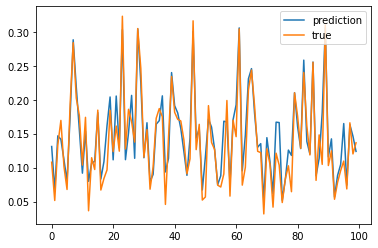

In [20]:
plt.plot(scaler2.inverse_transform(y_pred[10100:10200]), label='prediction')
plt.plot(scaler2.inverse_transform(y_test[10100:10200]), label='true')
plt.legend()

In [136]:
# https://shap.readthedocs.io/en/latest/example_notebooks/tabular_examples/model_agnostic/Multioutput%20Regression%20SHAP.html#Create-Multi-Output-Regression-Model
explainer = shap.KernelExplainer(model = model.predict, data = X[0:300,:], link = "identity")
# data = X.head(50) if X was dataframe

Using 300 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


In [127]:
# Set the index of the specific example to explain
X_idx = 100
shap_value_single = explainer.shap_values(X = X[X_idx:X_idx+1,:], nsamples = 300)
shap_value_single 

  0%|          | 0/1 [00:00<?, ?it/s]

[array([[ 0.        ,  0.        ,  0.        ,  0.        ,  0.22689915,
          0.        ,  0.        ,  0.        , -0.11496671, -0.30584907,
          0.1418401 ,  0.        ,  0.        ,  0.        ,  0.        ,
          0.1676826 , -0.20992903, -0.18873196,  0.        ,  0.08625509,
          0.        ,  0.        ,  0.        , -0.16102864,  0.        ,
          0.        ,  0.        ,  0.        ,  0.        , -0.21948504,
          0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
          0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
          0.15797096,  0.        ,  0.        ,  0.        , -0.08793348,
          0.        ,  0.        ,  0.        ,  0.        , -0.02814476,
          0.        ,  0.        ,  0.23012259,  0.        ,  0.        ,
          0.        ,  0.        ,  0.02411986,  0.        ,  0.        ,
          0.        ,  0.        , -0.26448289, -0.19770927, -0.15381329,
          0.        ,  0.        ,  0.

In [128]:
list_of_labels = ['TPD']
tuple_of_labels = list(zip(list_of_labels, range(len(list_of_labels))))

current_label = widgets.Dropdown(options=tuple_of_labels,
                              value=0,
                              description='Select Label:'
                              )

In [129]:
shap.initjs()
print(f'Current label Shown: {list_of_labels[current_label.value]}')

shap.force_plot(base_value = explainer.expected_value[current_label.value],
                shap_values = shap_value_single[current_label.value],
                features = X[X_idx:X_idx+1,:]
                )

Current label Shown: TPD


In [130]:
shap_values = explainer.shap_values(X = X[0:300,:], nsamples = 300)

  0%|          | 0/300 [00:00<?, ?it/s]

Current Label Shown: TPD



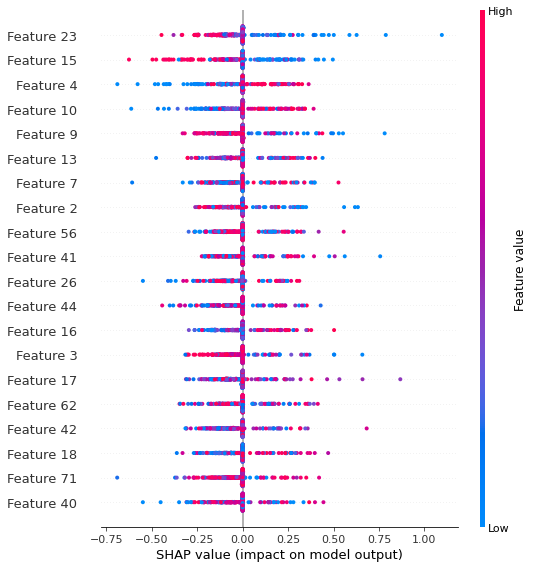

In [131]:
shap.initjs()

print(f'Current Label Shown: {list_of_labels[current_label.value]}\n')

shap.summary_plot(shap_values = shap_values[current_label.value],
                  features = X[0:300,:]
                  )

In [132]:
print(f'Current Label Shown: {list_of_labels[current_label.value]}\n')

# print the JS visualization code to the notebook
shap.initjs()

shap.force_plot(base_value = explainer.expected_value[current_label.value],
                shap_values = shap_values[current_label.value],
                features = X[0:300,:]
                )

Current Label Shown: TPD



Current Label Shown: TPD



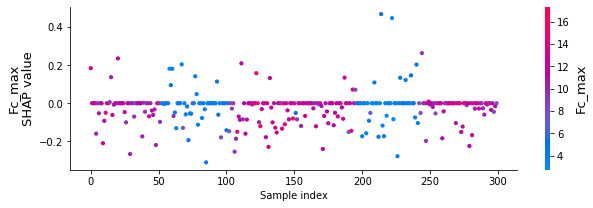

In [133]:
print(f'Current Label Shown: {list_of_labels[current_label.value]}\n')

# print the JS visualization code to the notebook
shap.initjs()

shap.monitoring_plot(ind=60, shap_values = shap_values[current_label.value],
                  features = X[0:300,:], feature_names=df.columns)